# Energy Fraud Detection: Exploratory Data Analysis

Imports for notebook:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
%matplotlib inline

#from itables import init_notebook_mode
#init_notebook_mode(all_interactive=True)

In [ ]:
mask = (df_train['monthly_cap'] != df_train['monthly_cap_calc']) & (df_train['monthly_cap_calc'].notna()) # Ignore those with missing months_num for now
mask_2 = (((df_train['invoice_date'] < '01/07/2005') | (df_train['invoice_date'] > '31/07/2005')) & 
          ((df_train['invoice_date'] < '01/01/2014') | (df_train['invoice_date'] > '31/03/2014')))
print(f"Rows with unexpected \'monthly_cap\': within dates / outside dates (total): {sum(mask&~mask_2)} / {sum(mask&mask_2)} ({sum(mask)}).")
df_temp = df_train[mask&mask_2]
df_temp



mask = (((df_train['mtr_val_old'] - df_train['mtr_val_new_prv']).abs() < 3) & # Meter alignment, with tolerance,
          (df_train['months_gap_calc'] > 1)) # Gap in invoice_dates
mask_2 = (((df_train['invoice_date'] < '01/07/2005') | (df_train['invoice_date'] > '31/07/2005')) & 
          ((df_train['invoice_date'] < '01/01/2014') | (df_train['invoice_date'] > '31/03/2014'))) # Avoid the problematic date ranges
mask = mask & mask_2
mask_2 = (df_train['monthly_cap_calc'] != df_train['monthly_cap']) & (df_train['monthly_cap_calc'].notna()) # Where there is a mismatch in expectation 
print(f"Rows with unexpected \'monthly_cap\' meeting criteria / all unexpected: {sum(mask&mask_2)} / {sum(mask_2)}.")
df_temp = df_train[mask&mask_2]
df_temp

This seems to indicate the end of a "group", i.e. a change in the meter setup. For example, it can be when 'mtr_id', 'mtr_tariff', or 'mtr_code' changes.

## Introduction

Looking at dataset of clients and their energy usage over time. The target variable is fraud, and is labelled on a per-client basis.

This is an interesting problem where data is partially corrupted, and has major inconsistencies. Furthermore, there is insufficient information to obtain target variable for all cases.

This notebook conducts the exploratory data analysis, post-cleaning. *This notebook is NOT focussed specifically on fraud detection!* That will be explored in the final section: ____. Use of the test data will be kept to a minimum, even for the purpose simply EDA.

Please refer to the main notebook, "???", for further details and continuation.

### Data Structure and Hierarchy
Please refer to main notebook for the context.

In [2]:
# This will change depending on context, but is the generic grouping to order rows.
grp_cols = ['client_id', 'mtr_type', 'mtr_tariff', 'mtr_id'] # Then to be sorted by: 'invoice_date'

## Data Import and Cleansing

As discussed, this is explained in the ______ notebook. The resulting datasets can either be imported directly (as done here), or calculated using the *unexplained* code below. The code is simply a consolidation of what was discussed in ____ notebook, made generic for any inputted dataset (to allow test set to be input).

In [3]:
# Read the CSV files
df_client_train = pd.read_csv('./client_train.csv', on_bad_lines='skip', low_memory=False)
df_train = pd.read_csv('./df_train.csv', index_col=0, on_bad_lines='skip', low_memory=False)
df_issues_train = pd.read_csv('./df_issues_train.csv', index_col=0, on_bad_lines='skip', low_memory=False)
df_removed_train = pd.read_csv('./df_removed_train.csv', index_col=0, on_bad_lines='skip', low_memory=False)

In [4]:
# Going to stitch back together:
df_train = df_train.join(df_client_train.set_index('client_id'), on='client_id', validate='m:1').copy()
df_train = df_train.join(df_issues_train.set_index('idx'), on='idx', validate='1:1').copy()
col_names = df_issues_train.columns[1:] # fillna with 0
df_train[col_names] = df_train[col_names].fillna(0)
df_train[col_names] = df_train[col_names].astype(int)
del df_client_train, df_issues_train
# Rename columns
rename_dict = {'disrict' : 'district', 
               'client_catg' : 'client_type',
               'creation_date' : 'start_date', 
               'target' : 'fraud'}
df_train.rename(columns=rename_dict, inplace=True)

In [5]:
# Fix date formats
df_train['invoice_date'] = pd.to_datetime(df_train['invoice_date']) # date [YYYY-MM-DD] -> [YYYY-MM-DD]
df_train['start_date'] = pd.to_datetime(df_train['start_date'], dayfirst=True) # date [DD/MM/YYYY] -> [YYYY-MM-DD]

In [6]:
df_train.head()

,client_id,invoice_date,mtr_tariff,mtr_id,mtr_status,mtr_code,mtr_notes,mtr_coef,usage_1,usage_2,...,usage_aux_flag,usage_flag,usage_n_aux_flag,mtr_overlap_bkd,mtr_overlap_fwd,mtr_old_rollover,mtr_new_rollover,mtr_old_adj_quant,mtr_new_adj_quant,months_num_adj
0,train_Client_0,2005-10-17,11,1335667,0,203,6,1.0,124,0,...,0,0,0,0,0,0,0,0,0,0
1,train_Client_0,2006-02-24,11,1335667,0,203,6,1.0,141,0,...,0,0,0,0,0,0,0,0,0,0
2,train_Client_0,2006-06-23,11,1335667,0,203,6,1.0,162,0,...,0,0,0,0,0,0,0,0,0,0
3,train_Client_0,2006-10-18,11,1335667,0,203,6,1.0,159,0,...,0,0,0,0,0,0,0,0,0,0
4,train_Client_0,2007-02-26,11,1335667,0,203,6,1.0,182,0,...,0,0,0,0,0,0,0,0,0,0


## Exploratory Data Analysis
There are, of course, many possible aspects to consider. Beginning with a cursory  


* Coinciding    -> How different fields interact (e.g., mtr_tariff is 30|40|45 for Gas)
* Energy Usage  -> Core point of interest
* Invoice Dates -> Do things change over time 

Going to recalculate usage as it can be useful. This function was explained in 'Data_Preparation'.

In [7]:
def Calc_Usage(df_train):
    df_train['usage_N'] = df_train.loc[:, ['usage_1', 'usage_2', 'usage_3', 'usage_4']].sum(axis=1)
    df_train['usage_n'] = (df_train['usage_N'] / df_train['mtr_coef']).round(0)
    df_train['monthly_usage'] = df_train['usage_n'].div(df_train['months_num'])
    df_train['monthly_usage_aux'] = df_train['usage_aux'].div(df_train['months_num'])
    df_train['usage_n_aux'] = df_train['usage_n'] + (df_train['usage_aux']*((df_train['usage_aux_flag'] == 1).astype(int)))
    # Calculating derived metrics:
    df_train['usage_n_calc'] = df_train['mtr_val_new'] - df_train['mtr_val_old']
    df_train['usage_aux_calc'] = df_train['usage_n_calc'] - df_train['usage_n']
    df_train['mtr_coef_calc'] = (df_train['usage_N'] / df_train['usage_n_calc']).round(1)
    df_train['mtr_val_new_calc'] = df_train['mtr_val_old'] + df_train['usage_n'].round(0)
    df_train['mtr_val_old_calc'] = df_train['mtr_val_new'] - df_train['usage_n'].round(0)
    return df_train
df_train = Calc_Usage(df_train)

Looking at quantile data. 'View_Quantiles()' provides simple table to compare given groupings of given metric. 'Plot_Quantiles()' plots this for visual comparison, the y-axis limit is based on 1-99% quantiles.

In [8]:
col_names = [0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00]

In [9]:
def View_Quantiles(df, group, metric, col_names=col_names):
    return(df.groupby([group], observed=True)[metric]
           .quantile(col_names).reset_index()
           .pivot_table(index=group, columns='level_1', values=metric).round(0))

In [10]:
def Plot_Quantiles(df, group, metric, col_names=col_names):
    df = View_Quantiles(df, group, metric)

    # Plot
    fig, ax = plt.subplots(figsize=(1+len(df), 6))

    for i, (group_val, quantiles) in enumerate(df.iterrows()):
        x = [i - 0.3, i + 0.3]  # Range for each group (horizontal width)
        
        # Extract quantiles
        q0, q1, q5, q25, q50, q75, q95, q99, q100 = quantiles.values
        
        # Shaded regions
        ax.fill_between(x, q1, q99, color="orange", label="1th-99th" if i == 0 else None)
        ax.fill_between(x, q5, q95, color="yellow", label="5th-95th" if i == 0 else None)
        ax.fill_between(x, q25, q75, color="green", label="25th-75th" if i == 0 else None)
        # Min, Median, Max lines
        ax.hlines(q0, x[0], x[1], color="red", linewidth=2, label="Minimum" if i == 0 else None)
        ax.hlines(q50, x[0], x[1], color="black", linewidth=2, label="Median" if i == 0 else None)
        ax.hlines(q100, x[0], x[1], color="red", linewidth=2, label="Maximum" if i == 0 else None)

    ax.set_xticks(range(len(df)))
    ax.set_xticklabels(df.index)
    ax.axis(ymin = df[0.01].min(), ymax = df[0.99].max())
    ax.set_xlabel(group)
    ax.set_ylabel(metric)
    ax.legend()

Looking at energy usage:

Could look at 'usage_n_aux' which would be recorded use. An issue with this metric is that it does not account for the duration the invoice spanned. Going to use 'monthly_usage_n_aux', which divides by 'months_num'. Using 'usage_n_aux' will mean that many of the 'mtr_tariff' == 9 will be counted twice, once as-is, and once rolled into the coinciding 'mtr_tariff' == 11 invoice. This is rare enough to not be a concern here.

In [11]:
df_train['monthly_usage_n_aux'] = df_train['usage_n_aux'].div(df_train['months_num'])

Electricity vs Gas:

In [12]:
# Comparing Electricity to Gas usage
print(df_train['mtr_type'].value_counts())
View_Quantiles(df_train, 'mtr_type', 'monthly_usage_n_aux')

mtr_type
ELEC    3037164
GAZ     1317430
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_type,,,,,,,,,
ELEC,-1.0,0.0,0.0,58.0,114.0,194.0,625.0,2592.0,499836.0
GAZ,0.0,0.0,0.0,9.0,22.0,44.0,200.0,1040.0,499955.0


Generally higher Electricity usage, though unknown units for both. Since there are many 0 values, they distort the outputs. These will be ignored for now.

In [13]:
# Comparing Electricity to Gas usage (filtered out 0)
mask = (df_train['monthly_usage_n_aux'] > 0)
print(df_train.loc[mask, 'mtr_type'].value_counts())
View_Quantiles(df_train[mask], 'mtr_type', 'monthly_usage_n_aux')

mtr_type
ELEC    2841789
GAZ     1154154
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_type,,,,,,,,,
ELEC,0.0,1.0,11.0,70.0,121.0,204.0,665.0,2714.0,499836.0
GAZ,0.0,0.0,3.0,14.0,26.0,49.0,225.0,1216.0,499955.0


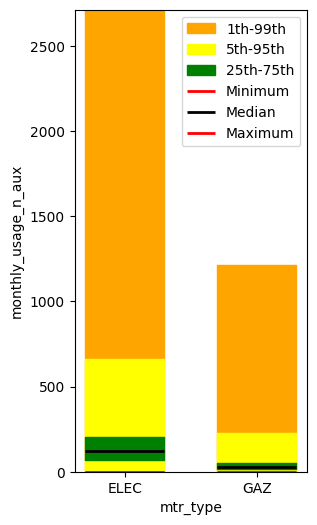

In [14]:
Plot_Quantiles(df_train[mask], 'mtr_type', 'monthly_usage_n_aux')

There is a skew in the data relative to the median, with a greater spread for values above median than below. This is quite typical of usage-like data that cannot be negative. There are over twice as many Electricity invoices than Gas ones.

Client Type vs (Electricty vs Gas):

In [15]:
# Comparing Client Type Electricity Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'client_type'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'client_type', 'monthly_usage_n_aux')

client_type
11    2731711
51      69947
12      40131
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
client_type,,,,,,,,,
11,0.0,1.0,10.0,69.0,118.0,194.0,490.0,1297.0,205272.0
12,0.0,0.0,4.0,48.0,121.0,255.0,1056.0,3282.0,196739.0
51,0.0,12.0,128.0,805.0,1669.0,3143.0,7791.0,17000.0,499836.0


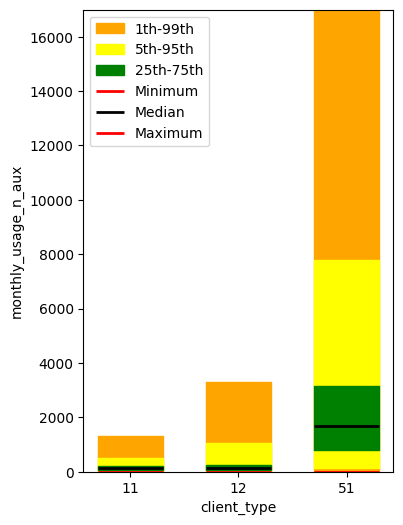

In [16]:
Plot_Quantiles(df_train[mask & mask_2], 'client_type', 'monthly_usage_n_aux')

In [17]:
# Comparing Client Type Gas Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'client_type'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'client_type', 'monthly_usage_n_aux')

client_type
11    1112714
51      26400
12      15040
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
client_type,,,,,,,,,
11,0.0,0.0,3.0,14.0,26.0,46.0,173.0,424.0,14597.0
12,0.0,0.0,1.0,11.0,26.0,65.0,326.0,726.0,4158.0
51,0.0,5.0,28.0,231.0,746.0,1771.0,3429.0,5627.0,499955.0


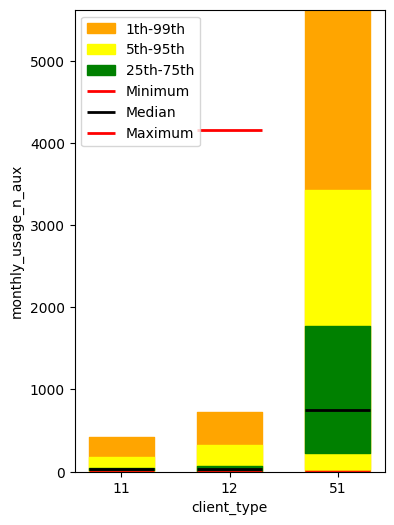

In [18]:
Plot_Quantiles(df_train[mask & mask_2], 'client_type', 'monthly_usage_n_aux')

'client_type' == 11 has lower overall electricity usage than 'client_type_12', but seems to have a higher floor. This extends to gas usage as well. This is quite interesting a indicates something deeper. For example, it may be that 'client_type' == 11 only use one meter and/or tariff at a time, and so 

'client_type' == 51 has typically has much higher usage in both electricity and gas than the other two.

Looking at client_type over time:

In [20]:
# Comparing Tariff over time (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'client_type'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'client_type', 'invoice_date')

client_type
11    2731711
51      69947
12      40131
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
client_type,,,,,,,,,
11,1977-06-23,2005-09-16,2006-06-26,2009-08-26,2013-03-22,2016-06-23,2019-01-17,2019-07-26,2019-09-11
12,1978-12-15,2005-02-11,2006-05-17,2009-05-07,2012-09-06,2016-02-09,2018-11-28,2019-07-15,2019-09-11
51,2002-07-02,2006-05-16,2007-10-02,2011-05-03,2014-10-02,2017-07-04,2019-04-02,2019-09-03,2019-09-03


In [21]:
# Comparing Tariff over time (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'client_type'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'client_type', 'invoice_date')

client_type
11    1112714
51      26400
12      15040
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
client_type,,,,,,,,,
11,1981-01-07,2006-01-04,2007-02-05 00:00:00,2010-11-19 00:00:00,2014-03-11,2016-12-23 00:00:00,2019-02-08,2019-08-02,2019-09-11
12,1985-03-25,2005-11-15,2006-09-21 00:00:00,2010-02-09 18:00:00,2013-06-13,2016-08-11 06:00:00,2019-01-09,2019-08-02,2019-09-11
51,2004-04-27,2006-07-04,2007-12-04 22:48:00,2011-06-02 00:00:00,2014-09-02,2017-05-03 00:00:00,2019-04-02,2019-09-03,2019-09-03


Seem relatively similar.

District vs (Electricty vs Gas):

In [49]:
# Comparing District Electricity Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'district'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'district', 'monthly_usage_n_aux')

district
62    888878
63    669056
60    652642
69    631213
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
district,,,,,,,,,
60,0.0,1.0,10.0,66.0,121.0,222.0,1035.0,3891.0,205272.0
62,0.0,1.0,10.0,71.0,120.0,194.0,483.0,1711.0,49999.0
63,0.0,1.0,13.0,68.0,109.0,170.0,379.0,1182.0,67639.0
69,0.0,1.0,9.0,78.0,140.0,248.0,1067.0,3717.0,499836.0


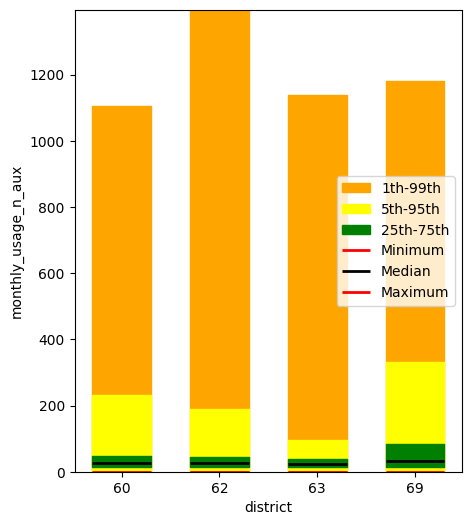

In [57]:
Plot_Quantiles(df_train[mask & mask_2], 'district', 'monthly_usage_n_aux')

In [51]:
# Comparing District Gas Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'district'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'district', 'monthly_usage_n_aux')

district
69    323180
62    318417
63    283621
60    228936
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
district,,,,,,,,,
60,0.0,0.0,2.0,13.0,25.0,46.0,231.0,1106.0,21533.0
62,0.0,0.0,4.0,14.0,26.0,44.0,190.0,1396.0,14597.0
63,0.0,1.0,4.0,14.0,24.0,37.0,96.0,1138.0,10598.0
69,0.0,0.0,2.0,15.0,33.0,83.0,333.0,1181.0,499955.0


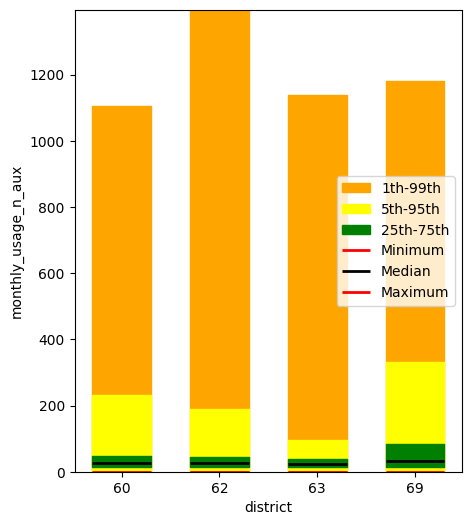

In [58]:
Plot_Quantiles(df_train[mask & mask_2], 'district', 'monthly_usage_n_aux')

'district' == 69 seems to use more energy than the others. 'district' == 63 seems to use slightly less than 'district' == 60|62. This is most apparent when looking above the median.

Looking at district over time:

In [23]:
# Comparing Tariff over time (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'district'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'district', 'invoice_date')

district
62    888878
63    669056
60    652642
69    631213
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
district,,,,,,,,,
60,1977-06-23,2005-07-06,2006-04-03,2009-04-16,2012-09-20,2016-01-25,2018-12-04,2019-07-08,2019-09-11
62,1978-03-10,2005-10-11,2006-07-06,2009-10-05,2013-04-16,2016-08-30,2019-02-12,2019-08-01,2019-09-11
63,1977-09-12,2005-11-14,2006-08-03,2009-11-05,2013-07-08,2016-09-22,2019-02-07,2019-07-30,2019-09-11
69,1977-11-25,2005-11-11,2006-09-05,2009-12-08,2013-06-03,2016-08-19,2018-12-26,2019-08-02,2019-09-11


In [24]:
# Comparing Tariff over time (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'district'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'district', 'invoice_date')

district
69    323180
62    318417
63    283621
60    228936
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
district,,,,,,,,,
60,1981-01-07,2005-09-09,2006-09-12,2010-05-21,2013-09-24,2016-09-21,2019-01-30,2019-07-19,2019-09-11
62,1983-10-10,2005-12-23,2007-03-01,2010-11-29,2014-03-21,2017-02-13,2019-03-06,2019-08-02,2019-09-11
63,1994-12-15,2006-02-10,2007-05-11,2011-05-05,2014-06-04,2017-01-24,2019-02-20,2019-08-02,2019-09-11
69,1990-07-18,2006-02-03,2007-03-28,2010-12-20,2014-05-02,2016-12-06,2019-01-11,2019-08-08,2019-09-11


Look similar

Looking at Region vs (Electricity vs Gas)

In [25]:
# Comparing Region Electricity Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'region'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'region', 'monthly_usage_n_aux')

region
101    698468
311    292166
104    235422
301    208525
107    186970
103    163151
306    128428
303    127412
310    106233
312    105402
302     97215
304     87640
309     81602
307     71690
305     63037
313     51820
371     45318
105     31659
308     19755
372     14217
106     13522
379     10375
399      1273
206       489
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
region,,,,,,,,,
101,0.0,1.0,10.0,67.0,121.0,219.0,971.0,3734.0,205272.0
103,0.0,1.0,9.0,82.0,153.0,298.0,1821.0,5314.0,172284.0
104,0.0,1.0,10.0,82.0,149.0,265.0,1008.0,3370.0,56576.0
105,0.0,1.0,9.0,78.0,138.0,240.0,974.0,3457.0,49854.0
106,0.0,1.0,10.0,82.0,156.0,295.0,1284.0,5581.0,21247.0
107,0.0,1.0,8.0,72.0,123.0,201.0,581.0,2161.0,499836.0
206,0.0,0.0,2.0,43.0,142.0,299.0,580.0,810.0,2366.0
301,0.0,1.0,12.0,72.0,118.0,187.0,463.0,1913.0,49970.0
302,0.0,1.0,9.0,67.0,115.0,183.0,438.0,1399.0,13963.0


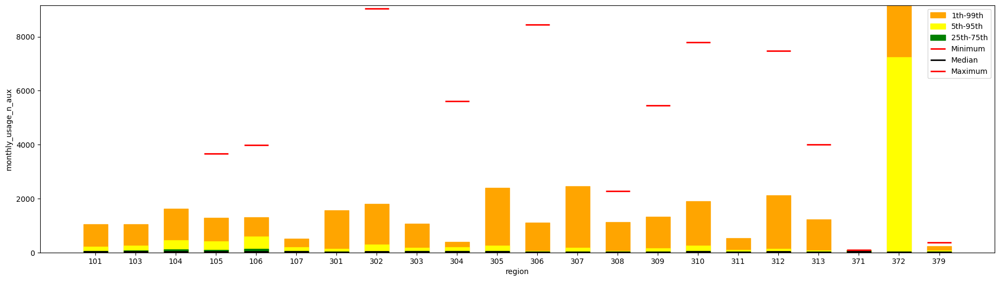

In [30]:
# There are maybe too many, going to remove the smaller ones
mask_3 = ~df_train['region'].isin([206, 399])
Plot_Quantiles(df_train[mask & mask_2 & mask_3], 'region', 'monthly_usage_n_aux')

In [27]:
# Comparing Region Gas Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'region'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'region', 'monthly_usage_n_aux')

region
101    257016
311    166506
104    114178
103    102192
107     82772
301     82343
303     53104
310     44641
304     43838
306     35990
309     35629
312     33754
302     32415
305     22424
105     15831
313     14365
106      7838
307      4019
308      3211
379       998
372       632
206       369
399        85
371         4
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
region,,,,,,,,,
101,0.0,0.0,3.0,13.0,25.0,45.0,214.0,1044.0,21533.0
103,0.0,0.0,2.0,14.0,32.0,80.0,260.0,1044.0,10199.0
104,0.0,0.0,3.0,17.0,37.0,106.0,457.0,1626.0,499955.0
105,0.0,1.0,4.0,18.0,36.0,92.0,420.0,1283.0,3661.0
106,0.0,0.0,4.0,18.0,42.0,134.0,585.0,1296.0,3979.0
107,0.0,0.0,2.0,14.0,29.0,61.0,196.0,517.0,9460.0
206,0.0,0.0,1.0,10.0,29.0,93.0,250.0,356.0,426.0
301,0.0,0.0,4.0,14.0,24.0,40.0,143.0,1561.0,14016.0
302,0.0,0.0,4.0,15.0,25.0,42.0,291.0,1810.0,9050.0


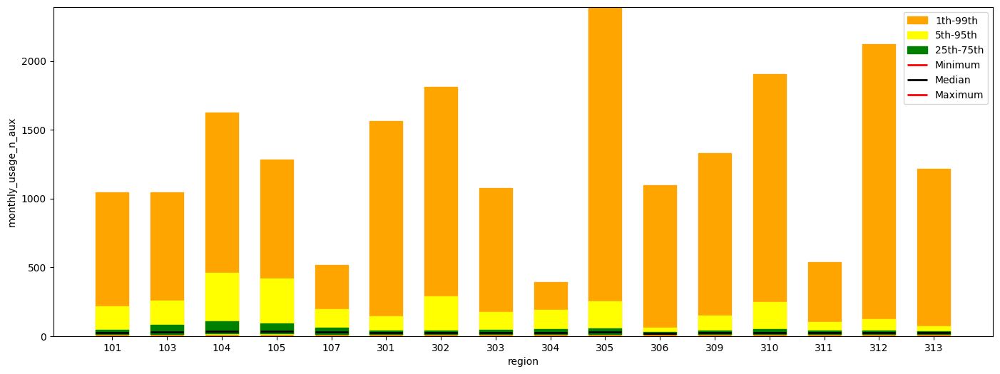

In [32]:
# There are maybe too many, going to remove the smaller ones
mask_3 = ~df_train['region'].isin([106, 307, 308, 379, 372, 206, 399, 371])
Plot_Quantiles(df_train[mask & mask_2 & mask_3], 'region', 'monthly_usage_n_aux')

Nothing too clear stands out

Looking at regions over time:

In [33]:
# Comparing Region over time (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'region'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'region', 'invoice_date')

region
101    698468
311    292166
104    235422
301    208525
107    186970
103    163151
306    128428
303    127412
310    106233
312    105402
302     97215
304     87640
309     81602
307     71690
305     63037
313     51820
371     45318
105     31659
308     19755
372     14217
106     13522
379     10375
399      1273
206       489
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
region,,,,,,,,,
101,1977-06-23,2005-07-07 00:00:00,2006-04-11,2009-04-24,2012-09-27,2016-02-02,2018-12-12 00:00:00.000000000,2019-07-15 07:55:11.999996416,2019-09-11
103,1977-11-25,2006-01-13 00:00:00,2007-01-24,2010-09-06,2014-01-20,2016-12-02,2019-01-18 00:00:00.000000000,2019-09-05 00:00:00.000000000,2019-09-11
104,1980-07-10,2005-11-01 00:00:00,2006-07-20,2009-07-14,2013-03-26,2016-08-02,2018-11-29 00:00:00.000000000,2019-08-06 00:00:00.000000000,2019-09-11
105,1982-02-03,2005-10-11 00:00:00,2006-06-16,2009-02-25,2012-05-29,2016-02-02,2018-05-22 00:00:00.000000000,2019-02-05 00:00:00.000000000,2019-09-03
106,1978-10-26,1998-11-02 10:04:48,2006-05-02,2008-12-22,2012-04-25,2015-12-28,2018-08-17 00:00:00.000000000,2019-09-02 00:00:00.000000000,2019-09-03
107,1980-04-17,2005-11-08 00:00:00,2006-07-28,2009-11-17,2013-05-22,2016-06-09,2019-01-07 00:00:00.000000000,2019-06-14 00:00:00.000000000,2019-09-11
206,2011-11-09,2011-11-10 00:00:00,2012-03-14,2013-11-19,2015-11-10,2017-07-10,2018-07-08 00:00:00.000000000,2019-03-12 00:00:00.000000000,2019-03-12
301,1978-03-10,2005-10-03 00:00:00,2006-06-16,2009-07-06,2012-12-17,2016-06-24,2019-02-05 00:00:00.000000000,2019-07-29 00:00:00.000000000,2019-09-11
302,1978-12-26,2005-10-18 00:00:00,2006-07-14,2009-11-03,2013-03-21,2016-11-02,2019-03-07 00:00:00.000000000,2019-08-02 00:00:00.000000000,2019-09-04


In [34]:
# Comparing Region over time (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'region'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'region', 'invoice_date')

region
101    257016
311    166506
104    114178
103    102192
107     82772
301     82343
303     53104
310     44641
304     43838
306     35990
309     35629
312     33754
302     32415
305     22424
105     15831
313     14365
106      7838
307      4019
308      3211
379       998
372       632
206       369
399        85
371         4
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
region,,,,,,,,,
101,1981-01-07,2005-09-13 00:00:00,2006-09-12 00:00:00,2010-05-10 00:00:00,2013-09-19 00:00:00,2016-09-21,2019-02-04 00:00:00,2019-08-01 00:00:00.000000000,2019-09-11
103,1990-08-28,2006-05-08 00:00:00,2007-09-10 00:00:00,2011-05-13 00:00:00,2014-05-13 00:00:00,2017-01-02,2019-01-11 00:00:00,2019-09-05 00:00:00.000000000,2019-09-11
104,1990-07-18,2006-01-05 00:00:00,2006-12-01 00:00:00,2010-07-19 00:00:00,2013-12-17 00:00:00,2016-11-28,2018-12-13 00:00:00,2019-08-08 00:00:00.000000000,2019-09-11
105,1994-07-19,2005-10-21 00:00:00,2006-10-13 00:00:00,2009-11-05 00:00:00,2013-05-28 00:00:00,2016-05-26,2018-05-23 00:00:00,2019-02-22 00:00:00.000000000,2019-09-03
106,1996-07-05,2005-12-21 00:00:00,2006-08-24 00:00:00,2009-08-19 00:00:00,2013-04-26 00:00:00,2016-04-22,2018-12-26 00:00:00,2019-09-02 00:00:00.000000000,2019-09-03
107,1996-09-09,2006-03-17 00:00:00,2007-07-04 00:00:00,2011-06-17 00:00:00,2014-09-25 00:00:00,2017-01-24,2019-01-28 00:00:00,2019-06-17 00:00:00.000000000,2019-09-11
206,2011-11-09,2011-11-10 00:00:00,2013-03-18 00:00:00,2014-07-03 00:00:00,2016-03-11 00:00:00,2017-07-10,2018-11-12 00:00:00,2019-03-12 00:00:00.000000000,2019-03-12
301,1987-03-10,2006-03-17 00:00:00,2007-07-30 00:00:00,2011-03-10 00:00:00,2014-04-02 00:00:00,2017-03-08,2019-03-14 00:00:00,2019-08-06 00:00:00.000000000,2019-09-11
302,1983-10-10,2005-11-15 00:00:00,2007-03-15 00:00:00,2010-12-13 00:00:00,2014-04-04 00:00:00,2017-03-14,2019-03-13 00:00:00,2019-08-04 13:55:12.000000256,2019-09-03


Nothing stands out. Maybe R399 seems a bit older?

Comparing 'district' to 'region'. Going to count number of unique 'client_id' rather than just number of rows to remove that variable.

In [35]:
# Comparing District and Region (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['district', 'region']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,district,region,count,client_count,%_of_client,%_of_pop
0,60,101,30581,30581,100.0,23.3
1,62,301,9312,39338,23.7,7.1
2,62,302,4183,39338,10.6,3.2
3,62,303,5869,39338,14.9,4.5
4,62,304,3740,39338,9.5,2.8
5,62,305,2652,39338,6.7,2.0
6,62,307,3262,39338,8.3,2.5
7,62,308,11,39338,0.0,0.0
8,62,309,3571,39338,9.1,2.7
9,62,310,4734,39338,12.0,3.6


All of D60 is R101

In [36]:
# Comparing District and Region (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['region', 'district']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['region']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='region')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,region,district,count,client_count,%_of_client,%_of_pop
0,101,60,30581,32385,94.4,23.3
1,101,63,1804,32385,5.6,1.4
2,103,69,8685,8685,100.0,6.6
3,104,69,12313,12313,100.0,9.4
4,105,69,1593,1593,100.0,1.2
5,106,69,679,679,100.0,0.5
6,107,69,9758,9758,100.0,7.4
7,206,69,51,51,100.0,0.0
8,301,62,9312,9312,100.0,7.1
9,302,62,4183,4183,100.0,3.2


In [53]:
# Comparing District and Region (Electricty)
df_temp = df_train[(df_train['region'] == 305) & (df_train['district'] == 63)]

Looking to see R101 D60 v D63

In [38]:
df_temp = df_train[df_train['region'] == 101]

In [48]:
# Comparing District over time (Electricity) for Region 101 NOT filtering out 0
mask_2 = (df_train['mtr_type'] == 'ELEC')
mask_3 = (df_train['region'] == 101)
print(df_train.loc[mask_2 & mask_3, 'district'].value_counts())
df_temp = df_train[mask_2 & mask_3].groupby(['district', 'mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask_2 & mask_3].groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask_2 & mask_3, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

district
60    697390
63     48086
Name: count, dtype: int64


,district,mtr_tariff,count,client_count,%_of_client,%_of_pop
0,60,9,95,31501,0.3,0.3
1,60,10,5944,31501,18.9,17.8
2,60,11,26055,31501,82.7,78.1
3,60,12,3,31501,0.0,0.0
4,60,13,3,31501,0.0,0.0
5,60,14,3,31501,0.0,0.0
6,60,15,767,31501,2.4,2.3
7,60,29,321,31501,1.0,1.0
8,63,9,4,1841,0.2,0.0
9,63,10,179,1841,9.7,0.5


In [50]:
# Comparing District over time (Electricity) for Region 101 NOT filtering out 0
mask_2 = (df_train['mtr_type'] == 'ELEC')
mask_3 = (df_train['region'] == 101)
print(df_train.loc[mask_2 & mask_3, 'district'].value_counts())
View_Quantiles(df_train[mask_2 & mask_3], 'district', 'monthly_usage_n_aux')

district
60    697390
63     48086
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
district,,,,,,,,,
60,0.0,0.0,0.0,54.0,113.0,210.0,967.0,3737.0,205272.0
63,0.0,0.0,0.0,62.0,112.0,178.0,353.0,637.0,8132.0


In [ ]:
# Comparing District over time (Gas) for Region 101 NOT filtering out 0
mask_2 = (df_train['mtr_type'] == 'GAZ')
mask_3 = (df_train['region'] == 101)
print(df_train.loc[mask_2 & mask_3, 'district'].value_counts())
View_Quantiles(df_train[mask_2 & mask_3], 'district', 'monthly_usage_n_aux')

district
60    268111
63     30027
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
district,,,,,,,,,
60,0.0,0.0,0.0,7.0,20.0,40.0,199.0,964.0,21533.0
63,0.0,0.0,0.0,12.0,23.0,38.0,99.0,253.0,4168.0


In [56]:
# Comparing monthly cap by mtr_tariff (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'monthly_cap')

mtr_tariff
40    1138359
45      15775
30         20
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_tariff,,,,,,,,,
45,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.0


In [60]:
# Comparing mtr_tariff over monthly_cap (Gas) for Region 101
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
df_temp = df_train[mask & mask_2].groupby(['mtr_tariff', 'monthly_cap']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='mtr_tariff')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

mtr_tariff
40    1138359
45      15775
30         20
Name: count, dtype: int64


,mtr_tariff,monthly_cap,count,client_count,%_of_client,%_of_pop
0,45,200.0,1,355,0.3,0.0


In [57]:
# Comparing monthly cap by mtr_tariff (Electricity)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'monthly_cap')

mtr_tariff
11    2526901
10     262006
15      23974
13       7719
14       6317
29       5900
9        5509
12       3377
21         83
18          3
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_tariff,,,,,,,,,
10,50.0,50.0,50.0,50.0,50.0,50.0,200.0,200.0,200.0
11,20.0,200.0,200.0,200.0,200.0,300.0,300.0,300.0,900.0


In [61]:
# Comparing mtr_tariff over monthly_cap (Electricity)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
df_temp = df_train[mask & mask_2].groupby(['mtr_tariff', 'monthly_cap']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='mtr_tariff')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

mtr_tariff
11    2526901
10     262006
15      23974
13       7719
14       6317
29       5900
9        5509
12       3377
21         83
18          3
Name: count, dtype: int64


,mtr_tariff,monthly_cap,count,client_count,%_of_client,%_of_pop
0,10,50.000000,9778,12359,79.1,7.4
1,10,55.555556,1,12359,0.0,0.0
2,10,57.142857,1,12359,0.0,0.0
3,10,58.333333,2,12359,0.0,0.0
4,10,60.000000,2,12359,0.0,0.0
5,10,62.500000,4,12359,0.0,0.0
6,10,66.666667,14,12359,0.1,0.0
7,10,75.000000,40,12359,0.3,0.0
8,10,100.000000,211,12359,1.7,0.2
9,10,133.333333,5,12359,0.0,0.0


In [68]:
df_temp = df_train[((df_train['monthly_cap'] != 50) & (df_train['monthly_cap'] != 100) & (df_train['monthly_cap'] != 200) & (df_train['monthly_cap'] != 300)) & (df_train['monthly_cap'].notna())] # Those this potential issues
df_temp['monthly_cap_calc'] = df_temp['monthly_cap'].div(df_temp['months_num_calc'].round(0))*df_temp['months_num']

C:\Users\mhoss\AppData\Local\Temp\ipykernel_25972\2952823458.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['monthly_cap_calc'] = df_temp['monthly_cap'].div(df_temp['months_num_calc'].round(0))*df_temp['months_num']


# HERE!

R101 is 95% D60, 
R101 is 5% D63.
R103|104|105|106|107|206 is 100% D69
R301 | 302 | 303 | 304 | 305*| XXX | 307 | XXX | 309 | 310 | 311 | 312 | 313 | 371 | 372 | 379 | XXX is 100% D62
RXXX | XXX | XXX | XXX | XXX | 306 | XXX | 308*| XXX | XXX | XXX | XXX | XXX | XXX | XXX | XXX | 399* is 100% D63

Although not easily described pattern, there is clearly one. Not sure why Region is rarely split. R101, R305, R308, R399 are split.

Comparing 'district' to 'client_type'. Going to count number of unique 'client_id' rather than just number of rows to remove that variable.

In [77]:
# Comparing District and Client Type (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['district', 'client_type']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,district,client_type,count,client_count,%_of_client,%_of_pop
0,60,11,29616,30581,96.8,22.5
1,60,12,535,30581,1.7,0.4
2,60,51,430,30581,1.4,0.3
3,62,11,38260,39338,97.3,29.1
4,62,12,764,39338,1.9,0.6
5,62,51,314,39338,0.8,0.2
6,63,11,27845,28407,98.0,21.2
7,63,12,352,28407,1.2,0.3
8,63,51,210,28407,0.7,0.2
9,69,11,31852,33079,96.3,24.2


In [76]:
# Comparing District and Client Type (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train[mask & mask_2].groupby(['district', 'client_type']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,district,client_type,count,client_count,%_of_client,%_of_pop
0,60,11,11263,11564,97.4,20.1
1,60,12,180,11564,1.6,0.3
2,60,51,121,11564,1.0,0.2
3,62,11,13763,14124,97.4,24.6
4,62,12,250,14124,1.8,0.4
5,62,51,111,14124,0.8,0.2
6,63,11,12106,12292,98.5,21.6
7,63,12,101,12292,0.8,0.2
8,63,51,85,12292,0.7,0.2
9,69,11,17477,17997,97.1,31.2


Observations:
* D69 has more CT51 relatively than the others.
* D62 has more CT12 relatively than the others. (slightly)
* D63 has less CT12 relatively than the others.
* They are otherwise somewhat comparable.

Conclusions:
* This could explain D69's elevated energy usage as would be driven by more CT51. 
* Similarly, D63 also has fewer CT12, which would lead to lower energy usage.

mtr tariff

In [78]:
# Comparing Tariff Electricity Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'monthly_usage_n_aux')

mtr_tariff
11    2526901
10     262006
15      23974
13       7719
14       6317
29       5900
9        5509
12       3377
21         83
18          3
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_tariff,,,,,,,,,
9,0.0,8.0,38.0,111.0,186.0,304.0,725.0,1435.0,14476.0
10,0.0,1.0,8.0,54.0,98.0,150.0,286.0,464.0,105026.0
11,0.0,1.0,12.0,73.0,124.0,210.0,720.0,2899.0,499836.0
12,0.0,0.0,1.0,16.0,62.0,176.0,709.0,2118.0,39388.0
13,0.0,0.0,4.0,47.0,174.0,538.0,2237.0,5248.0,15645.0
14,0.0,0.0,2.0,36.0,142.0,429.0,1635.0,4373.0,14620.0
15,0.0,0.0,0.0,9.0,43.0,97.0,234.0,398.0,1588.0
18,48.0,48.0,48.0,50.0,52.0,75.0,93.0,97.0,98.0
21,1.0,1.0,3.0,17.0,74.0,296.0,1477.0,2345.0,2393.0


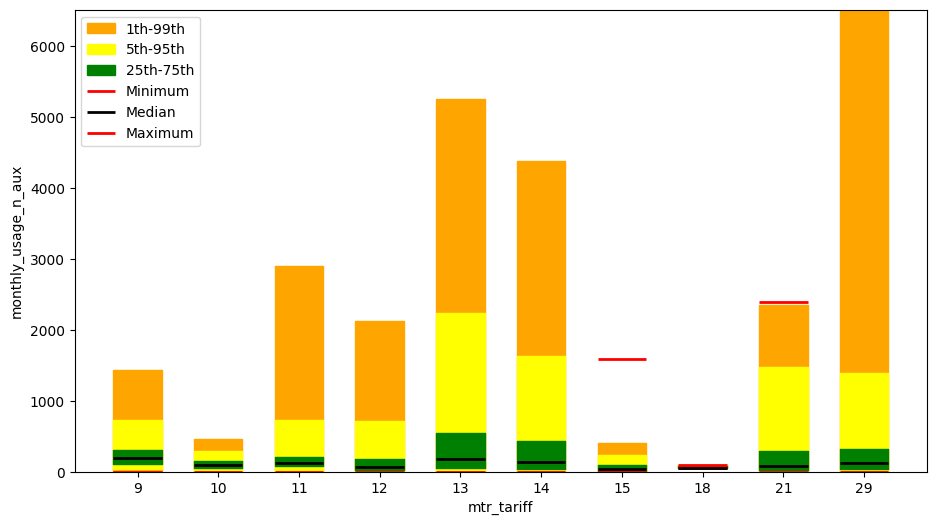

In [80]:
Plot_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'monthly_usage_n_aux')

In [81]:
# Comparing Tariff Gas Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'monthly_usage_n_aux')

mtr_tariff
40    1138359
45      15775
30         20
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_tariff,,,,,,,,,
30,4.0,5.0,6.0,17.0,74.0,162.0,268.0,275.0,277.0
40,0.0,0.0,3.0,14.0,26.0,47.0,187.0,494.0,9856.0
45,0.0,8.0,93.0,729.0,1505.0,2364.0,4223.0,6495.0,499955.0


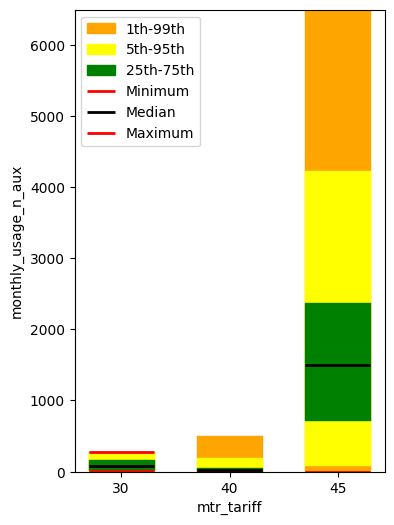

In [82]:
Plot_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'monthly_usage_n_aux')

For Electricity: 
* MT13 MT14 MT21 MT29 seem have to have highest usage. MT13 seems the highest.
* MT9 MT11 MT12 seems to have middle usage.
* MT10 MT15 MT18 seem to have lowest usage.
For Gas:
* MT45 seems much higher usage than MT30 or MT40

Comparing 'mtr_tariff' to 'client_type'. Going to count number of unique 'client_id' rather than just number of rows to remove that variable.

*Caution:* A 'client_id' can have multiple 'mtr_tariff', therefore '%_of_client', etc., will not sum to 100%! 

In [83]:
# Comparing Client Type and Tariff (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['client_type', 'mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['client_type']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='client_type')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,client_type,mtr_tariff,count,client_count,%_of_client,%_of_pop
0,11,9,648,127573,0.5,0.5
1,11,10,12158,127573,9.5,9.3
2,11,11,116063,127573,91.0,88.3
3,11,12,282,127573,0.2,0.2
4,11,13,480,127573,0.4,0.4
5,11,14,438,127573,0.3,0.3
6,11,15,2416,127573,1.9,1.8
7,11,18,1,127573,0.0,0.0
8,11,21,8,127573,0.0,0.0
9,11,29,447,127573,0.4,0.3


In [84]:
# Comparing Client Type and Tariff (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train[mask & mask_2].groupby(['client_type', 'mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['client_type']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='client_type')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,client_type,mtr_tariff,count,client_count,%_of_client,%_of_pop
0,11,30,8,54609,0.0,0.0
1,11,40,54460,54609,99.7,97.3
2,11,45,150,54609,0.3,0.3
3,12,30,1,808,0.1,0.0
4,12,40,800,808,99.0,1.4
5,12,45,7,808,0.9,0.0
6,51,40,372,560,66.4,0.7
7,51,45,198,560,35.4,0.4


In [16]:
# Comparing Tariff and Client Type (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['mtr_tariff', 'client_type']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='mtr_tariff')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,mtr_tariff,client_type,count,client_count,%_of_client,%_of_pop
0,9,11,648,679,95.4,0.5
1,9,12,19,679,2.8,0.0
2,9,51,12,679,1.8,0.0
3,10,11,12158,12359,98.4,9.3
4,10,12,187,12359,1.5,0.1
5,10,51,14,12359,0.1,0.0
6,11,11,116063,119650,97.0,88.3
7,11,12,1963,119650,1.6,1.5
8,11,51,1624,119650,1.4,1.2
9,12,11,282,318,88.7,0.2


In [17]:
# Comparing Tariff and Client Type (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train[mask & mask_2].groupby(['mtr_tariff', 'client_type']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='mtr_tariff')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,mtr_tariff,client_type,count,client_count,%_of_client,%_of_pop
0,30,11,8,9,88.9,0.0
1,30,12,1,9,11.1,0.0
2,40,11,54460,55632,97.9,97.3
3,40,12,800,55632,1.4,1.4
4,40,51,372,55632,0.7,0.7
5,45,11,150,355,42.3,0.3
6,45,12,7,355,2.0,0.0
7,45,51,198,355,55.8,0.4


Electricity (MT11 is the main type. Comparing to it):
* MT9, MT29: higher CT12 and CT51, fewer CT11.
* MT10, MT15: much fewer CT51 (like MT12 and co.).
* MT12, MT13, MT14: more CT12 , much fewer CT51 (like MT10 and co.).
* MT18, MT21: too rare

Gas:
* MT40: much fewer CT51 and more more CT11
* MT45: much more CT51 and much less CT11
* MT30: too rare. Seems more like MT40 than MT45.

Comparing 'mtr_tariff' to 'district'. Going to count number of unique 'client_id' rather than just number of rows to remove that variable.

*Caution:* A 'client_id' can have multiple 'mtr_tariff', therefore '%_of_client', etc., will not sum to 100%! 

In [18]:
# Comparing District and Tariff (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['district', 'mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,district,mtr_tariff,count,client_count,%_of_client,%_of_pop
0,60,9,95,30581,0.3,0.1
1,60,10,5700,30581,18.6,4.3
2,60,11,25292,30581,82.7,19.2
3,60,12,1,30581,0.0,0.0
4,60,13,1,30581,0.0,0.0
5,60,14,1,30581,0.0,0.0
6,60,15,443,30581,1.4,0.3
7,60,29,245,30581,0.8,0.2
8,62,9,212,39338,0.5,0.2
9,62,10,3465,39338,8.8,2.6


In [19]:
# Comparing District and Tariff (Gaz)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train[mask & mask_2].groupby(['district', 'mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,district,mtr_tariff,count,client_count,%_of_client,%_of_pop
0,60,30,9,11564,0.1,0.0
1,60,40,11455,11564,99.1,20.5
2,60,45,109,11564,0.9,0.2
3,62,40,14041,14124,99.4,25.1
4,62,45,87,14124,0.6,0.2
5,63,40,12230,12292,99.5,21.8
6,63,45,63,12292,0.5,0.1
7,69,40,17906,17997,99.5,32.0
8,69,45,96,17997,0.5,0.2


In [20]:
# Comparing Tariff and District (Electricty)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['mtr_tariff', 'district']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='mtr_tariff')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,mtr_tariff,district,count,client_count,%_of_client,%_of_pop
0,9,60,95,679,14.0,0.1
1,9,62,212,679,31.2,0.2
2,9,63,70,679,10.3,0.1
3,9,69,302,679,44.5,0.2
4,10,60,5700,12359,46.1,4.3
5,10,62,3465,12359,28.0,2.6
6,10,63,1817,12359,14.7,1.4
7,10,69,1377,12359,11.1,1.0
8,11,60,25292,119650,21.1,19.2
9,11,62,35854,119650,30.0,27.3


MT10 D60 mucher higher than MT9. MT10 D69 much lower than MT9.
MT 12 13 14 seem kind of similar.
MT29 is small, but seems different, much higher D60.


In [21]:
# Comparing Tariff and District (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train[mask & mask_2].groupby(['mtr_tariff', 'district']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train[mask & mask_2].groupby(['mtr_tariff']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='mtr_tariff')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train.loc[mask & mask_2, 'client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})
df_temp

,mtr_tariff,district,count,client_count,%_of_client,%_of_pop
0,30,60,9,9,100.0,0.0
1,40,60,11455,55632,20.6,20.5
2,40,62,14041,55632,25.2,25.1
3,40,63,12230,55632,22.0,21.8
4,40,69,17906,55632,32.2,32.0
5,45,60,109,355,30.7,0.2
6,45,62,87,355,24.5,0.2
7,45,63,63,355,17.7,0.1
8,45,69,96,355,27.0,0.2


Seems MT45 more D60 than MT40, 

In [28]:
# Comparing Tariff over time (Electricity)
mask_2 = (df_train['mtr_type'] == 'ELEC')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'invoice_date')

mtr_tariff
11    2526901
10     262006
15      23974
13       7719
14       6317
29       5900
9        5509
12       3377
21         83
18          3
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_tariff,,,,,,,,,
9,2011-05-17,2012-07-24 11:31:12.000000000,2013-09-27 00:00:00,2015-10-09 00:00:00,2017-03-17 00:00:00,2018-05-22 00:00:00,2019-06-26 00:00:00,2019-09-05 00:00:00.000000000,2019-09-11
10,1977-06-23,1999-07-29 06:00:00.000000128,2006-03-06 00:00:00,2008-11-13 00:00:00,2012-03-01 00:00:00,2015-10-01 00:00:00,2018-11-22 00:00:00,2019-07-19 00:00:00.000000000,2019-09-11
11,1977-09-12,2005-10-11 00:00:00.000000000,2006-07-21 00:00:00,2009-10-26 00:00:00,2013-05-17 00:00:00,2016-08-11 00:00:00,2019-01-24 00:00:00,2019-07-29 00:00:00.000000000,2019-09-11
12,2006-01-24,2007-06-10 16:19:12.000000000,2008-11-17 19:12:00,2011-10-17 00:00:00,2014-07-07 00:00:00,2017-03-30 00:00:00,2019-03-08 00:00:00,2019-08-09 00:00:00.000000000,2019-09-11
13,1982-04-30,2005-04-07 05:45:36.000000000,2006-05-07 16:48:00,2009-08-18 12:00:00,2012-10-23 00:00:00,2016-04-04 00:00:00,2018-12-17 02:24:00,2019-07-23 00:00:00.000000000,2019-09-11
14,1982-04-30,2005-09-26 00:00:00.000000000,2006-07-11 00:00:00,2010-01-08 00:00:00,2013-03-04 00:00:00,2016-06-08 00:00:00,2018-12-24 00:00:00,2019-07-28 04:48:00.000000000,2019-09-11
15,1980-04-17,1991-01-21 17:31:12.000000000,2005-09-08 00:00:00,2007-05-23 00:00:00,2009-10-15 00:00:00,2013-04-16 18:00:00,2017-12-12 00:00:00,2019-05-02 00:00:00.000000000,2019-09-10
18,2007-01-24,2007-01-26 10:04:48.000000000,2007-02-05 02:24:00,2007-03-25 12:00:00,2007-05-25 00:00:00,2007-07-23 00:00:00,2007-09-08 04:48:00,2007-09-17 15:21:36.000000000,2007-09-20
21,1991-10-08,1992-01-14 09:36:00.000000000,2007-07-18 04:48:00,2010-09-19 00:00:00,2015-09-02 00:00:00,2017-06-26 12:00:00,2019-05-01 04:48:00,2019-08-13 18:14:24.000000000,2019-09-09


In [29]:
# Comparing Tariff over time (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
print(df_train.loc[mask & mask_2, 'mtr_tariff'].value_counts())
View_Quantiles(df_train[mask & mask_2], 'mtr_tariff', 'invoice_date')

mtr_tariff
40    1138359
45      15775
30         20
Name: count, dtype: int64


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_tariff,,,,,,,,,
30,1981-01-07,1981-03-26 15:50:24,1982-02-04 07:12:00,1984-03-16 18:00:00,1985-02-15,1985-07-06 06:00:00,1988-04-13 07:12:00,1988-07-18 01:26:24,1988-08-11
40,1981-11-02,2006-01-05 00:00:00,2007-02-06 00:00:00,2010-11-22 00:00:00,2014-03-12,2017-01-02 00:00:00,2019-02-11 00:00:00,2019-08-02 00:00:00,2019-09-11
45,2000-11-29,2006-05-03 00:00:00,2007-08-02 00:00:00,2010-12-02 00:00:00,2014-03-04,2016-12-02 00:00:00,2019-02-04 00:00:00,2019-08-02 00:00:00,2019-09-11


In [25]:
# Comparing Tariff over time (Electricity)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train[mask & mask_2].groupby(['client_id', 'mtr_tariff']).agg(date=('invoice_date', 'median')).sort_index().reset_index()
df_temp = df_temp.groupby(['mtr_tariff']).agg(date_val=('date', 'median')).sort_index().reset_index()
df_temp

,mtr_tariff,date_val
0,9,2017-06-27 12:00:00
1,10,2012-02-02 12:00:00
2,11,2012-12-10 00:00:00
3,12,2014-07-16 00:00:00
4,13,2012-07-06 00:00:00
5,14,2012-12-31 06:00:00
6,15,2008-11-18 06:00:00
7,18,2007-05-25 00:00:00
8,21,2016-03-31 12:00:00
9,29,2011-05-12 18:00:00


In [24]:
# Comparing Tariff over time (Gas)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train[mask & mask_2].groupby(['client_id', 'mtr_tariff']).agg(date=('invoice_date', 'median')).sort_index().reset_index()
df_temp = df_temp.groupby(['mtr_tariff']).agg(date_val=('date', 'median')).sort_index().reset_index()
df_temp

,mtr_tariff,date_val
0,30,1984-11-30
1,40,2014-05-19
2,45,2014-01-19


In [96]:
df_train['mtr_tariff'].value_counts()

mtr_tariff
11    2649250
40    1300100
10     274947
15      70868
45      17300
13      11059
14      10700
29       9681
9        5829
12       4721
21         95
30         29
24          9
18          4
42          1
27          1
Name: count, dtype: int64

In [12]:
df_train['temp_1'] = (df_train['mtr_tariff'] == 29)
df_train['temp_1'] = df_train.groupby(['client_id'], observed=True)['temp_1'].transform('max') # Client / Meters with tariff 29
# Make Copy and keep only relevant rows
df_temp = df_train.copy()
df_temp.sort_values(by=['client_id', 'mtr_id', 'invoice_date', 'mtr_tariff'], inplace=True) # Resort 
df_temp = df_temp[df_temp['temp_1'] == True]

In [95]:
# Pivot and get sum of usage_n vs usage_n_calc for each mtr_tariff for each invoice_date + mtr_id + client_id
df_temp = df_temp.groupby(['client_id', 'mtr_id', 'invoice_date', 'mtr_tariff'], observed=True)[['usage_n_aux']].sum().unstack('mtr_tariff', fill_value=-999999999).reset_index()

In [ ]:
col_names = df_temp.loc[df_temp['temp_1'] == True, 'mtr_tariff'].unique().tolist()
col_names.sort()
# Pivot and get sum of usage_n vs usage_n_calc for each mtr_tariff for each invoice_date + mtr_id + client_id
df_temp = df_temp.groupby(['client_id', 'mtr_id', 'invoice_date', 'mtr_tariff'], observed=True)[['usage_n', 'usage_n_calc']].sum().unstack('mtr_tariff', fill_value=-999999999).reset_index()
# Remove rows that have only one mtr_tariff active:
mask = (df_temp[list(zip(['usage_n']*len(col_names), col_names))] != -999999999).sum(axis=1) > 1
df_temp = df_temp[mask]
# Go through each of these mtr_tariff (except 9), and remove those where all instances match as they are not relevant
mask = []
for col_name in col_names:
        df_temp[('match', col_name)] = df_temp[('usage_n', col_name)] == df_temp[('usage_n_calc', col_name)]
        if (col_name != 9) & (sum(df_temp[('match', col_name)]) == len(df_temp)):
            df_temp.drop(columns=[('usage_n', col_name), ('usage_n_calc', col_name), ('match', col_name)], inplace=True)
            mask = mask + [col_name]
col_names = list(filter(lambda x: x not in mask, col_names))
print(f"Number of non-zero rows for \'mtr_tariff\' values / total rows: {col_names}: {[sum(df_temp[('usage_n_calc', col_name)] != 0) for col_name in col_names]} / {len(df_temp)}")
# Know that only columns 9 and 11 matter after running this once
df_temp.drop(columns=[('usage_n', 10), ('usage_n_calc', 10), ('match', 10)], inplace=True)
# Checking whether combining usage from mtr_tariff == 9 would actually help:
df_temp[('usage_n', '11_adj')] = df_temp[('usage_n', 9)] + df_temp[('usage_n', 11)]
df_temp[('match', '11_adj')] = df_temp[('usage_n', '11_adj')] == df_temp[('usage_n_calc', 11)]
df_temp[('delta', 11)] = df_temp[('usage_n_calc', 11)] - df_temp[('usage_n', 11)]
df_temp[('delta', '11_adj')] = df_temp[('usage_n_calc', 11)] - df_temp[('usage_n', '11_adj')]
mask = df_temp[('match', '11_adj')] == False
mask_2 = df_temp[('match', 11)] == False
print(f"Rows \'mtr_tariff\' == 11 usage seemed unexpected, rows when adding \'mtr_tariff\' == 9 usage / rows when not adding: {sum(mask)} / {sum(mask_2)}. (Lower is better!)")
mask = df_temp[('delta', '11_adj')].abs() < df_temp[('delta', 11)].abs()
print(f"Rows where the change reduced the delta in unexpected usage, rows when adding \'mtr_tariff\' == 9 usage / total rows: {sum(mask)} / {len(df_temp)}. (Higher is better!)")

'client_type' == 51 is almost entirely mtr_tariff == 11 for electricity. ~50% of 'client_type' == 51 are 'mtr_tariff' == 45, constituting ~80% of all 'mtr_tariff' == 45 despite 'client_type' == 51 being ~1% the overall population.

'client_type' == 11 and 12 are, proportionally, almost entirely mtr_tariff == 40 for gas. These two 'client_type's do not seem different in terms of 'mtr_tariff'. 

district and client_type

In [109]:
# Comparing District Electricity Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'ELEC')
df_temp = df_train.loc[mask & mask_2, ['client_type', 'district']].value_counts().sort_index().reset_index(name='count')
df_temp = pd.merge(df_temp, df_train.loc[mask & mask_2, 'client_type'].value_counts().sort_index().reset_index(name='count'), on='client_type')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(len(df_train[mask & mask_2]))*100).round(1)
df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})

,client_type,district,count,client_count,%_of_client,%_of_pop
0,11,60,622322,2731711,22.8,21.9
1,11,62,857801,2731711,31.4,30.2
2,11,63,652634,2731711,23.9,23.0
3,11,69,598954,2731711,21.9,21.1
4,12,60,9442,40131,23.5,0.3
5,12,62,15080,40131,37.6,0.5
6,12,63,6749,40131,16.8,0.2
7,12,69,8860,40131,22.1,0.3
8,51,60,20878,69947,29.8,0.7
9,51,62,15997,69947,22.9,0.6


CT11 and CT12 have similar proportion of D60 and D69. CT11 has lower D62 and higher D63 than CT12.
CT11 and CT12 have lower D60 and D69 than CT51. CT11 and CT12 have higher D62 and D63 than CT51.


CT11 than CT12: %~D60. %vD62. %^D63. %~D69.
CT11 than CT51: %vD60. %^D62. %^D63. %vD69.

CT12 than CT11: %~D60. %^D62. %vD63. %~D69.
CT12 than CT51: %vD60. %^D62. %^D63. %vD69.

CT51 than CT11: %^D60. %vD62. %vD63. %^D69.
CT51 than CT12: %^D60. %vD62. %vD63. %^D69.

In [110]:
# Comparing District Electricity Usage (filtered out 0)
mask_2 = (df_train['mtr_type'] == 'GAZ')
df_temp = df_train.loc[mask & mask_2, ['client_type', 'district']].value_counts().sort_index().reset_index(name='count')
df_temp = pd.merge(df_temp, df_train.loc[mask & mask_2, 'client_type'].value_counts().sort_index().reset_index(name='count'), on='client_type')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(len(df_train[mask & mask_2]))*100).round(1)
df_temp.rename(columns={"count_x":"count", "count_y":"client_count", "count_grp":"%_of_client", "count_pop":"%_of_pop"})

,client_type,district,count,client_count,%_of_client,%_of_pop
0,11,60,219523,1112714,19.7,19.0
1,11,62,306375,1112714,27.5,26.5
2,11,63,276930,1112714,24.9,24.0
3,11,69,309886,1112714,27.8,26.8
4,12,60,3448,15040,22.9,0.3
5,12,62,5201,15040,34.6,0.5
6,12,63,1924,15040,12.8,0.2
7,12,69,4467,15040,29.7,0.4
8,51,60,5965,26400,22.6,0.5
9,51,62,6841,26400,25.9,0.6


There are some extreme outliers in this column that are difficult to rationalise. These are driven by similarly outlandish 'usage_n' values. For now, they will be ignored.

There are some extreme outliers in this column that are difficult to rationalise. These could be removed, however, going to look to construct a different metric.

It is going to be assumed the 'mtr_val_new' @ 'invoice_date' is the most concrete point to rely on.

array([[<Axes: title={'center': '(11,)'}>,
        <Axes: title={'center': '(12,)'}>],
       [<Axes: title={'center': '(51,)'}>, <Axes: >]], dtype=object)

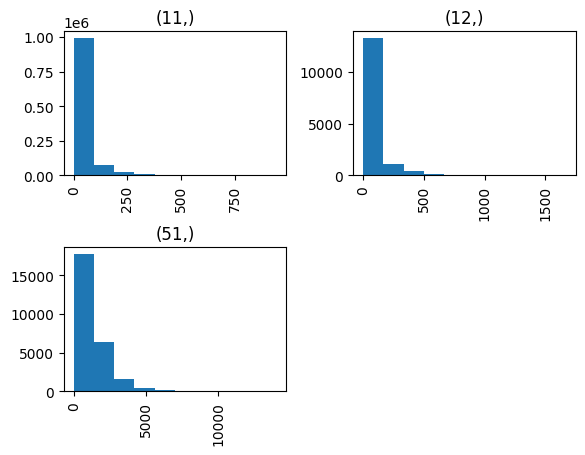

In [47]:
mask = (df_train['client_type'] == 11) & (df_train['monthly_usage_n_aux'] > 0) & (df_train['monthly_usage_n_aux'] < 942.5)
mask_2 = (df_train['client_type'] == 12) & (df_train['monthly_usage_n_aux'] > 0) & (df_train['monthly_usage_n_aux'] < 1865)
mask_3 = (df_train['client_type'] == 51) & (df_train['monthly_usage_n_aux'] > 0) & (df_train['monthly_usage_n_aux'] < 15232.2)
mask_4 = (df_train['mtr_type'] == 'GAZ')
df_train[(mask|mask_2|mask_3)&mask_4].hist(column=['monthly_usage_n_aux'], by=['client_type'])

In [65]:
df_train['invoice_date_diff'] = (df_train['invoice_date'] - df_train['invoice_date_prv']).dt.days
df_train['mtr_val_new_diff'] = df_train['mtr_val_new'] - df_train['mtr_val_new_prv']
df_train['daily_usage'] = df_train['mtr_val_new_diff'].div(df_train['invoice_date_diff'])

In [66]:
df_train.groupby(['mtr_type'], observed=True)['daily_usage'].quantile([0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00]).reset_index().pivot_table(index='mtr_type', columns='level_1', values='daily_usage')

C:\Users\mhoss\AppData\Local\Temp\ipykernel_9024\868949513.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_train.groupby(['mtr_type'], observed=True)['daily_usage'].quantile([0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00]).reset_index().pivot_table(index='mtr_type', columns='level_1', values='daily_usage')


level_1,0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00
mtr_type,,,,,,,,,
ELEC,-3151.806452,0.0,0.0,2.071429,3.83871,6.491525,20.770770,86.500000,11078.666667
GAZ,0.000000,0.0,0.0,0.425000,0.82906,1.547826,6.896552,38.392857,754.701613


In [67]:
df_temp = df_train[df_train['daily_usage'] < 0]

In [ ]:
df_train.groupby(['mtr_type'], observed=True)['monthly_usage'].quantile([0.00,0.01,0.05,0.25,0.50,0.75,0.95,0.99,1.00]).reset_index().pivot_table(index='mtr_type', columns='level_1', values='monthly_usage')

KeyError: 'Column not found: monthly_usage'

Looking at one example below. It appears that the stated values are an order of magnitude higher than expected. This is shown using the green line, which is much more typical of the values seen in the blue line on during other periods. The challenge is determining how often this is happening, and if there are other things happening elsewhere.

<Axes: xlabel='invoice_date', ylabel='usage_monthly'>

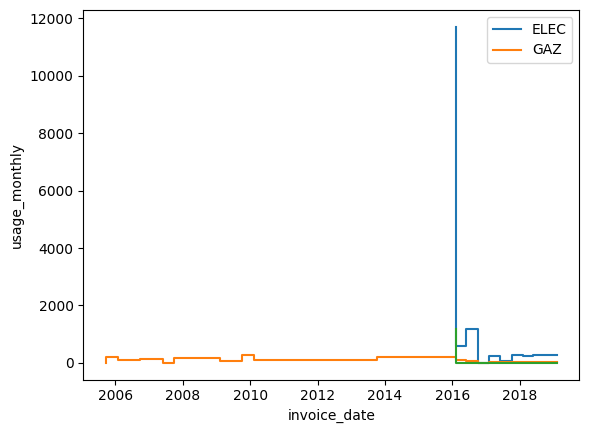

In [70]:
df_temp = df_train[df_train['client_id'] == 'train_Client_114205'][['invoice_date', 'mtr_type', 'usage_n', 'months_num']]
df_temp['usage_monthly'] = df_temp['usage_n'].div(df_temp['months_num'])
df_temp['usage_monthly_10'] = df_temp['usage_monthly']/10
df_temp.loc[df_temp['usage_monthly'] < 2000, 'usage_monthly_10'] = 0
sns.lineplot(data=df_temp, x='invoice_date', y='usage_monthly', hue='mtr_type', drawstyle='steps-pre')
sns.lineplot(data=df_temp[df_temp['mtr_type'] == 'ELEC'], x='invoice_date', y='usage_monthly_10', drawstyle='steps-pre')

Looking at some more examples:

In [72]:
df_temp = df_train[(df_train.groupby('client_id')['usage_n'].transform('max') > 50000) & (df_train['client_type'] != 51)]
df_temp['monthly_usage'] = df_temp['usage_n'].div(df_temp['months_num'])
df_temp

C:\Users\mhoss\AppData\Local\Temp\ipykernel_10508\3203868468.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['monthly_usage'] = df_temp['usage_n'].div(df_temp['months_num'])


,client_id,invoice_date,mtr_tariff,mtr_id,mtr_status,mtr_code,mtr_notes,mtr_coef,usage_1,usage_2,...,months_num_adj,months_num_calc,R_1,R_2a,R_2b,R_3a,R_3b,R_4a,R_4b,monthly_usage
5236,train_Client_100144,2005-10-25,11,543494,0,207,6,1.0,185,0,...,0,NaN,False,False,False,False,False,True,True,46.25
5235,train_Client_100144,2006-03-06,11,543494,0,207,6,1.0,361,0,...,0,4.0,False,False,False,False,False,False,False,90.25
5234,train_Client_100144,2006-07-04,11,543494,0,207,6,1.0,266,0,...,0,4.0,False,False,False,False,False,False,False,66.50
5233,train_Client_100144,2006-10-30,11,543494,0,207,6,1.0,52,0,...,0,4.0,False,False,False,False,False,False,False,13.00
5232,train_Client_100144,2007-03-02,11,543494,0,207,6,1.0,297,0,...,0,4.0,False,False,False,False,False,False,False,74.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4464262,train_Client_99663,2017-04-18,14,953,0,506,9,1.0,990,0,...,0,4.0,False,False,False,False,False,False,False,247.50
4464261,train_Client_99663,2017-08-17,14,953,0,506,9,1.0,17835,0,...,0,4.0,False,False,False,False,False,False,False,4458.75
4464244,train_Client_99663,2018-04-18,14,953,0,506,9,1.0,9184,0,...,0,8.0,False,False,False,False,False,False,False,1148.00
4464270,train_Client_99663,2018-08-15,14,953,0,506,9,1.0,17228,0,...,0,4.0,False,False,False,False,False,False,False,4307.00


train_Client_93669


<Axes: xlabel='invoice_date', ylabel='monthly_usage'>

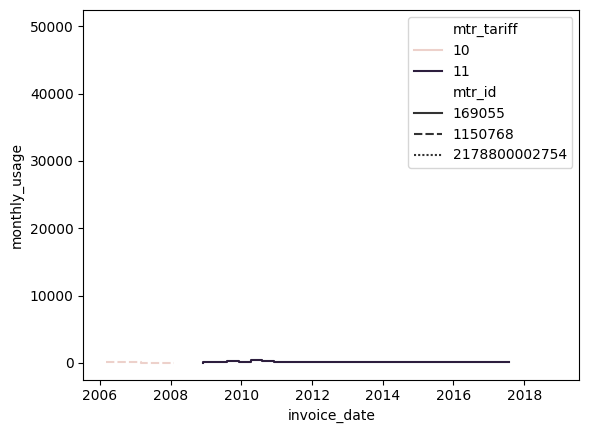

In [73]:
mask = df_temp.sample(n=1)['client_id'].values[0] # train_Client_70939
print(mask)
mask = ((df_temp['client_id'] == mask)) & ((df_temp['mtr_type'] == 'ELEC'))
sns.lineplot(data=df_temp[mask], x='invoice_date', y='monthly_usage', hue='mtr_tariff', style='mtr_id', drawstyle='steps-pre')

train_Client_92477


<Axes: xlabel='invoice_date', ylabel='monthly_usage'>

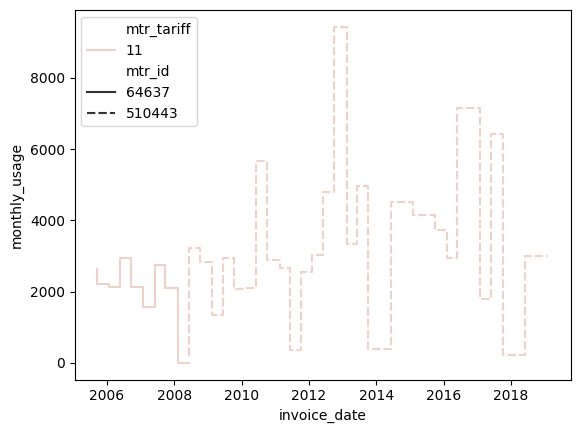

In [74]:
mask = df_temp.sample(n=1)['client_id'].values[0] # train_Client_108528
print(mask)
mask = ((df_temp['client_id'] == mask)) & ((df_temp['mtr_type'] == 'ELEC'))
sns.lineplot(data=df_temp[mask], x='invoice_date', y='monthly_usage', hue='mtr_tariff', style='mtr_id', drawstyle='steps-pre')

train_Client_47297


<Axes: xlabel='invoice_date', ylabel='monthly_usage'>

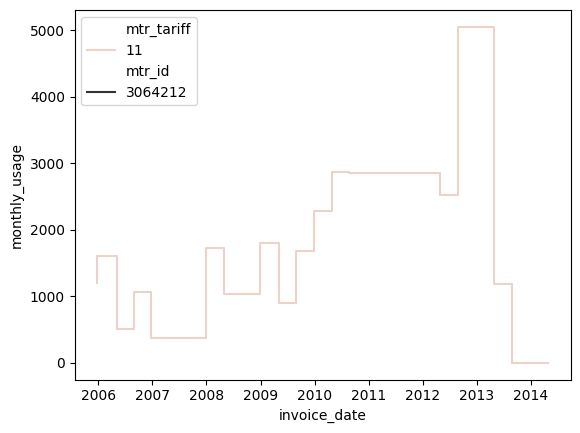

In [75]:
mask = df_temp.sample(n=1)['client_id'].values[0] # train_Client_116878
print(mask)
mask = ((df_temp['client_id'] == mask)) & ((df_temp['mtr_type'] == 'ELEC'))
sns.lineplot(data=df_temp[mask], x='invoice_date', y='monthly_usage', hue='mtr_tariff', style='mtr_id', drawstyle='steps-pre')

This is beyond what I can seek to address at the moment.

Dealing with some data types

In [39]:
df_train.dtypes

client_id                   object
invoice_date        datetime64[ns]
mtr_tariff                   int64
mtr_id                       int64
mtr_status                  object
mtr_code                     int64
mtr_notes                    int64
mtr_coef                   float64
usage_1                      int64
usage_2                      int64
usage_3                      int64
usage_4                      int64
mtr_val_old                float64
mtr_val_new                float64
months_num                   int64
mtr_type                  category
district                  category
client_type               category
region                    category
start_date          datetime64[ns]
fraud                      float64
adj_flag                      bool
usage_n                    float64
mtr_val_new_calc           float64
temp_flag                  float64
mtr_val_nxt                float64
err_flag                      bool
invoice_date_prv    datetime64[ns]
months_num_calc     

In [40]:
# Turning to string and then to category (for example, status has '0' and 0, this collapses them down)
df_train['client_id'] = df_train['client_id'].astype(str)
df_train['mtr_tariff'] = df_train['mtr_tariff'].astype(str)
df_train['mtr_id'] = df_train['mtr_id'].astype(str)
df_train['mtr_status'] = df_train['mtr_status'].astype(str)
df_train['mtr_code'] = df_train['mtr_code'].astype(str)
df_train['mtr_notes'] = df_train['mtr_notes'].astype(str)

df_train['fraud'] = df_train['fraud'].astype('boolean')
df_train['mtr_tariff'] = df_train['mtr_tariff'].astype('category')
df_train['mtr_status'] = df_train['mtr_status'].astype('category')
df_train['mtr_code'] = df_train['mtr_code'].astype('category')
df_train['mtr_notes'] = df_train['mtr_notes'].astype('category')

# Some of the derived columns will be deleted later

C:\Users\mhoss\AppData\Local\Temp\ipykernel_1880\2925324031.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['client_id'] = df_train['client_id'].astype(str)
C:\Users\mhoss\AppData\Local\Temp\ipykernel_1880\2925324031.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['mtr_tariff'] = df_train['mtr_tariff'].astype(str)
C:\Users\mhoss\AppData\Local\Temp\ipykernel_1880\2925324031.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

Clearly, there remains issues with the data, but this is as far as I have time for this aspect.

## Data Exploration

Going to split the features into three categories: 
* Usage-related: ['mtr_coef', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'usage_n', 'mtr_val_old', 'mtr_val_new']
* Non-usage: ['mtr_id', 'mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'mtr_type', 'district', 'region', 'client_type']
* Other: ['client_id', 'start_date', 'invoice_date', 'months_num']

This is to help with data transformation and exploration. They will later be considered together.

Looking at times in relation to the Fraud feature

In [41]:
df_train.loc[:, 'invoice_quarter'] = df_train.loc[:, 'invoice_date'].dt.to_period('Q')

C:\Users\mhoss\AppData\Local\Temp\ipykernel_1880\821319784.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.loc[:, 'invoice_quarter'] = df_train.loc[:, 'invoice_date'].dt.to_period('Q')


In [42]:
df_train.groupby(['mtr_type', 'fraud'], observed=False)['start_date'].agg(['min', 'max'])

min        max
mtr_type fraud                      
ELEC     False 1977-02-05 2019-09-10
         True  1977-02-05 2019-05-30
GAZ      False 1977-02-05 2019-08-06
         True  1977-02-17 2019-03-26

In [43]:
df_train.groupby(['mtr_type', 'fraud'], observed=False)['invoice_quarter'].agg(['min', 'max'])

min     max
mtr_type fraud                
ELEC     False  1977Q2  2019Q3
         True   2005Q2  2019Q3
GAZ      False  1981Q1  2019Q3
         True   2005Q2  2019Q3

In [44]:
df_test.groupby(['counter_type'], observed=False)['invoice_date'].agg(['min', 'max'])

,min,max
counter_type,,
ELEC,1977-07-13,2019-12-07
GAZ,1979-04-18,2019-12-07


Although the start_dates seem okay, there is a big difference between the earliest invoice_quarter between Fraud and not Fraud. This is considered an issue as it does not seem likely to be a truly significant reason to discriminate; more likely an artefact of the dataset. However, looking at the test set's date range shows a similar range to the whole dataset.

In this case, there are already many more not Fraud samples than Fraud, and this date feature cannot be used because of this difference in range. Therefore, the data will be truncated.

Although this might sound bad, consider that any data training prior to 2005 will always be Not Fraud from the training set, it cannot help with the Test Set, unless that is similarly poorly sampled. In that case, it is a larger issue with the dataset that needs addressing, and outside my scope of consideration. 

In [49]:
df_raw = df_train.copy()

In [50]:
print(f'Number of rows before truncation: {len(df_train)}.')
df_removed = pd.concat([df_removed, df_train[df_train['invoice_quarter'] < '2005Q2']], sort=False)
df_train = df_train[df_train['invoice_quarter'] >= '2005Q2']
print(f'Number of rows after truncation: {len(df_train)}.')

Number of rows before truncation: 4476703.
Number of rows after truncation: 4453964.


In [56]:
# Looking at the difference between the start_date and the most recent invoice date
df_temp = df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True).agg({'start_date' : 'first', 'invoice_date' : 'max'}).reset_index()
df_temp['date_diff'] = df_temp['invoice_date'] - df_temp['start_date']
df_temp['date_diff_num'] = df_temp['date_diff'].astype('timedelta64[s]').astype(int)/(86400*365.25)


Comparing distributions of the difference between the start_date and the most recent invoice date.

In [54]:
def Plot_cdfplot(df, col_x, col_y, x_name):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)  # Separate y-axes for CDF and histogram

    for idx, (type_value, ax) in enumerate(zip(['ELEC', 'GAZ'], axes)):
        # Create secondary y-axis for histogram
        ax_hist = ax.twinx()

        # Plot CDF
        sns.ecdfplot(
            data=df[df['mtr_type'] == type_value], 
            x=col_x, 
            hue=col_y,
            ax=ax,
            legend=False
        )
        ax.set_ylabel('CDF')
        ax.set_xlabel(x_name)
        ax.set_title(f'Energy Type: {"Electricity" if idx == 0 else "Gas"}')
        ax.grid(True)

        # Plot histogram on secondary axis
        sns.histplot(
            data=df[df['mtr_type'] == type_value], 
            x=col_x, 
            hue=col_y,
            stat='probability',
            alpha=0.4,  # Transparency for better visibility
            ax=ax_hist,
        )
        ax_hist.set_ylabel('Proportion')
        #ax_hist.set_ylim(0, 1)  # Adjust for better scaling

    # Add a supertitle and adjust layout
    plt.suptitle(f'CDF and Histogram of {x_name} by {col_name} and Energy Type', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for the global legend
    plt.show()

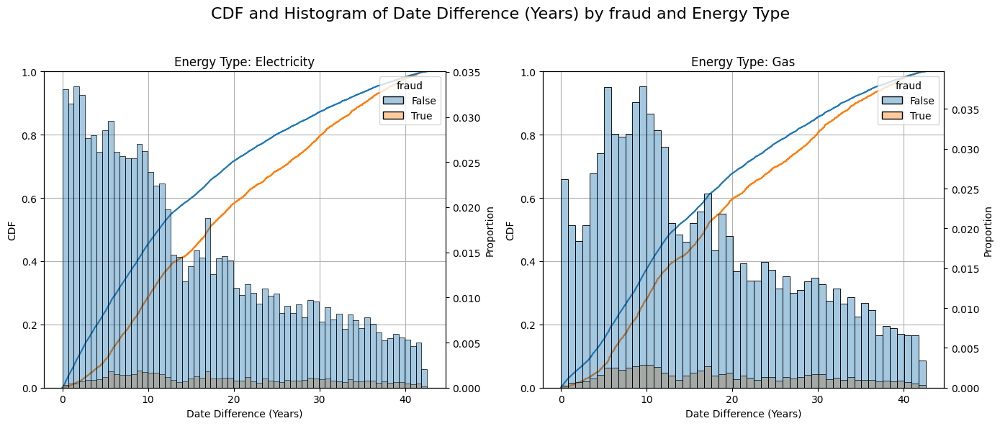

In [57]:
Plot_cdfplot(df_temp, 'date_diff_num', 'fraud', 'Date Difference (Years)')

It seems that those with the smallest gap between account creation and latest invoice date are less likely to be flagged. Those with the largest gap are more likely to be flagged. This is interpretted via the delta between the two CDF lines widening, and narrowing, respectively. This was checked prior truncated rows and would still hold true (not shown).

It is perhaps the meter reading is off by a factor of 10. The green line shows it divided by 10, and it seems more inline with the other readings, if normalised by 'months_sum'. This is quite a big issue to try and tackle is it would have to be differentiated from genuine high-usage.

In [85]:
temp = df_train[['client_id', 'invoice_date', 'mtr_tariff', 'mtr_status', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'usage_n', 'mtr_val_old', 'mtr_val_new', 'mtr_val_new_calc', 'mtr_val_nxt', 'start_date', 'mtr_type', 'district', 'region', 'client_type', 'fraud']].nlargest(100, ['usage_n'])

In [60]:
# Aggregating usage_n per client_id, using mean, median, and sum
df_temp = (df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)
           .agg(mean_usage=('usage_n', 'mean'),
                median_usage=('usage_n', 'median'),
                sum_usage=('usage_n', 'sum')).reset_index())

,fraud,mtr_type,client_id,mean_usage,median_usage,sum_usage
0,False,ELEC,train_Client_0,362.971429,267.0,12704.0
1,False,ELEC,train_Client_1,557.540541,520.0,20629.0
2,False,ELEC,train_Client_10,836.500000,655.5,15057.0
3,False,ELEC,train_Client_100,1.200000,0.0,24.0
4,False,ELEC,train_Client_1000,922.642857,770.0,12917.0
...,...,...,...,...,...,...
188673,True,GAZ,train_Client_99908,238.050000,205.5,4761.0
188674,True,GAZ,train_Client_99917,481.000000,347.5,11544.0
188675,True,GAZ,train_Client_99921,48.333333,35.0,145.0
188676,True,GAZ,train_Client_99947,206.606061,88.0,6818.0


In [138]:
df_train.groupby(['mtr_type', 'client_type'],observed=False)['usage_n'].quantile([0.00, 0.05,0.25,0.50,0.75,0.95,1.00]).reset_index()

,mtr_type,client_type,level_2,usage_n
0,ELEC,11,0.00,0.0
1,ELEC,11,0.05,0.0
2,ELEC,11,0.25,221.0
3,ELEC,11,0.50,454.0
4,ELEC,11,0.75,791.0
5,ELEC,11,0.95,2072.0
6,ELEC,11,1.00,821086.0
7,ELEC,12,0.00,0.0
8,ELEC,12,0.05,0.0
9,ELEC,12,0.25,37.0


<Axes: ylabel='Frequency'>

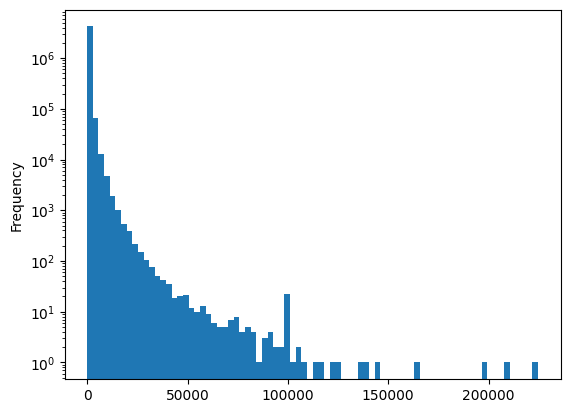

In [118]:
df_train[(df_train['client_type'] == 11) & (df_train['usage_n'] < 250000)]['usage_n'].plot(kind="hist", logy=True, bins=80)

<Axes: ylabel='Frequency'>

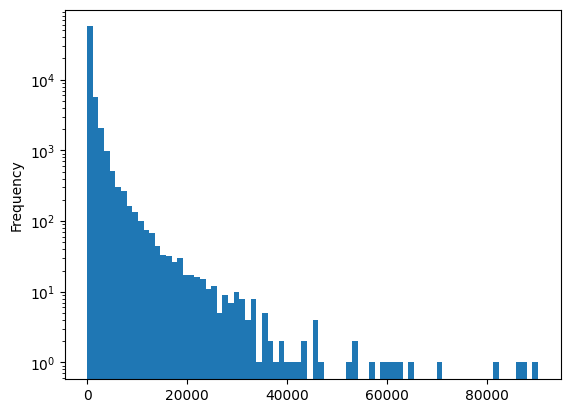

In [119]:
df_train[(df_train['client_type'] == 12) & (df_train['usage_n'] < 250000)]['usage_n'].plot(kind="hist", logy=True, bins=80)

<Axes: ylabel='Frequency'>

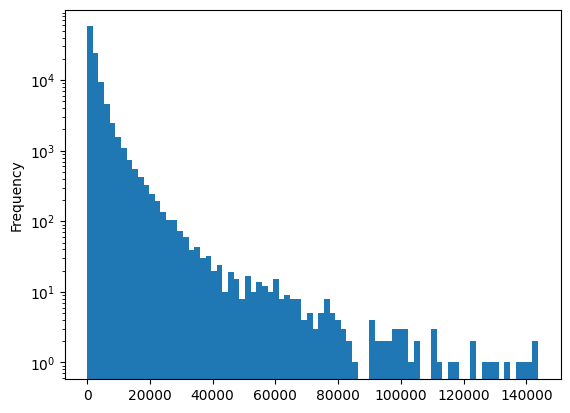

In [120]:
df_train[(df_train['client_type'] == 51) & (df_train['usage_n'] < 250000)]['usage_n'].plot(kind="hist", logy=True, bins=80)

Can aggregate this in several different ways: mean, median, sum of client_id, then mean or median of population.

In [97]:
# Looking at mean of usage for a client_id, then the mean, median, and std for population
df_train.groupby(['fraud', 'mtr_type', 'client_type', 'client_id'], observed=True)['usage_n'].mean().groupby(['mtr_type', 'fraud', 'client_type'], observed=False).agg(['mean', 'median', 'std'])

mean       median          std
mtr_type fraud client_type                                       
ELEC     False 11            710.162934   502.000000  1167.625466
               12           1027.170750   465.187500  2032.857257
               51           4086.319856  2472.833896  6260.851094
         True  11            864.522011   582.109557  1193.240943
               12            958.355361   605.106818   975.847786
               51           3035.335094  2568.787500  2334.732649
GAZ      False 11            174.563474   105.829268   292.571922
               12            259.935142   111.523810   467.311917
               51           1131.766173   589.739572  1408.385080
         True  11            203.642852   123.916667   304.970985
               12            226.430638   117.930556   266.584548
               51            924.877573   584.614907  1048.524011

In [78]:
# Looking at mean of usage for a client_id, then the mean, median, and std for population
df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].mean().groupby(['mtr_type', 'fraud'], observed=False).agg(['mean', 'median', 'std'])

mean      median          std
mtr_type fraud                                     
ELEC     False  754.004430  505.384615  1403.960112
         True   946.638672  600.638182  1317.817984
GAZ      False  183.311553  106.462912   331.029054
         True   229.493481  126.900000   382.249119

In [76]:
# Looking at median of usage for a client_id, then the mean, median, and std for population
df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).agg(['mean', 'median', 'std'])

mean  median          std
mtr_type fraud                                 
ELEC     False  627.363132   431.0  1237.364349
         True   732.416071   481.5  1149.466531
GAZ      False  137.913855    83.0   275.016308
         True   169.073308    98.0   317.247372

In [77]:
# Looking at sum of usage for a client_id, then the mean, median, and std for population
df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].sum().groupby(['mtr_type', 'fraud'], observed=False).agg(['mean', 'median', 'std'])

mean   median           std
mtr_type fraud                                     
ELEC     False  17827.534904  11486.0  38760.624360
         True   28413.857937  17554.0  51433.252439
GAZ      False   4355.233925   2300.0  13472.095766
         True    6838.174500   3241.0  24172.265887

 In this case, looking at the sum makes a bit less sense since it'd be correlated with duration of the account. Nevertheless, these all show Fraud usage being higher than non-fraud.

Creating simple function for making boxplot, comparing usage levels by a column.

In [76]:
def Plot_barplot(df, col_name):
    df = (
        df.groupby([col_name, 'fraud'], observed=False)
        .agg({'client_id': 'nunique'})
        .reset_index()
        .pivot(index=col_name, columns='fraud', values='client_id')
        .fillna(0)
        .reset_index()
    )
    df.columns = [col_name, 0, 1]  # Ensure columns are named appropriately
    df['total'] = df[[0, 1]].sum(axis=1)
    df.sort_values(by='total', ascending=False, inplace=True)

    # Convert index to string (if necessary for display)
    df[col_name] = df[col_name].astype(str)

    # Create plot
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6), sharey=False)

    # Calculate percentages
    fraud_1_percent = 100 * df[1] / (df[0] + df[1])
    fraud_0_percent = 100 * df[0] / (df[0] + df[1])

    # Create stacked bar plot
    axes[0].bar(df[col_name], fraud_1_percent, label='Fraud = 1', color="red")
    axes[0].bar(df[col_name], fraud_0_percent, bottom=fraud_1_percent, label='Fraud = 0', color="lightgreen")
    axes[1].bar(df[col_name], df[1], label='Fraud = 1', color="red")
    axes[1].bar(df[col_name], df[0], bottom=df[1], label='Fraud = 0', color="lightgreen")

    # Annotate with raw counts
    for i, (_col_name, fraud_0, fraud_1) in enumerate(zip(df[col_name], df[0], df[1])):
        if int(fraud_1) > 0:
            axes[0].text(i, fraud_1_percent.iloc[i] / 2, f"{int(fraud_1)}", ha='center', va='center', color='black', fontsize=10)  # Fraud = 1
            axes[1].text(i, fraud_1/ 2, f"{int(fraud_1)}", ha='center', va='center', color='black', fontsize=10)  # Fraud = 1
        if int(fraud_0) > 0:
            axes[0].text(i, fraud_1_percent.iloc[i] + (fraud_0_percent.iloc[i] / 2), f"{int(fraud_0)}", ha='center', va='center', color='black', fontsize=10)  # Fraud = 0
            axes[1].text(i, fraud_1 + (fraud_0), f"{int(fraud_0)}", ha='center', va='center', color='black', fontsize=10)  # Fraud = 0

    # Finalize plot
    axes[0].set_title(f"{col_name} vs Fraud Distribution")
    axes[0].set_xlabel(col_name)
    axes[0].set_ylabel("Percentage")
    axes[0].legend(loc='upper right')
    axes[0].set_ylim(0, 100)  # Increase ylim to accommodate total annotations
    axes[0].tick_params(axis='x', rotation=45)
    axes[1].set_title(f"{col_name} vs by Fraud Counts")
    axes[1].set_xlabel(col_name)
    axes[1].set_ylabel("Count")
    axes[1].legend(loc='upper right')
    axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

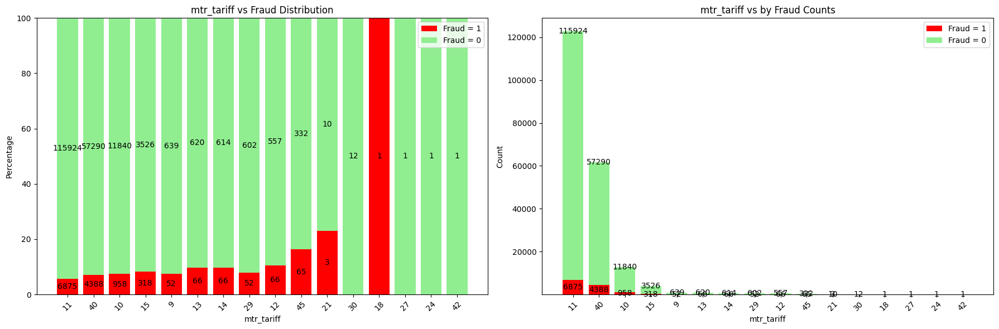

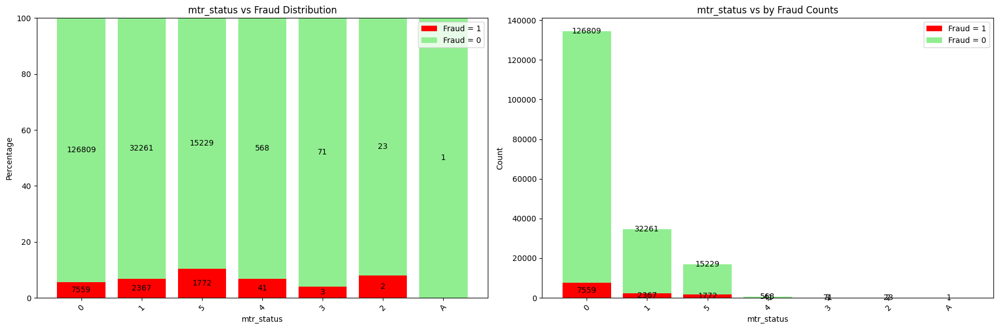

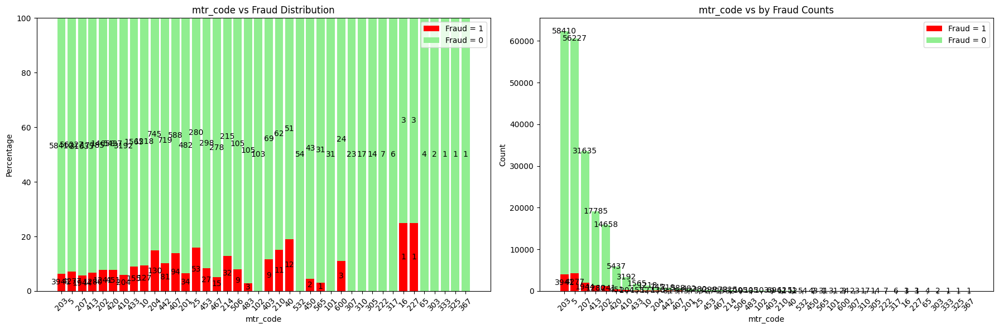

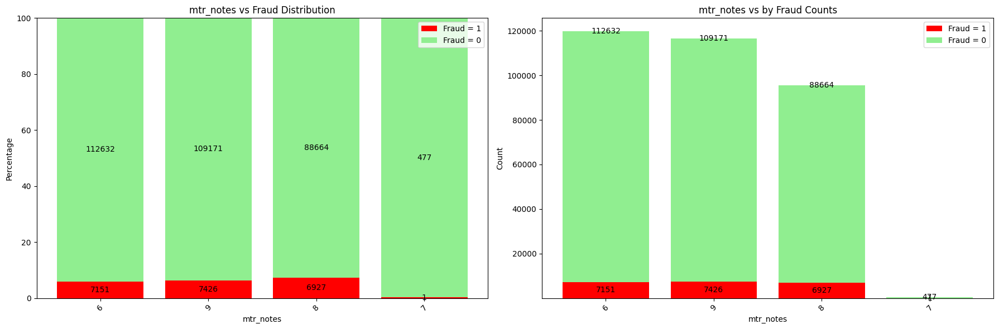

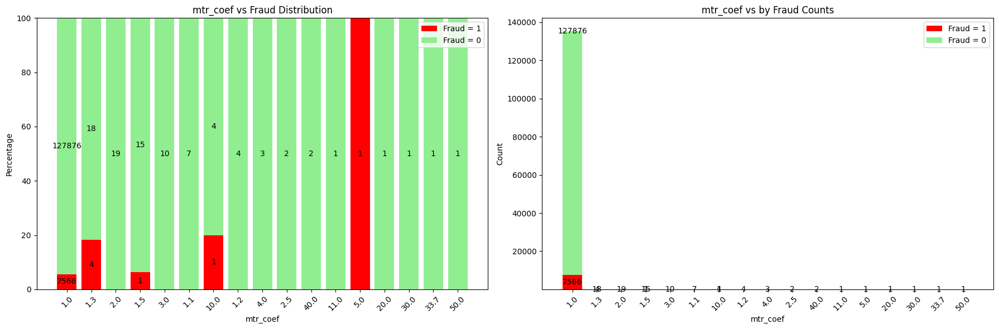

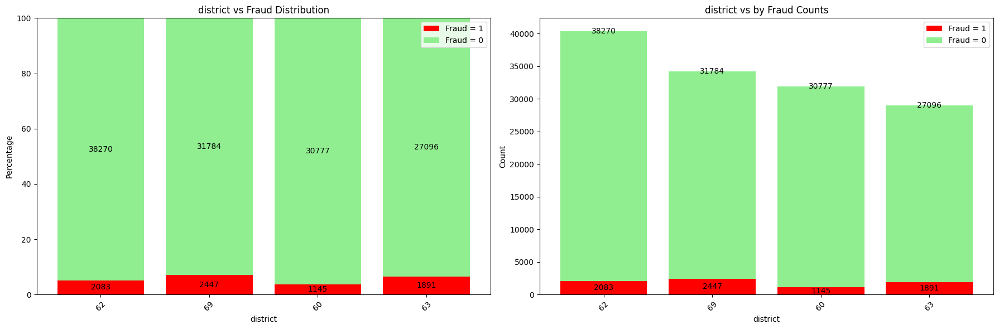

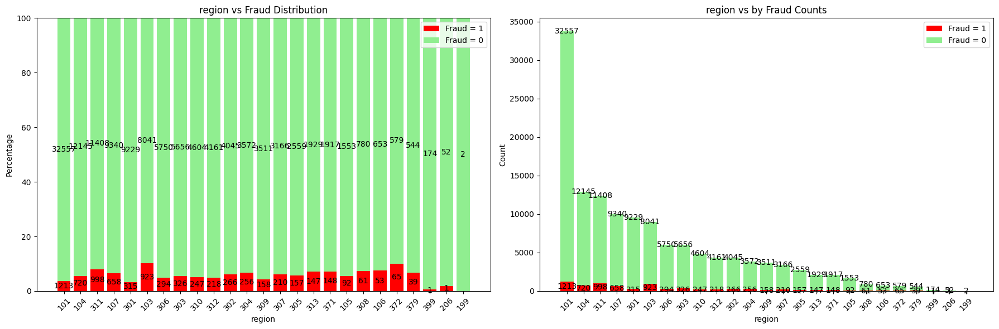

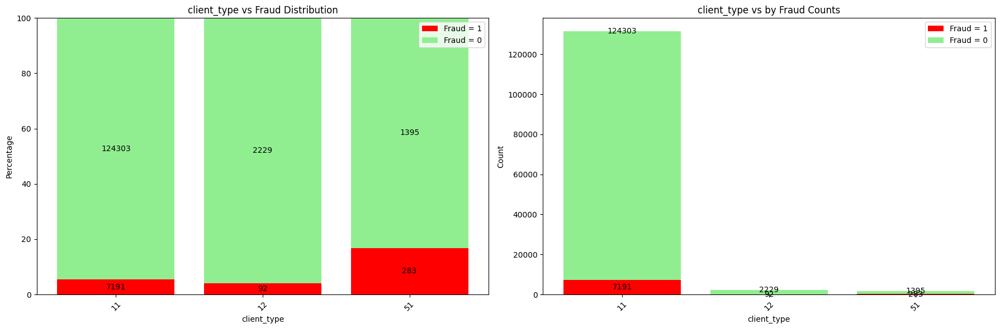

In [81]:
col_names = ['mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'mtr_coef', 'district', 'region', 'client_type']
for col_name in col_names:
    Plot_barplot(df_train, col_name)

* 'mtr_tariff': seems like not enough samples for values: [21, 30, 18, 27, 24, 42]
* 'mtr_status': seems like not enough samples for values: [3, 2, A], and possibly [4]
* 'mtr_code': seems quite difficult to determine
* 'mtr_notes': seems like not enough samples for values: [7], and possibly [6, 9] are mergable
* 'mtr_coef': seems like it should not be used
* 'district': seems like all should be used
* 'region': seems like not enough samples for values: [199, 206, 399], and possibly more, hard to determine.
* 'client_type': seems like all should be used

In [ ]:
col_names = ['mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'mtr_coef', 'district', 'region', 'client_type']
for col_name in col_names:
    Plot_barplot(df_train, col_name)

In [43]:
df_train['mtr_code'].value_counts()

mtr_code
203    1516851
5      1352033
207     555634
413     378929
202     343208
420      98273
410      69080
433      34447
10       27744
442      17050
25       14934
407      13768
204      12427
453       8290
201       7672
467       7302
506       3389
483       2830
214       2643
40        2482
532       1982
565       1082
403       1070
450       1059
600        807
210        789
102        313
227        178
65          74
101         74
16          73
310         51
307         50
305         44
222         42
317         16
303          5
333          4
367          3
325          1
Name: count, dtype: int64

In [65]:
df_train['mtr_notes'].value_counts()

mtr_notes
6    2230924
9    1416995
8     828123
7        661
Name: count, dtype: int64

In [66]:
def Plot_boxplot(df, col_names, by_col):
    fig, axes = plt.subplots(nrows=len(col_names), ncols=1, figsize=(10, len(col_names) * 4), sharex=True)
    for i, col in enumerate(col_names):
        (df_train[df_train[col] > 0][[col, by_col]]
        .assign(adjusted_usage=df_train[col] / df_train['mtr_coef'])
        .boxplot(
            column='adjusted_usage',
            by=by_col,
            grid=False,
            showmeans=True,
            vert=False,
            ax=axes[i]
        ))
        axes[i].set_title(f'Boxplot of {col} by {by_col}')
        axes[i].set_xlabel('Value')
        axes[i].set_ylabel(by_col)

    plt.xlim(0, 200000)
    plt.tight_layout()
    plt.suptitle("")
    plt.show()

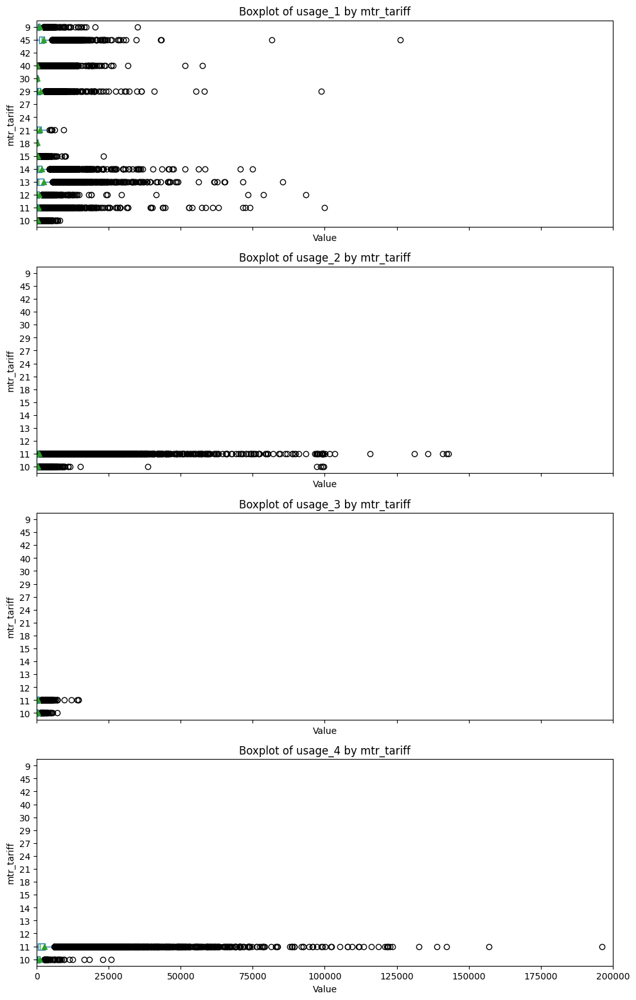

In [67]:
Plot_boxplot(df_train, ['usage_1', 'usage_2', 'usage_3', 'usage_4'], 'mtr_tariff')

(0.0, 50000.0)

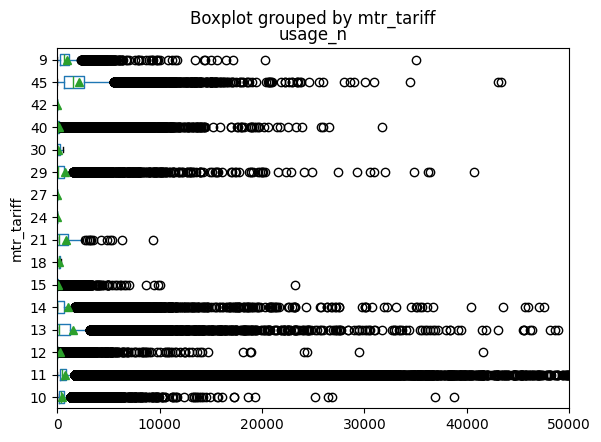

In [68]:
df_train.boxplot(column='usage_n', by='mtr_tariff', grid=False, showmeans=True, vert = False)
plt.xlim(0, 50000)

Only mtr_tariff == 10 | 11 uses usage_2 | usage_3 | usage_4.

<Axes: xlabel='mtr_tariff', ylabel='mtr_code'>

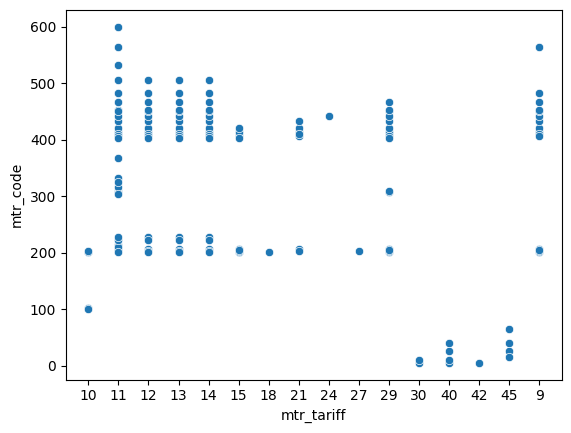

In [69]:
df_temp = df_train[['mtr_tariff', 'mtr_code']].value_counts().reset_index()
sns.scatterplot(x=df_temp['mtr_tariff'], y=df_temp['mtr_code'].astype(int))

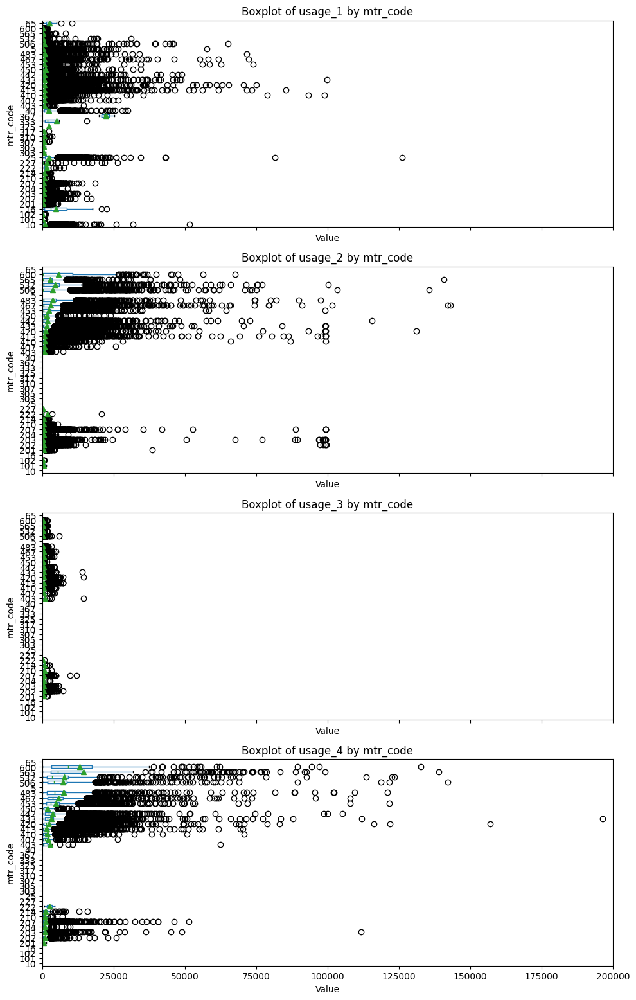

In [70]:
Plot_boxplot(df_train, ['usage_1', 'usage_2', 'usage_3', 'usage_4'], 'mtr_code')

(0.0, 50000.0)

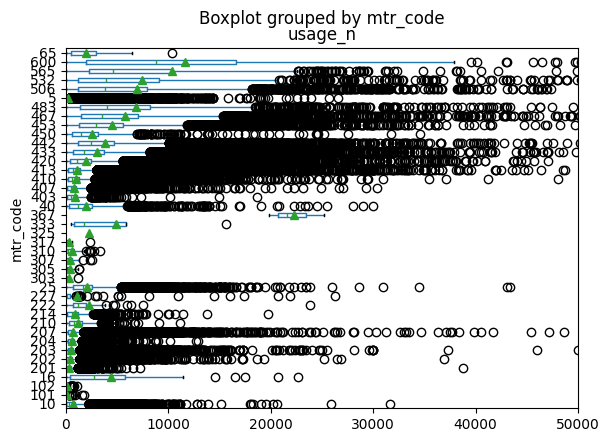

In [71]:
df_train.boxplot(column='usage_n', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.xlim(0, 50000)

Seems to be a slight link between increased usage values and mtr_code. Although mtr_tariff == 10 | 11 allow for usage_2+, it seems as though mtr_code == 3XX does not. Not clear why it matters though...

<Axes: xlabel='mtr_status', ylabel='mtr_tariff'>

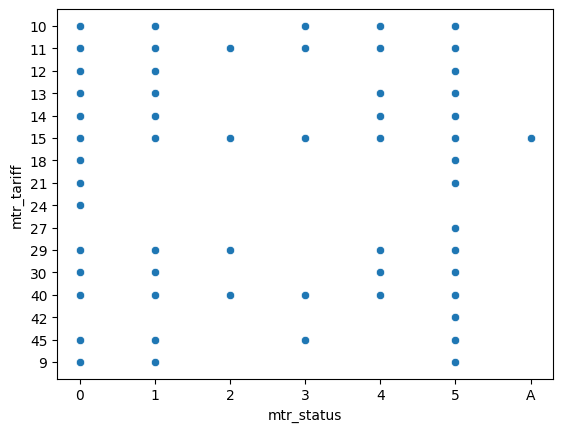

In [72]:
df_temp = df_train[['mtr_tariff', 'mtr_status']].value_counts().reset_index()
sns.scatterplot(x=df_temp['mtr_status'], y=df_temp['mtr_tariff'])

<Axes: xlabel='mtr_status', ylabel='mtr_code'>

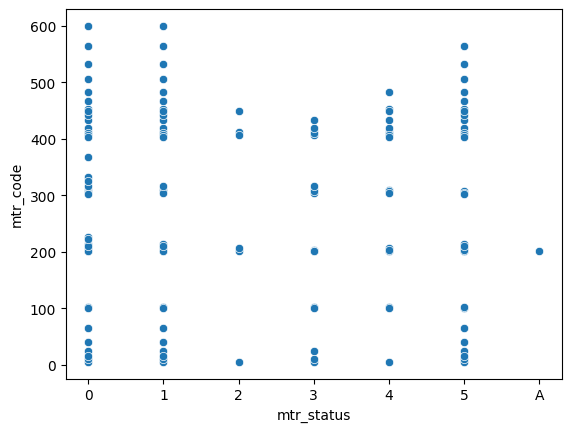

In [73]:
df_temp = df_train[['mtr_code', 'mtr_status']].value_counts().reset_index()
sns.scatterplot(x=df_temp['mtr_status'], y=df_temp['mtr_code'].astype(int))

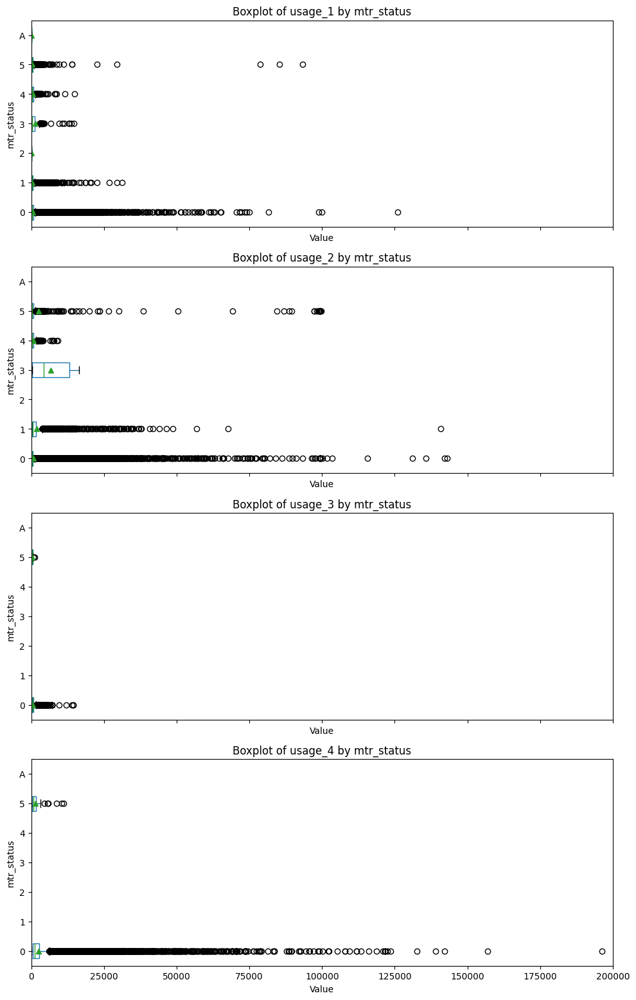

In [74]:
Plot_boxplot(df_train, ['usage_1', 'usage_2', 'usage_3', 'usage_4'], 'mtr_status')

(0.0, 50000.0)

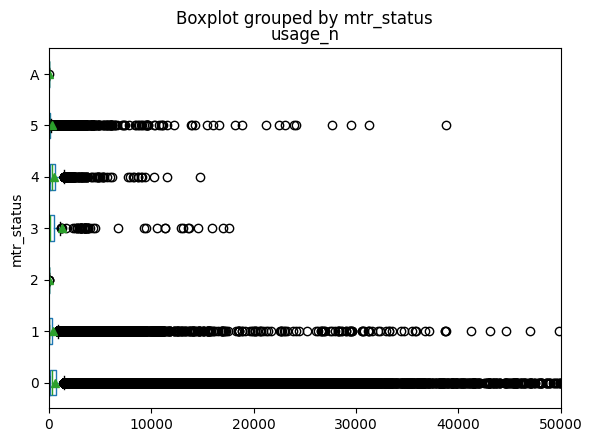

In [75]:
df_train.boxplot(column='usage_n', by='mtr_status', grid=False, showmeans=True, vert = False)
plt.xlim(0, 50000)

Seems like usage_3 | usage_4 only present with mtr_status = 0 | 5. Again, not clear why it matters though...

<Axes: xlabel='mtr_notes', ylabel='mtr_tariff'>

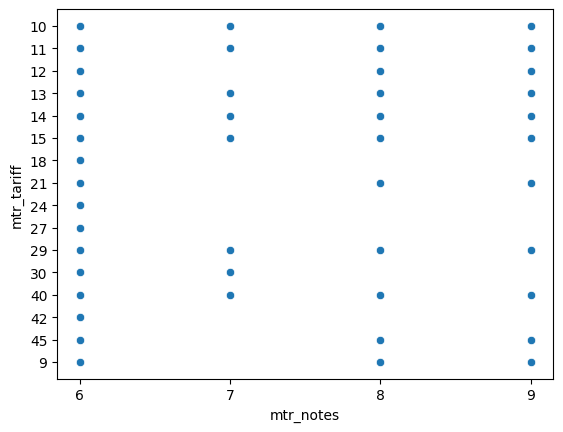

In [76]:
df_temp = df_train[['mtr_tariff', 'mtr_notes']].value_counts().reset_index()
sns.scatterplot(x=df_temp['mtr_notes'], y=df_temp['mtr_tariff'])

<Axes: xlabel='mtr_notes', ylabel='mtr_status'>

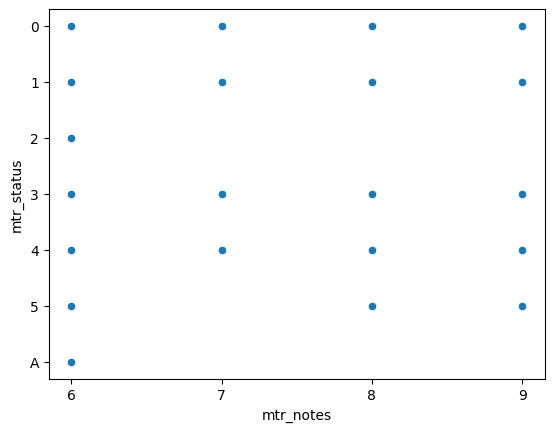

In [77]:
df_temp = df_train[['mtr_status', 'mtr_notes']].value_counts().reset_index()
sns.scatterplot(x=df_temp['mtr_notes'], y=df_temp['mtr_status'])

<Axes: xlabel='mtr_notes', ylabel='mtr_code'>

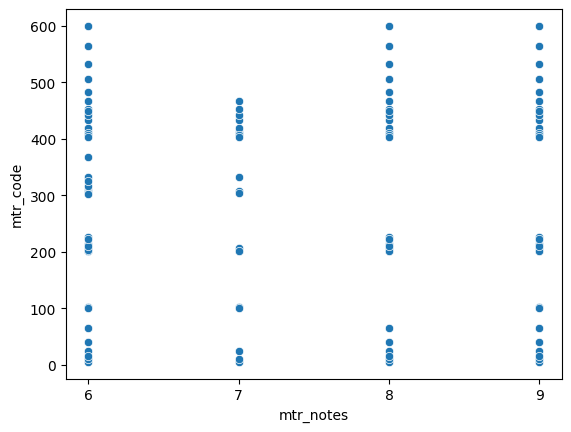

In [78]:
df_temp = df_train[['mtr_code', 'mtr_notes']].value_counts().reset_index()
sns.scatterplot(x=df_temp['mtr_notes'], y=df_temp['mtr_code'].astype(int))

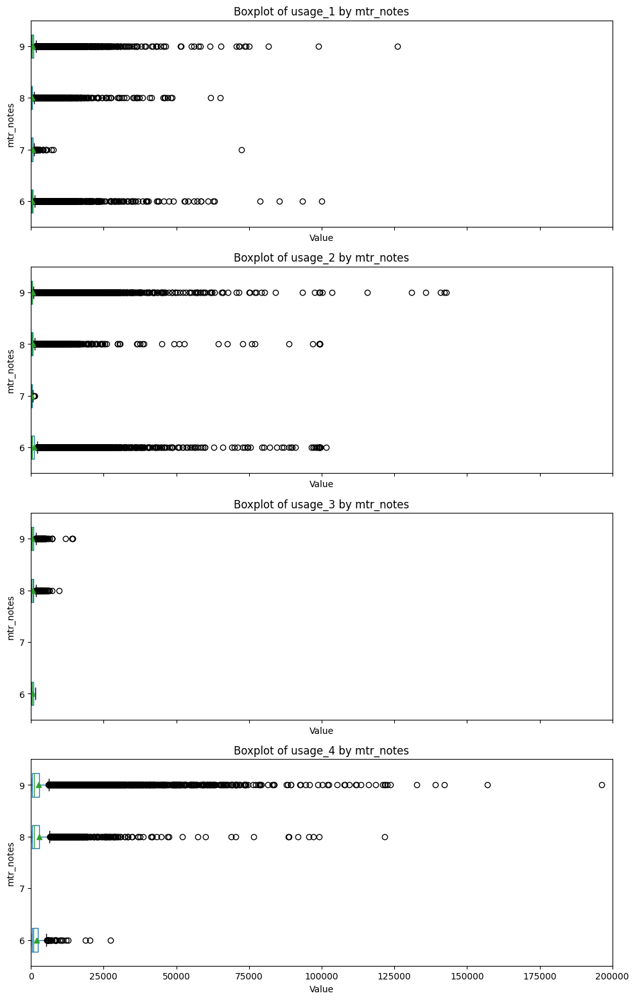

In [79]:
Plot_boxplot(df_train, ['usage_1', 'usage_2', 'usage_3', 'usage_4'], 'mtr_notes')

(0.0, 50000.0)

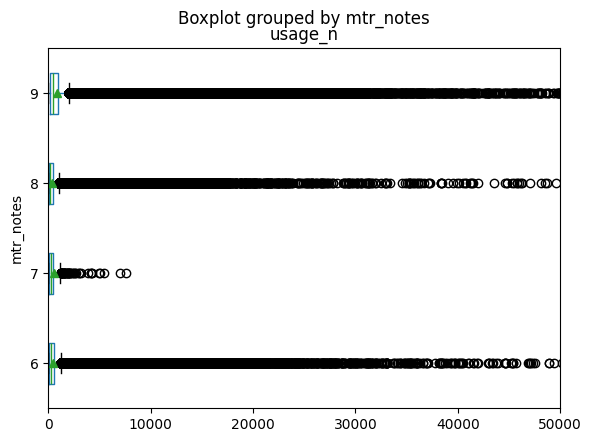

In [80]:
df_train.boxplot(column='usage_n', by='mtr_notes', grid=False, showmeans=True, vert = False)
plt.xlim(0, 50000)

Seems as though mtr_code == 3XX does not have mtr_notes 8 | 9. Not clear why it matters though...

Looking at the client-level features

<Axes: xlabel='region', ylabel='district'>

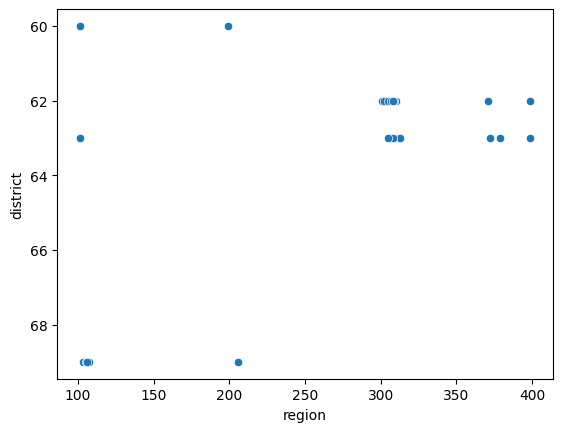

In [125]:
df_temp = df_train[['region', 'district']].value_counts().reset_index()
sns.scatterplot(x=df_temp['region'], y=df_temp['district'])

In [126]:
df_train[['region', 'district']].value_counts()

region  district
101     60          982205
311     63          507803
104     69          398909
301     62          314274
107     69          302413
103     69          293651
303     62          196934
306     63          194274
310     62          164877
312     63          156171
304     62          145478
302     62          143111
309     62          128330
305     62           93659
307     62           85167
101     63           78917
313     63           76900
105     69           52828
371     62           52802
308     63           28416
106     69           24003
372     63           16950
379     63           13192
399     63            1457
206     69            1004
308     62             221
305     63              11
399     62               5
199     60               2
Name: count, dtype: int64

In [279]:
df_train.groupby(['district', 'region', 'fraud'], observed=True)['client_id'].nunique().sort_index()

district  region  fraud
60        101     False    28280
                  True      1145
          199     False        2
62        301     False     8558
                  True       315
          302     False     3752
                  True       266
          303     False     5322
                  True       326
          304     False     3285
                  True       256
          305     False     2376
                  True       157
          307     False     3038
                  True       210
          308     False       11
          309     False     3326
                  True       158
          310     False     4449
                  True       247
          371     False     1852
                  True       148
          399     False        1
63        101     False     1646
                  True        68
          305     False        1
          306     False     5400
                  True       294
          308     False      749
                  T

In [131]:
df_train[['region', 'district', 'client_type']].value_counts()

region  district  client_type
101     60        11             938325
311     63        11             496383
104     69        11             377830
301     62        11             303313
107     69        11             293859
                                  ...  
371     62        51                 78
379     63        51                 15
305     63        11                 11
399     62        11                  5
199     60        11                  2
Name: count, Length: 75, dtype: int64

Making a function to view (proportionally and as absolute values) the distribution of fraud vs no fraud for given columns

The target variable is based on a client, and not an individual row. Must be careful looking at these kind of plots: there is variability to be expected, and some columns will have very few counts.

In [83]:
df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).median().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,424.5
1,ELEC,True,481.5
2,GAZ,False,83.0
3,GAZ,True,98.0


In [84]:
df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).mean().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,632.788291
1,ELEC,True,732.416071
2,GAZ,False,138.493864
3,GAZ,True,169.073308


In [86]:
df_temp = df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True).agg({'start_date' : 'first', 'invoice_date' : 'max'}).reset_index()
df_temp['date_diff'] = df_temp['invoice_date'] - df_temp['start_date']
df_temp.groupby(['mtr_type', 'fraud'], observed=False)['date_diff'].agg('median').reset_index()

,mtr_type,fraud,date_diff
0,ELEC,False,4000 days 00:00:00
1,ELEC,True,6232 days 12:00:00
2,GAZ,False,4770 days 00:00:00
3,GAZ,True,6146 days 00:00:00


In [88]:
df_train.groupby(['mtr_type', 'fraud'], observed=False)['start_date'].agg(['min', 'max'])

min        max
mtr_type fraud                      
ELEC     False 1977-02-05 2019-09-10
         True  1977-02-05 2019-05-30
GAZ      False 1977-02-05 2019-08-06
         True  1977-02-17 2019-03-26

In [89]:
df_temp['client_id'] = df_temp['client_id'].str.replace('train_Client_', '').astype(int)
df_temp.groupby(['mtr_type', 'fraud'], observed=False)['client_id'].agg(['min', 'max'])

min     max
mtr_type fraud             
ELEC     False    0  135492
         True     8  135448
GAZ      False    2  135492
         True    13  135448

Ideally, you want the fraud and non-fraud to look similar on these features. Although the 'start_date' and 'client_id' columns comply, the 'invoice_quarter' has no instances of fraud prior to 2005.
Although it is bad practice, I here looked at the test data to see the date range given, and it includes 'invoice_date' prior to 2005 (although I did not look at the target variables). 
This is another rather big issue:
* This is very unlikely to be true; fraud was more likely undetected
* This would likely cause ML algorithm to use this date as a cutoff for labelling; hard to blame it...

In this case, it was decided to remove rows where 'invoice_quarter' is before 2005.


In [90]:
print(f'Number of rows before truncation: {len(df_train)}.')
df_removed = pd.concat([df_removed, df_train[df_train['invoice_quarter'] < '2005Q2']], sort=False)
df_train = df_train[df_train['invoice_quarter'] >= '2005Q2']
print(f'Number of rows after truncation: {len(df_train)}.')

Number of rows before truncation: 4476703.
Number of rows after truncation: 4453964.


Histogram looking at number of rows for a given client_id, split by Fraud.

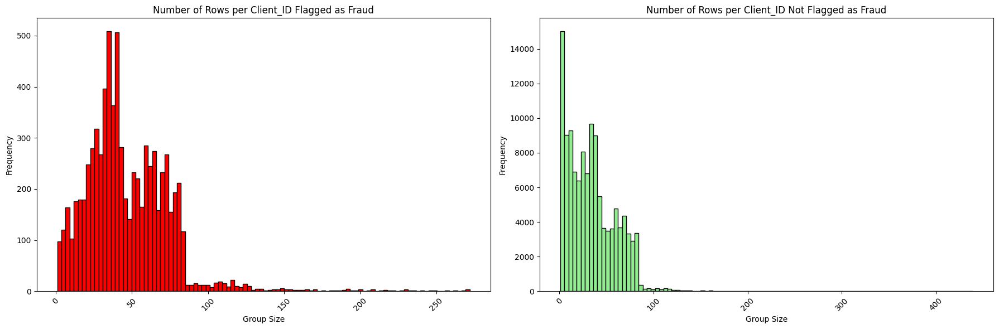

In [91]:
col_names = ['client_id']
mask = df_train[df_train['fraud'] == 1][col_names].value_counts().reset_index(name='group_size')

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6), sharey=False)

axes[0].hist(mask['group_size'], bins=100, color='red', edgecolor='black')
mask = df_train[df_train['fraud'] == 0][col_names].value_counts().reset_index(name='group_size')
axes[1].hist(mask['group_size'], bins=100, color='lightgreen', edgecolor='black')

axes[0].set_title("Number of Rows per Client_ID Flagged as Fraud")
axes[0].set_xlabel("Group Size")
axes[0].set_ylabel("Frequency")
axes[0].tick_params(axis='x', rotation=45)
axes[1].set_title("Number of Rows per Client_ID Not Flagged as Fraud")
axes[1].set_xlabel("Group Size")
axes[1].set_ylabel("Frequency")
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

There are quite a few that have only 1 or two rows. In theory, this should make it easier to identify what drives the labelling. So going to look at these a bit.

In [92]:
col_names = ['client_id']
mask = df_train[col_names].value_counts().reset_index(name='group_size')
mask = mask[mask['group_size'] == 1]
df_temp = df_train[df_train['client_id'].isin(mask['client_id'])]
df_temp

,client_id,invoice_date,mtr_tariff,mtr_id,mtr_status,mtr_code,mtr_notes,mtr_coef,usage_1,usage_2,...,fraud,adj_flag,usage_n,mtr_val_new_calc,temp_flag,mtr_val_nxt,err_flag,invoice_date_prv,months_num_calc,invoice_quarter
854,train_Client_100018,2019-03-05,11,2178700025696,0,413,8,1.0,600,300,...,False,True,1225.0,6090.0,0.0,NaN,True,NaT,NaN,2019Q1
1356,train_Client_100030,2011-03-30,11,66409,1,413,6,1.0,600,410,...,False,False,1010.0,50245.0,0.0,NaN,True,NaT,NaN,2011Q1
1402,train_Client_100033,2019-08-14,11,2178701205700,0,413,9,1.0,1600,800,...,False,False,5820.0,5820.0,0.0,NaN,True,NaT,NaN,2019Q3
2423,train_Client_10007,2019-01-18,11,2185700044018,0,207,8,1.0,402,0,...,False,False,402.0,765.0,0.0,NaN,True,NaT,NaN,2019Q1
3484,train_Client_100097,2015-02-11,11,623046,0,420,9,1.0,116,0,...,False,True,116.0,116.0,0.0,NaN,True,NaT,NaN,2015Q1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4467118,train_Client_99747,2019-08-15,11,2155731749000,0,207,6,1.0,0,0,...,False,False,0.0,4296.0,0.0,NaN,False,NaT,NaN,2019Q3
4467119,train_Client_99748,2019-08-27,40,37753,0,5,9,1.0,5,0,...,False,False,5.0,296.0,0.0,NaN,True,NaT,NaN,2019Q3
4468758,train_Client_99792,2009-05-05,40,6895781,1,5,6,1.0,245,0,...,False,True,245.0,245.0,0.0,NaN,True,NaT,NaN,2009Q2
4472516,train_Client_99884,2019-01-31,11,27181146875900,0,203,9,1.0,689,0,...,False,False,689.0,689.0,0.0,NaN,True,NaT,NaN,2019Q1


For brevity, uninteresting plots are not shown below

In [258]:
col_names = ['mtr_status']  # ['mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'district', 'region', 'client_type']
for col_name in col_names:
    Plot_barplot(df_temp, col_name)

KeyError: 'mtr_tariff'

In [95]:
df_temp.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).mean().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,1006.117028
1,ELEC,True,2156.263158
2,GAZ,False,153.736041
3,GAZ,True,NaN


It would seem that the usage is much higher and is likely th key indicator. Going to consider a few more rows to increase overall sample size (hopefully, without diluting signal too much).

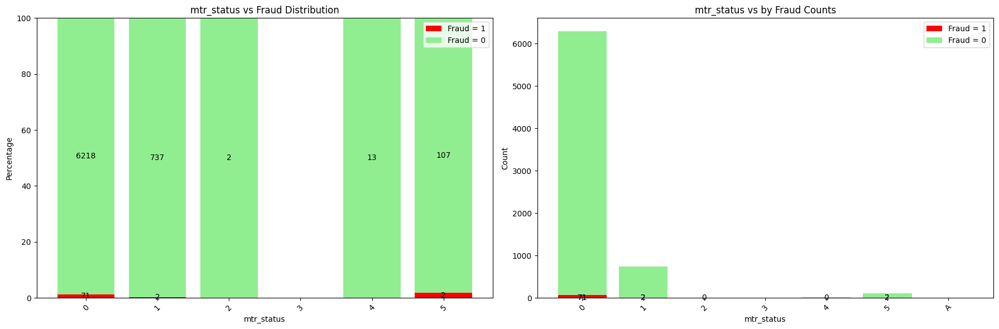

In [96]:
col_names = ['client_id']
mask = df_train[col_names].value_counts().reset_index(name='group_size')
mask = mask[mask['group_size'] < 3]
df_temp = df_train[df_train['client_id'].isin(mask['client_id'])]

col_names = ['mtr_status']  # ['mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'district', 'region', 'client_type']
for col_name in col_names:
    Plot_barplot(df_temp, col_name)

In [97]:
df_temp.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).median().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,200.0
1,ELEC,True,442.0
2,GAZ,False,0.0
3,GAZ,True,0.0


In [98]:
df_temp.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).mean().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,923.586141
1,ELEC,True,1833.659722
2,GAZ,False,189.728502
3,GAZ,True,426.500000


Only 'mtr_status' == 0, and the 'usage_n' seem significant. However, as shown below, 'mtr_status' quickly dissipates once number of rows is increased (here to < 10)

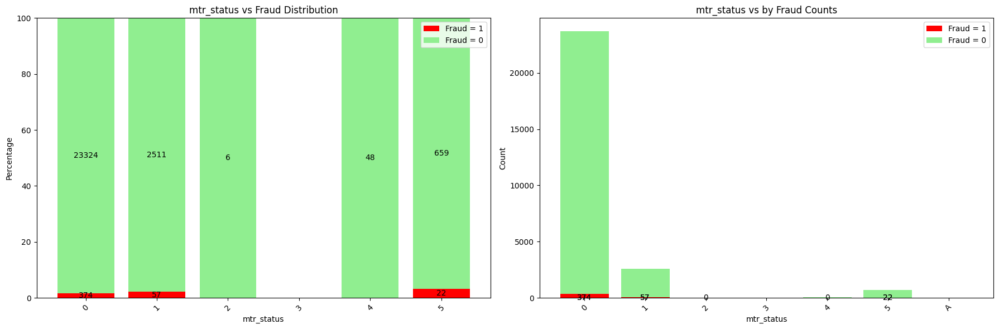

In [99]:
col_names = ['client_id']
mask = df_train[col_names].value_counts().reset_index(name='group_size')
mask = mask[mask['group_size'] < 10]
df_temp = df_train[df_train['client_id'].isin(mask['client_id'])]

col_names = ['mtr_status']  # ['mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'district', 'region', 'client_type']
for col_name in col_names:
    Plot_barplot(df_temp, col_name)

In [100]:
df_temp.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).median().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,283.75
1,ELEC,True,501.00
2,GAZ,False,21.00
3,GAZ,True,95.00


In [101]:
df_temp.groupby(['fraud', 'mtr_type', 'client_id'], observed=True)['usage_n'].median().groupby(['mtr_type', 'fraud'], observed=False).mean().reset_index()

,mtr_type,fraud,usage_n
0,ELEC,False,690.315468
1,ELEC,True,1336.456233
2,GAZ,False,183.491465
3,GAZ,True,323.139241


Quite tricky to view things in a meaningful way. Although a client_id is flagged, there may be multiple mtr_id present. It would not necessarily be clear which and when that activity triggering the flagging occurs. It could easily be that even for a flagged client_id, the majority of the data is indicative of non-fraudulent activity (either on different meters, or during different periods).

Temporarily, going to split the features into two groups:
Usage-related: ['mtr_coef', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'usage_n', 'months_num', 'mtr_val_old', 'mtr_val_new']
Non-usage: ['mtr_id', 'mtr_tariff', 'mtr_status', 'mtr_code', 'mtr_notes', 'mtr_type', 'district', 'region', 'client_type']
This divide isn't great as many can be related to usage indirectly. However, the purpose is just to investigate how best to aggregating the non-usage data into a single row for a client_id.
The following: ['client_type', 'region', 'district'] are per client_id and so do not need aggregating.
['mtr_id', 'mtr_type'] are linked n:1. Having a count of each 'mtr_type'  seems sensible. There will be some that don't span whole client_id duration, some that overlap etc. For now, let's ignore that.



Let's ignore code and tariff just for now. Looking  at ['district', 'region', 'client_type', 'mtr_type', 'mtr_status', 'mtr_notes']

In [235]:
df_temp = df_train[['client_id', 'invoice_date', 'mtr_id', 'mtr_status', 'mtr_notes', 'district', 'region', 'client_type', 'mtr_type', 'fraud']].copy()

Each client_id:
* 1 x (district+region)
* 1 x client_type
* count of mtr_type=='ELEC'
* count of mtr_type=='GAZ'
* count of client_id rows
* count of mtr_status=='A'
* count of mtr_status=='0'
* count of mtr_status=='1'
* count of mtr_status=='2'
* count of mtr_status=='3'
* count of mtr_status=='4'
* count of mtr_status=='5'
* count of mtr_notes=='6'
* count of mtr_notes=='7'
* count of mtr_notes=='8'
* count of mtr_notes=='9'

In [236]:
df_temp = df_temp.merge((df_temp.groupby('client_id')['invoice_date'].max() - pd.DateOffset(years=5)).rename('five_year_cutoff'), on='client_id')
df_temp = df_temp[df_temp['invoice_date'] >= df_temp['five_year_cutoff']].drop(columns='five_year_cutoff')

In [237]:
df_temp['district_region'] = df_temp['district'].astype(str) + df_temp['region'].astype(str)
df_temp['district_region'] = df_temp['district_region'].astype('category')
df_temp.drop(columns=['district', 'region'], inplace = True)

In [238]:
temp = pd.concat([df_temp.groupby(["client_id", "mtr_notes"]).size().reset_index(name="Count").pivot(index="client_id", columns="mtr_notes", values="Count").add_prefix('mtr_notes_'),
                  df_temp.groupby(["client_id", "mtr_status"]).size().reset_index(name="Count").pivot(index="client_id", columns="mtr_status", values="Count").add_prefix('mtr_status_'),
                  df_temp.groupby(['client_id', 'mtr_type'])['mtr_id'].nunique().reset_index().pivot(index="client_id", columns="mtr_type", values="mtr_id").add_prefix('mtr_type_'),
                  df_temp.groupby(["client_id", "district_region"])["mtr_id"].nunique().reset_index(name="Count").pivot(index="client_id", columns="district_region", values="Count").add_prefix('district_region_'),
                  df_temp.groupby(["client_id", "client_type"])["mtr_id"].nunique().reset_index(name="Count").pivot(index="client_id", columns="client_type", values="Count").add_prefix('client_type_'),
                  df_temp.groupby(['client_id'])['fraud'].first()], axis=1)


temp

C:\Users\mhoss\AppData\Local\Temp\ipykernel_28500\1671388685.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  temp = pd.concat([df_temp.groupby(["client_id", "mtr_notes"]).size().reset_index(name="Count").pivot(index="client_id", columns="mtr_notes", values="Count").add_prefix('mtr_notes_'),
C:\Users\mhoss\AppData\Local\Temp\ipykernel_28500\1671388685.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_temp.groupby(["client_id", "mtr_status"]).size().reset_index(name="Count").pivot(index="client_id", columns="mtr_status", values="Count").add_prefix('mtr_status_'),
C:\Users\mhoss\AppData\Local\Temp\ipyke

,mtr_notes_6,mtr_notes_7,mtr_notes_8,mtr_notes_9,mtr_status_0,mtr_status_1,mtr_status_2,mtr_status_3,mtr_status_4,mtr_status_5,...,district_region_69103,district_region_69104,district_region_69105,district_region_69106,district_region_69107,district_region_69206,client_type_11,client_type_12,client_type_51,fraud
client_id,,,,,,,,,,,,,,,,,,,,,
train_Client_0,0,0,5,5,10,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,False
train_Client_1,0,0,2,11,13,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,False
train_Client_10,0,0,3,3,6,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,False
train_Client_100,13,0,0,1,14,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,False
train_Client_1000,0,0,2,12,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
train_Client_99994,3,0,0,1,4,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,False
train_Client_99995,27,0,0,0,27,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,False
train_Client_99996,3,0,0,30,32,0,0,0,0,1,...,0,0,0,0,0,0,3,0,0,False


In [239]:
temp[['mtr_notes_6', 'mtr_notes_7', 'mtr_notes_8', 'mtr_notes_9']] = temp[['mtr_notes_6', 'mtr_notes_7', 'mtr_notes_8', 'mtr_notes_9']].div(temp[['mtr_notes_6', 'mtr_notes_7', 'mtr_notes_8', 'mtr_notes_9']].sum(axis=1), axis=0)
temp[['mtr_status_0', 'mtr_status_1', 'mtr_status_2', 'mtr_status_3', 'mtr_status_4', 'mtr_status_5', 'mtr_status_A']] = temp[['mtr_status_0', 'mtr_status_1', 'mtr_status_2', 'mtr_status_3', 'mtr_status_4', 'mtr_status_5', 'mtr_status_A']].div(temp[['mtr_status_0', 'mtr_status_1', 'mtr_status_2', 'mtr_status_3', 'mtr_status_4', 'mtr_status_5', 'mtr_status_A']].sum(axis=1), axis=0)

array([<Axes: title={'center': 'mtr_notes_8'}, xlabel='fraud'>,
       <Axes: title={'center': 'mtr_notes_9'}, xlabel='fraud'>],
      dtype=object)

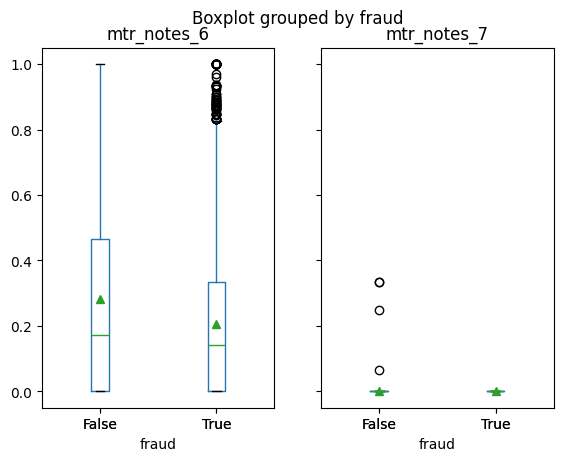

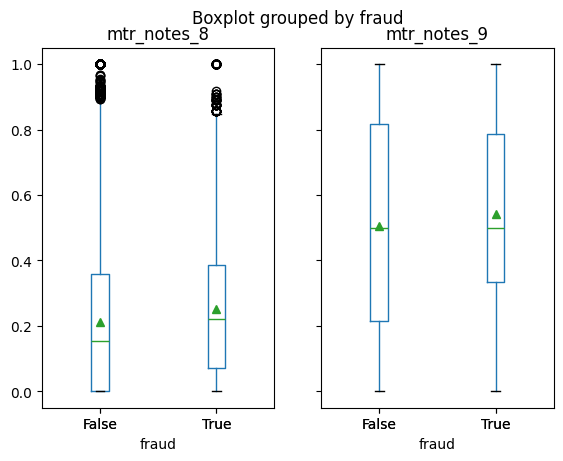

In [240]:
temp.boxplot(column=['mtr_notes_6', 'mtr_notes_7'], by='fraud', grid=False, showmeans=True)
temp.boxplot(column=['mtr_notes_8', 'mtr_notes_9'], by='fraud', grid=False, showmeans=True)

<Axes: title={'center': 'mtr_status_A'}, xlabel='fraud'>

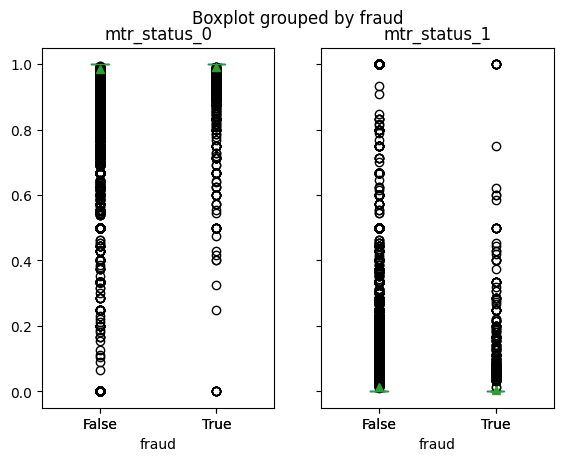

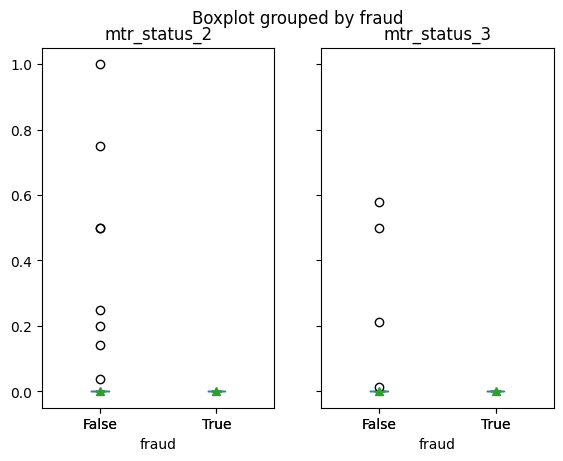

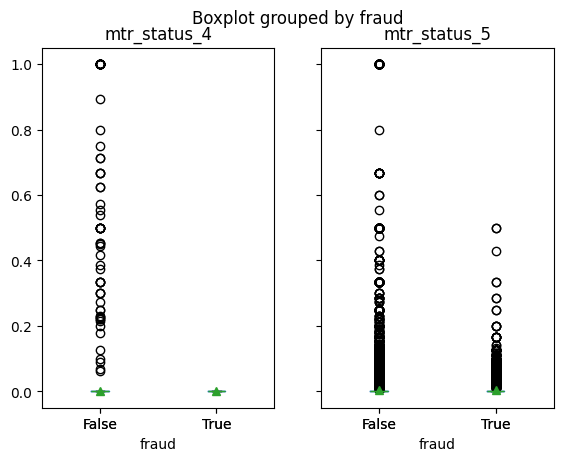

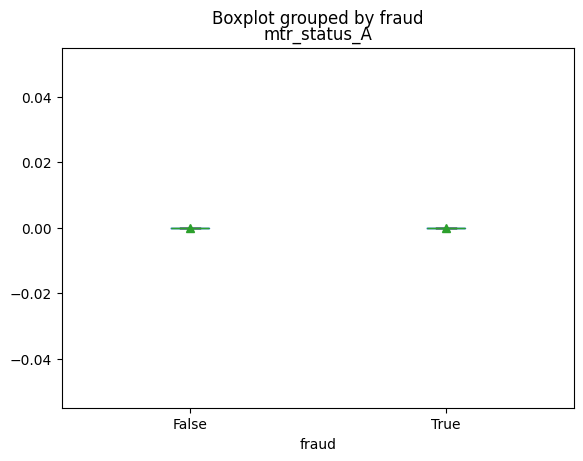

In [241]:
temp.boxplot(column=['mtr_status_0', 'mtr_status_1'], by='fraud', grid=False, showmeans=True)
temp.boxplot(column=['mtr_status_2', 'mtr_status_3'], by='fraud', grid=False, showmeans=True)
temp.boxplot(column=['mtr_status_4', 'mtr_status_5'], by='fraud', grid=False, showmeans=True)
temp.boxplot(column=['mtr_status_A'], by='fraud', grid=False, showmeans=True)

In [182]:
df_temp.groupby(["client_id", "district_region"])["mtr_id"].nunique().head(50)

C:\Users\mhoss\AppData\Local\Temp\ipykernel_28500\657090890.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_temp.groupby(["client_id", "district_region"])["mtr_id"].nunique().head(50)


client_id       district_region
train_Client_0  60101              1
                60199              0
                62301              0
                62302              0
                62303              0
                62304              0
                62305              0
                62307              0
                62308              0
                62309              0
                62310              0
                62371              0
                62399              0
                63101              0
                63305              0
                63306              0
                63308              0
                63311              0
                63312              0
                63313              0
                63372              0
                63379              0
                63399              0
                69103              0
                69104              0
                69105              0
      

In [ ]:
df_temp.groupby(["client_id", "mtr_notes", ]).size().reset_index(name="Count").pivot(index="client_id", columns="mtr_notes", values="Count").add_prefix('mtr_notes_')

In [ ]:
df_temp.pivot(
    index=['client_id'],  # Columns to keep as the index
    columns=['region', 'district'],       # Column to pivot
    values=['fraud_usage_mean_sum', 'fraud_usage_median_sum', 'nofrd_usage_mean_sum', 'nofrd_usage_median_sum']   # Values to spread across columns
)
df_temp

In [165]:
df_temp.groupby(['client_id', 'mtr_type'])['mtr_id'].nunique().reset_index().pivot(index="client_id", columns="mtr_type", values="mtr_id").add_prefix('mtr_type_')

#df_temp.groupby(['client_id', 'mtr_notes'], observed=False)['mtr_notes'].count()
#df_temp.groupby(['client_id', 'mtr_status'], observed=False)['mtr_status'].count()

#df_temp['mtr_elec'] = df_temp['mtr_type'] == 'ELEC' # The rest is therefore 'GAZ'
#df_temp.drop(columns=['mtr_type'], inplace = True)

C:\Users\mhoss\AppData\Local\Temp\ipykernel_28500\320806811.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_temp.groupby(['client_id', 'mtr_type'])['mtr_id'].nunique().reset_index().pivot(index="client_id", columns="mtr_type", values="mtr_id").add_prefix('mtr_type_')


mtr_type,mtr_type_ELEC,mtr_type_GAZ
client_id,,
train_Client_0,1,0
train_Client_1,1,0
train_Client_10,1,0
train_Client_100,1,0
train_Client_1000,1,0
...,...,...
train_Client_99994,1,0
train_Client_99995,1,2
train_Client_99996,1,2


Some time-series data will be explored, but it should be noted that what is being shown is the usage recorded for a given invoice-date. The period an invoice covers varies, and this can cause issues with the results seen. For example, if fraudulent users are more likely to be invoiced less frequently, they'll tend towards having greater spikes in this plot. One issue on this topic is that the "months_num" is quite unreliable. Otherwise, it could be used to better distribute the usage across the indicated period, prior being aggregated for analysis. Unfortunately, this is left here for "future work".

In [82]:
df_train['invoice_quarter'] = pd.PeriodIndex(df_train['invoice_quarter'], freq='Q').to_timestamp()

Looking to visualise usage data a bit more to see if anything can be learned.

Text(0.5, 1.0, '20th-80th Percentile Bounds. Median & Mean as faint & bold lines, respectively.')

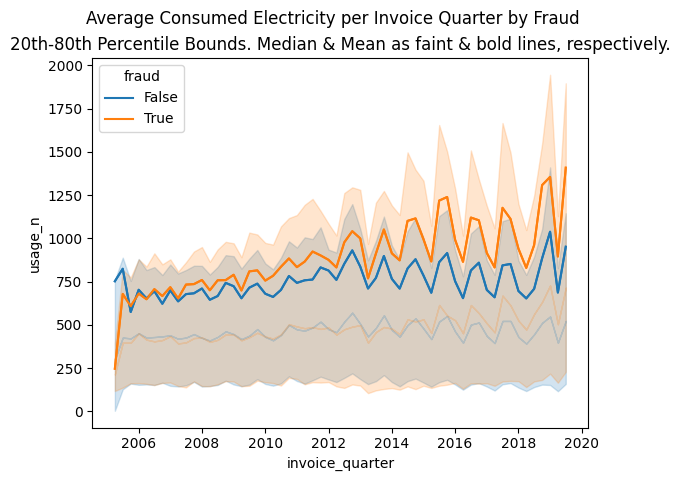

In [83]:
sns.lineplot(data=df_train[df_train['mtr_type'] == 'ELEC'], x='invoice_quarter', y='usage_n', hue='fraud', errorbar=("pi", 60))
sns.lineplot(data=df_train[df_train['mtr_type'] == 'ELEC'], x='invoice_quarter', y='usage_n', hue='fraud', errorbar=("pi", 0), legend=None)
plt.suptitle("Average Consumed Electricity per Invoice Quarter by Fraud")
plt.title("20th-80th Percentile Bounds. Median & Mean as faint & bold lines, respectively.")

Text(0.5, 1.0, '20th-80th Percentile Bounds. Median & Mean as faint & bold lines, respectively.')

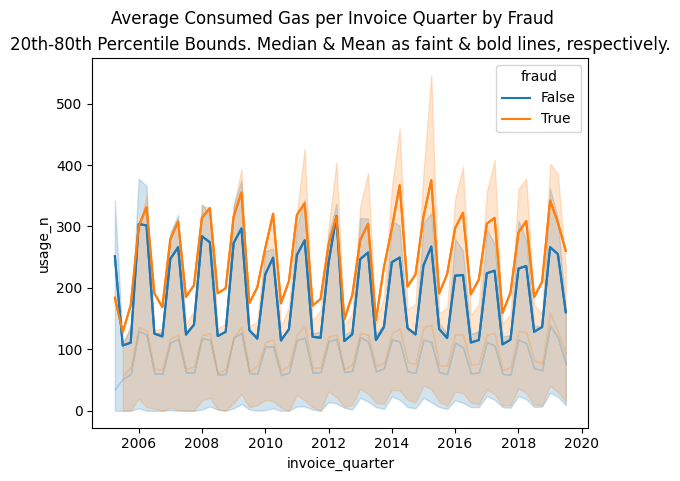

In [84]:
sns.lineplot(data=df_train[df_train['mtr_type'] == 'GAZ'], x='invoice_quarter', y='usage_n', hue='fraud', errorbar=("pi", 60))
sns.lineplot(data=df_train[df_train['mtr_type'] == 'GAZ'], x='invoice_quarter', y='usage_n', hue='fraud', errorbar=("pi", 0), legend=None)
plt.suptitle("Average Consumed Gas per Invoice Quarter by Fraud")
plt.title("20th-80th Percentile Bounds. Median & Mean as faint & bold lines, respectively.")

This is showing 20th - 80th percentile as shaded region, and the mean as the bold line. The median is shown as a fainter line. It should be clear that there is a very large skew in the data given how close the mean values are to the 80th percentile. Also, gas usage has stayed quite steady for both fraud and non-fraud. For electricity, it seems the usage for fraudulent users seem to be rising whereas for non-fraud it seems more steady. Although, for both, it seems the variability is increasing over time.

Here the mean is compared to the Q1 | Q2 | Q3. It shows that the median values are quite similar between fraud and not, but the mean (and Q3) are quite different. It seems, in general, the usage of fraudulent users is higher than non-fraudulent users. In some ways, this is surprising. If they are 'stealing' energy, then I'd have thought the apparent usage would be lower (as they are sourcing it elsewhere). It should again be noted that fraudulent users are flagged for their entire duration. It may be that at any given time, most are not committing fraud, and so, diluting the signal.

Looking for difference in the duration of accounts associated with a given client_id split by fraud.

In [87]:
# Looking at the median difference between the account's oldest and most recent invoice dates.
df_temp = df_train.groupby(['fraud', 'mtr_type', 'client_id'], observed=True).agg({'invoice_date' : ['min', 'max']}).reset_index()
df_temp.columns = df_temp.columns.droplevel(1)
df_temp.columns = ['fraud', 'mtr_type', 'client_id', 'min', 'max']
df_temp['date_diff'] = df_temp['max'] - df_temp['min']
df_temp.groupby(['mtr_type', 'fraud'], observed=False)['date_diff'].agg('median').reset_index()

mtr_type  fraud          date_diff
0     ELEC  False 3489 days 00:00:00
1     ELEC   True 4638 days 12:00:00
2      GAZ  False 3221 days 00:00:00
3      GAZ   True 3526 days 00:00:00

In [88]:
# Looking at the mean difference between the account's oldest and most recent invoice dates.
df_temp.groupby(['mtr_type', 'fraud'], observed=False)['date_diff'].agg('mean').reset_index()

mtr_type  fraud                    date_diff
0     ELEC  False 3099 days 19:02:42.571354752
1     ELEC   True 3945 days 04:14:28.571428544
2      GAZ  False 3044 days 11:51:56.713721056
3      GAZ   True 3418 days 00:18:08.014391680

If looking at a single client_id, its start | end date (and overall duration) will differ. Can either approach it with fixed periods, and having a more sparse matrix, or relative periods. Given how none of the oldest client_id were flagged, it is being assumed the flagging is based on more recent records. This is also supported by the fact that the difference between the groups seems more pronounced the more recent the data is (for electricity, not so much more gas).

Creating a dataframe containing summary statistics of usage for each quarter for the whole range. This approach is doable because we are not looking to extend into a new date-range. If we were, could look at a simple projection to get suitable values for that range.

In [89]:
col_names = ['mtr_type', 'fraud', 'invoice_quarter']
df_temp = (df_train.groupby(col_names, observed=False)
           .agg(usage_mean=('usage_n', 'mean'),
                usage_P05=('usage_n', lambda x: x.quantile(0.05)), 
                usage_Q1=('usage_n', lambda x: x.quantile(0.25)),
                usage_median=('usage_n', 'median'),
                usage_Q3=('usage_n', lambda x: x.quantile(0.75)),
                usage_P95=('usage_n', lambda x: x.quantile(0.95)),
                usage_std=('usage_n', 'std')).reset_index())

# If there were any missing, fill in the gaps (just simple linear interpolation, if at either end, then ffill / bfill)
col_names = ['usage_mean', 'usage_P05', 'usage_Q1', 'usage_median', 'usage_Q3', 'usage_P95', 'usage_std']
for col_name in col_names:
        df_temp[col_name] = df_temp.groupby(['mtr_type', 'fraud'], observed=False)[col_name].apply(lambda group: group.interpolate(method='linear')).reset_index()[col_name]
        df_temp[col_name] = df_temp.groupby(['mtr_type', 'fraud'], observed=False)[col_name].ffill().bfill()

# Get cumulative sum (will be used later)
df_temp['usage_mean_sum'] = df_temp.groupby(['mtr_type', 'fraud'], observed=False).agg(usage_mean_sum=('usage_mean', 'cumsum'))
df_temp['usage_median_sum'] = df_temp.groupby(['mtr_type', 'fraud'], observed=False).agg(usage_median_sum=('usage_median', 'cumsum'))

df_agg = df_temp.copy()

This function is just to temporarily compare a random client_id to the averages of the population.

In [90]:
def Plot_usageplot(df_client, df_agg, client_id):
    col_names = ['mtr_type', 'invoice_quarter']
    temp = (df_client[df_client['client_id'] == client_id].groupby(col_names, observed=False)['usage_n'].agg(['mean', 'median', 'sum']).reset_index())

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    styles_client = {
        'mean': {'color': 'black', 'linestyle': '-'},
        'median': {'color': 'black', 'linestyle': '--'},
        'sum': {'color': 'black', 'linestyle': ':'}
    }

    styles_agg = {
        (True, 'usage_mean', 'mean'): {'color': 'red', 'linestyle': '-'},
        (True, 'usage_median', 'median'): {'color': 'red', 'linestyle': '--'},
        (False, 'usage_mean', 'mean'): {'color': 'green', 'linestyle': '-'},
        (False, 'usage_median', 'median'): {'color': 'green', 'linestyle': '--'}
    }

    for ax, mtr_type in zip(axes, ['ELEC', 'GAZ']):
        # Filter data for each meter type
        data = df_agg[df_agg['mtr_type'] == mtr_type]
        
        # Plot each combination
        for (fraud, metric, metric_name), style in styles_agg.items():
            subset = data[data['fraud'] == fraud]
            ax.plot(
                subset['invoice_quarter'],
                subset[metric],
                label=f"{'Fraud' if fraud else 'No Fraud'} - {metric_name.capitalize()}",
                **style
            )

        data = temp[temp['mtr_type'] == mtr_type]
        for metric, style in styles_client.items():
            ax.plot(
                data['invoice_quarter'],
                data[metric],
                label=f"{'Sample'} - {metric.capitalize()}",
                **style
            )
        
        # Formatting
        ax.set_title(f"Meter Type: {mtr_type}: {client_id}")
        ax.set_xlabel("Invoice Quarter")
        ax.set_ylabel("Value")
        ax.legend()
        ax.grid(True)

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

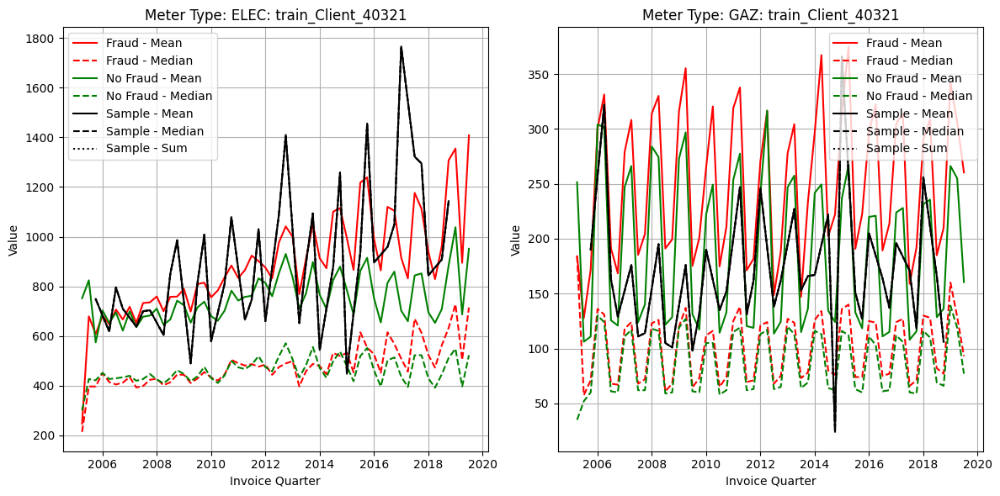

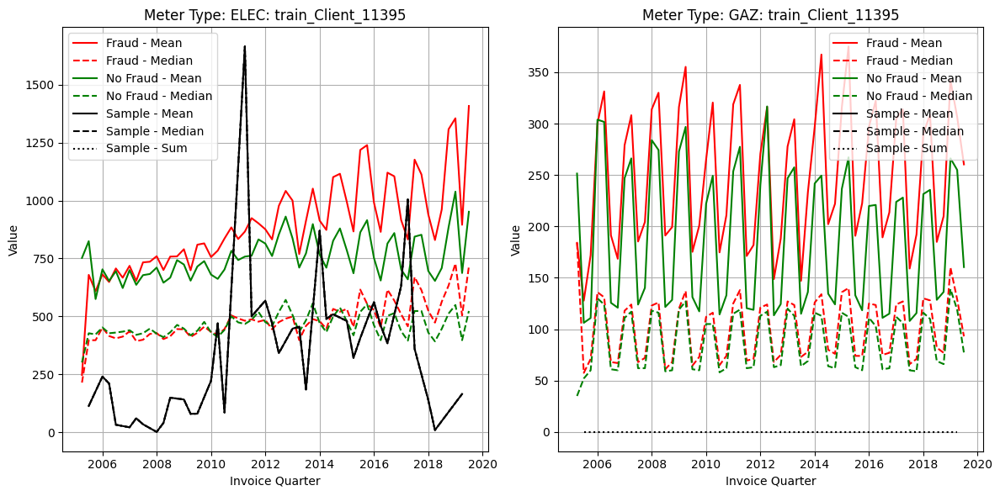

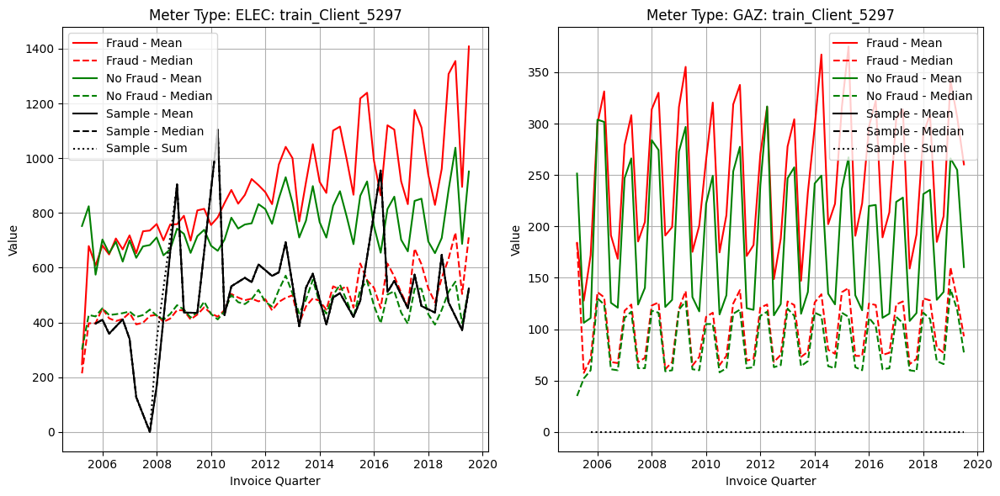

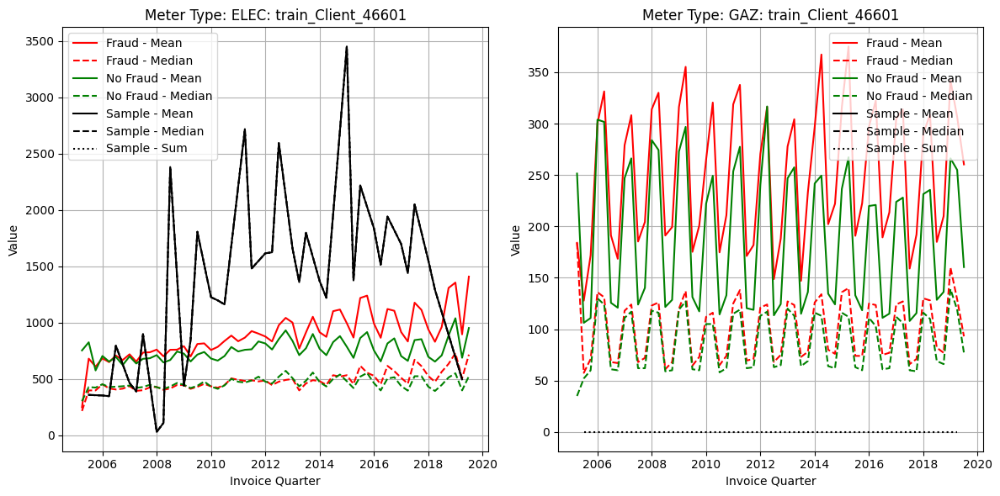

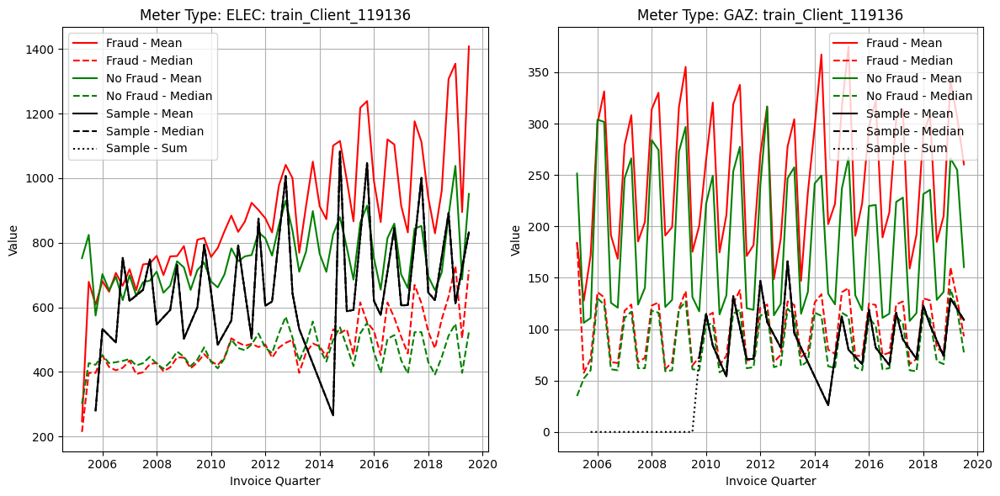

In [91]:
for client_ex in df_train.query('(fraud == False)').sample(n=5)['client_id']: # 5 random non-fraud cases
    Plot_usageplot(df_train, df_temp, client_ex) 

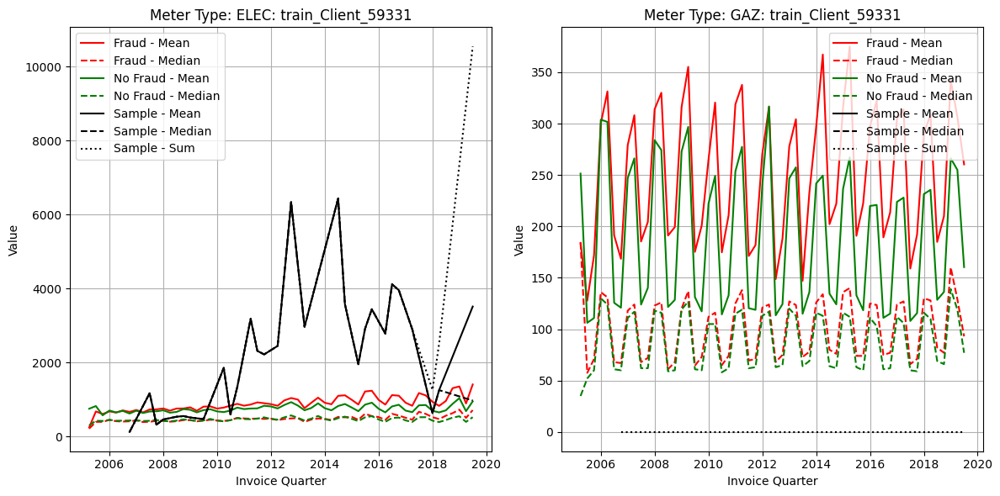

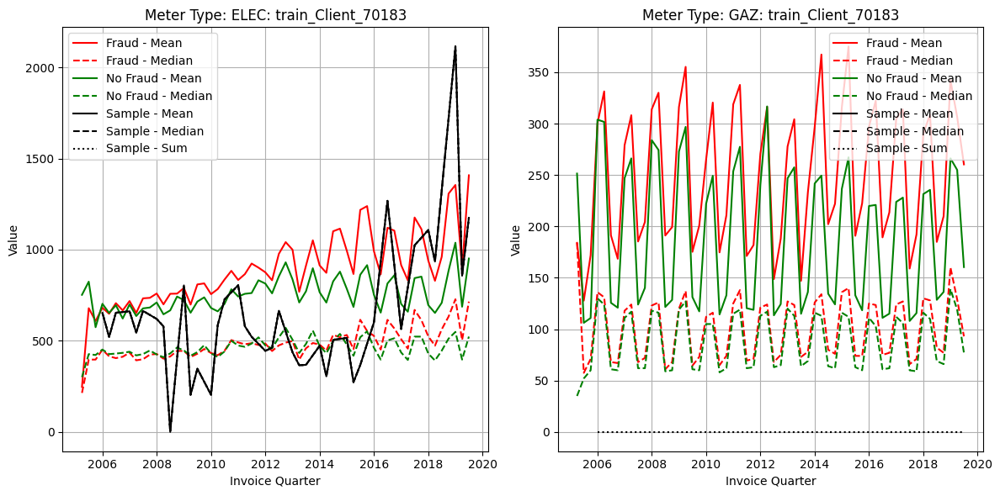

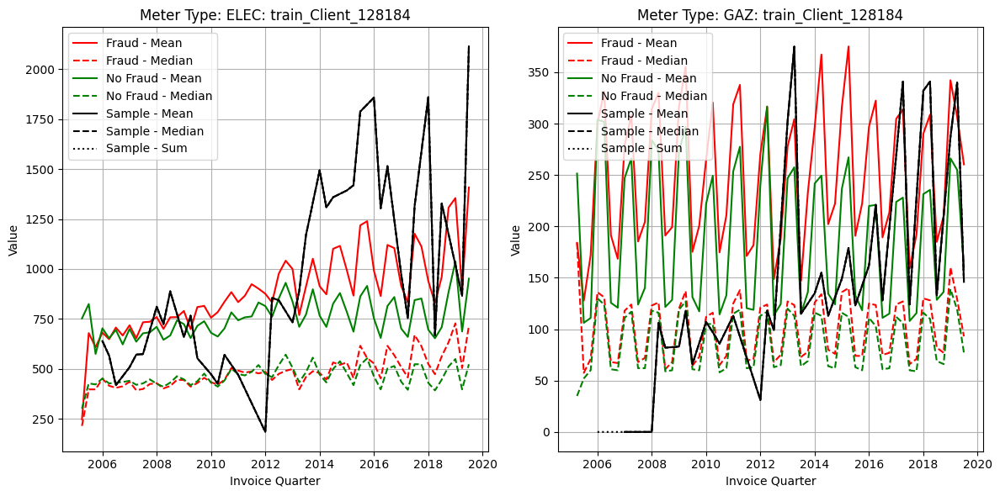

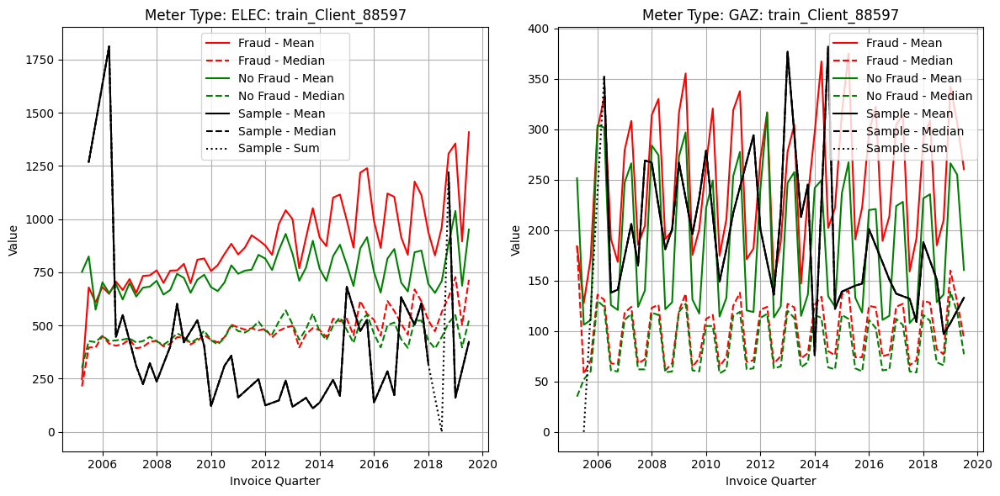

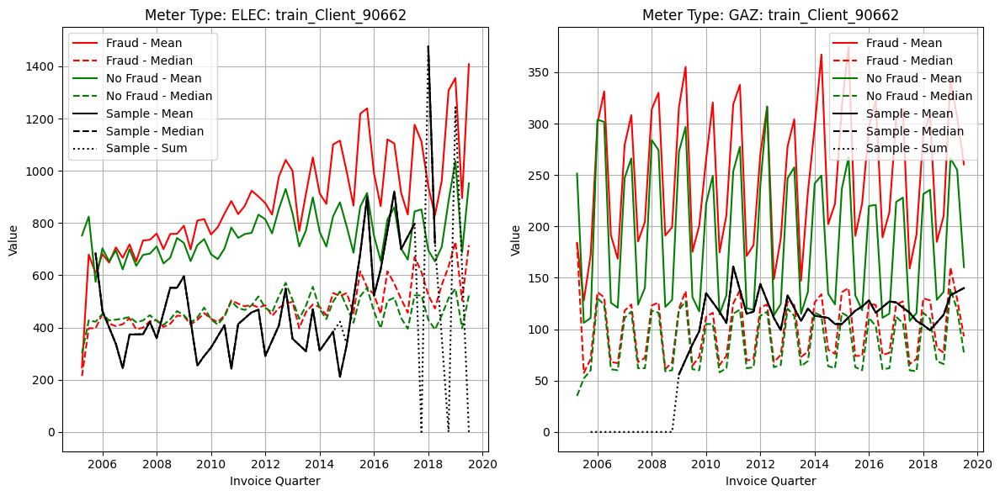

In [92]:
for client_ex in df_train.query('(fraud == True)').sample(n=5)['client_id']: # 5 random fraud cases
    Plot_usageplot(df_train, df_temp, client_ex) 

Expected to see fraud cases generally above non-fraud averages, but this doesn't seem to hold true all the time. Additionally, it is not too clear how to process client_id that have more than one mtr_id. Going forwards, will look to use the Sum as often there may be a mtr_id with 0 usage which can affect the average.

Looking to so if cumulative metrics is better; on one hand the spikes may be informative, on the other, they may be more a product of the interval between invoice dates. This temporary function gets the cumulative sums of the relevant metrics to then plot. One complication is that a given client_id may start and end at a different point than another. When comparing cumulative values, this function will start at the client_id's first invoice date.

In [93]:
def Prep_Client(df_train, df_agg, client_id):
     # Getting summary metrics for population
     df_temp = df_agg[df_agg['fraud'] == True][['mtr_type' , 'invoice_quarter', 'usage_mean', 'usage_median']].copy()
     df_temp.rename(columns={'usage_mean' : 'fraud_usage_mean', 'usage_median': 'fraud_usage_median'}, inplace=True)
     temp = df_agg[df_agg['fraud'] == False][['mtr_type' , 'invoice_quarter', 'usage_mean', 'usage_median']].copy()
     temp.rename(columns={'usage_mean' : 'nofrd_usage_mean', 'usage_median': 'nofrd_usage_median'}, inplace=True)
     df_temp = df_temp.merge(temp, on=['mtr_type', 'invoice_quarter'], how='left')
     # Getting summary metrics for a client
     col_names = ['mtr_type', 'invoice_quarter', 'usage_n']
     temp = (df_train.loc[(df_train['client_id'] == client_id), col_names].groupby(['mtr_type', 'invoice_quarter'], observed=False)
             .agg(used_mean=('usage_n', 'mean'),
                  used_median=('usage_n', 'median'),
                  used_sum=('usage_n', 'sum')).reset_index())
     # Combine summary metrics for population with client
     df_temp = df_temp.merge(temp[['mtr_type', 'invoice_quarter', 'used_mean', 'used_median', 'used_sum']], on=['mtr_type', 'invoice_quarter'], how='left')
     
     # Find first a last entry for electricity and gas to truncate
     temp = df_temp.groupby('mtr_type', observed=False).agg(valid_min=('used_median', lambda x: x.first_valid_index()),
                                                            valid_max=('used_median', lambda x: x.last_valid_index())).reset_index()
     # Remove unnecessary rows
     elec_start = temp.loc[temp['mtr_type'] == 'ELEC', 'valid_min'].iloc[0]
     elec_end = temp.loc[temp['mtr_type'] == 'ELEC', 'valid_max'].iloc[0]
     gas_start = temp.loc[temp['mtr_type'] == 'GAZ', 'valid_min'].iloc[0]
     gas_end = temp.loc[temp['mtr_type'] == 'GAZ', 'valid_max'].iloc[0]
     if np.isnan(elec_start):
          elec_start = 115 
          elec_end = 115 # use last index
     if np.isnan(gas_start):
          gas_start = 115 
          gas_end = 115 # use last index

     df_temp = df_temp.iloc[np.r_[elec_start:(elec_end+1), gas_start:(gas_end+1)], :]
     # Get agg metrics
     col_names = ['fraud_pop_mean_sum', 'fraud_pop_median_sum', 'nofrd_pop_mean_sum', 'nofrd_pop_median_sum', 'ind_mean_sum', 'ind_median_sum', 'ind_sum_sum']
     df_temp[col_names] = (df_temp.groupby('mtr_type', observed=False)
                         .agg(fraud_pop_mean_sum=('fraud_usage_mean', 'cumsum'),
                              fraud_pop_median_sum=('fraud_usage_median', 'cumsum'),
                              nofrd_pop_mean_sum=('nofrd_usage_mean', 'cumsum'),
                              nofrd_pop_median_sum=('nofrd_usage_median', 'cumsum'),
                              ind_mean_sum=('used_mean', 'cumsum'),
                              ind_median_sum=('used_median', 'cumsum'),
                              ind_sum_sum=('used_sum', 'cumsum')))
     # Fill in gaps: Might want to swap to linear interpolation.
     df_temp['ind_mean_sum'] = df_temp['ind_mean_sum'].ffill()
     df_temp['ind_median_sum'] = df_temp['ind_median_sum'].ffill()
     df_temp['ind_sum_sum'] = df_temp['ind_sum_sum'].ffill()
     # Saving a reverse to compare
     col_names = ['fraud_pop_mean_sum', 'fraud_pop_median_sum', 'nofrd_pop_mean_sum', 'nofrd_pop_median_sum', 'ind_mean_sum', 'ind_median_sum', 'ind_sum_sum']
     for col_name in col_names:
          df_temp[col_name+'_rev'] = - df_temp[col_name]
          for nrg_type in ['ELEC', 'GAZ']:
               df_temp.loc[df_temp['mtr_type'] == nrg_type, col_name+'_rev'] = df_temp.loc[df_temp['mtr_type'] == nrg_type, col_name+'_rev'] + df_temp.loc[df_temp['mtr_type'] == nrg_type, col_name].max()

     df_temp = df_temp[df_temp['ind_mean_sum'].notna()]
     return df_temp

In [94]:
def Plot_cumusageplot(df_client, client_id, rev, delta):
    col_names = ['mtr_type', 'invoice_quarter']

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    if delta is True:
        # This will look at ind_sum_sum versus the population metrics      
        styles = {
            ('Client delta from Fraud', 'fraud_pop_mean_sum', 'mean'): {'color': 'red', 'linestyle': '-'},
            ('Client delta from No Fraud', 'nofrd_pop_mean_sum', 'mean'): {'color': 'green', 'linestyle': '-'},
            ('Client delta from Fraud', 'fraud_pop_median_sum', 'median'): {'color': 'red', 'linestyle': '--'},
            ('Client delta from No Fraud', 'nofrd_pop_median_sum', 'median'): {'color': 'green', 'linestyle': '--'}
        }
    else:
        styles = {
            ('Client', 'ind_mean_sum', 'mean'): {'color': 'black', 'linestyle': '-'},
            ('Client', 'ind_median_sum', 'median'): {'color': 'black', 'linestyle': '--'},
            ('Client', 'ind_sum_sum', 'sum'): {'color': 'black', 'linestyle': ':'},
            ('Fraud', 'fraud_pop_mean_sum', 'mean'): {'color': 'red', 'linestyle': '-'},
            ('No Fraud', 'nofrd_pop_mean_sum', 'mean'): {'color': 'green', 'linestyle': '-'},
            ('Fraud', 'fraud_pop_median_sum', 'median'): {'color': 'red', 'linestyle': '--'},
            ('No Fraud', 'nofrd_pop_median_sum', 'median'): {'color': 'green', 'linestyle': '--'}
        }

    for ax, mtr_type in zip(axes, df_client['mtr_type'].unique()):
        # Filter data for each meter type
        data = df_client[df_client['mtr_type'] == mtr_type]
        
        # Plot each combination
        for (desc, metric, metric_name), style in styles.items():
            ax.plot(
                data['invoice_quarter'],
                data[metric if rev is False else metric+'_rev'] if delta is False else (data['ind_sum_sum' if rev is False else 'ind_sum_sum_rev'] - data[metric if rev is False else metric+'_rev']),
                label=f"{desc} - {metric_name.capitalize()}",
                **style
        )
        
        # Formatting
        ax.set_title(f"Meter Type: {mtr_type}: {client_id}")
        ax.set_xlabel("Invoice Quarter")
        ax.set_ylabel("Value")
        ax.legend()
        ax.grid(True)

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

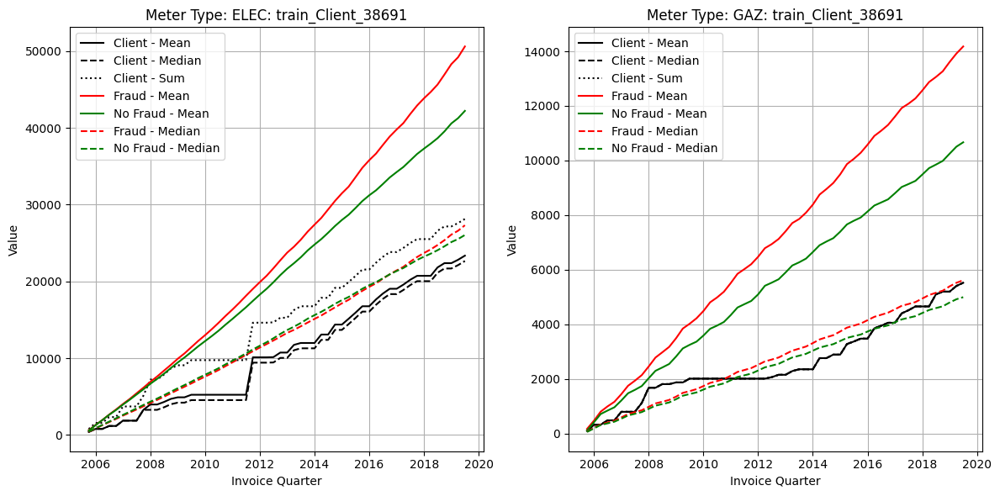

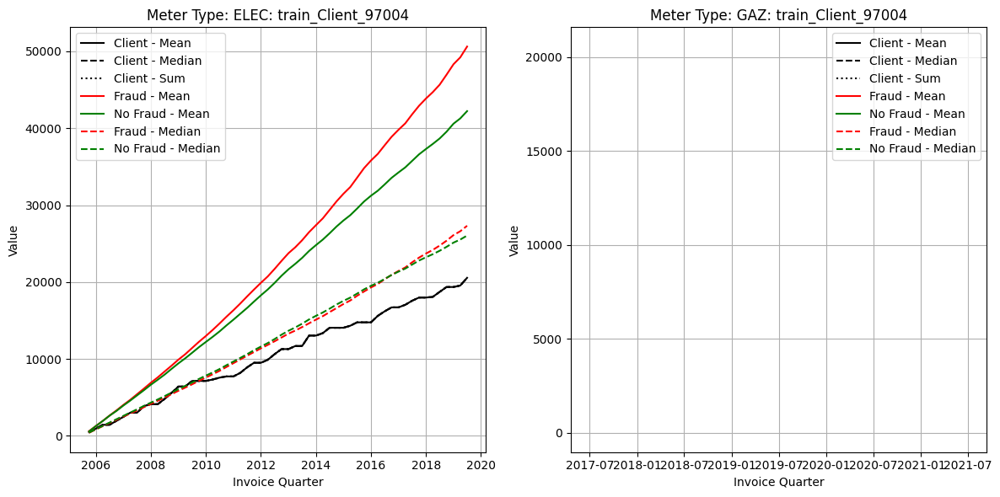

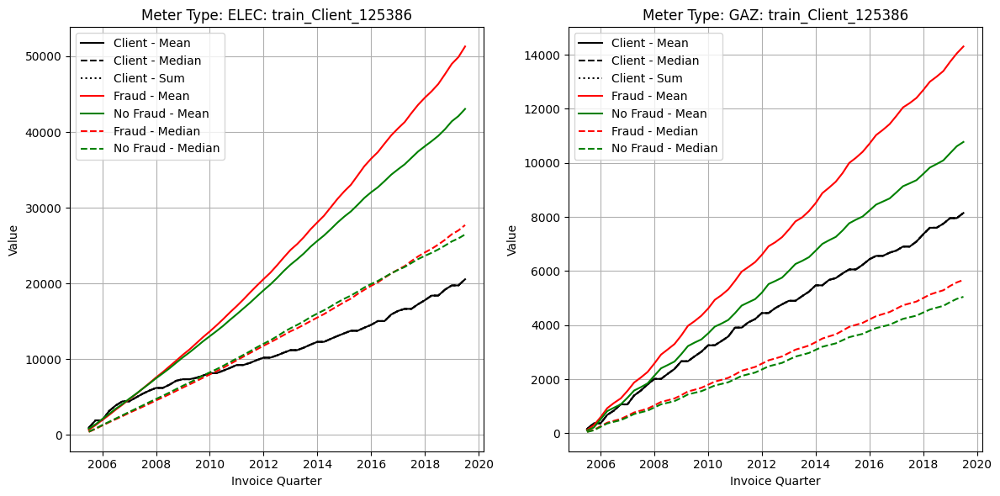

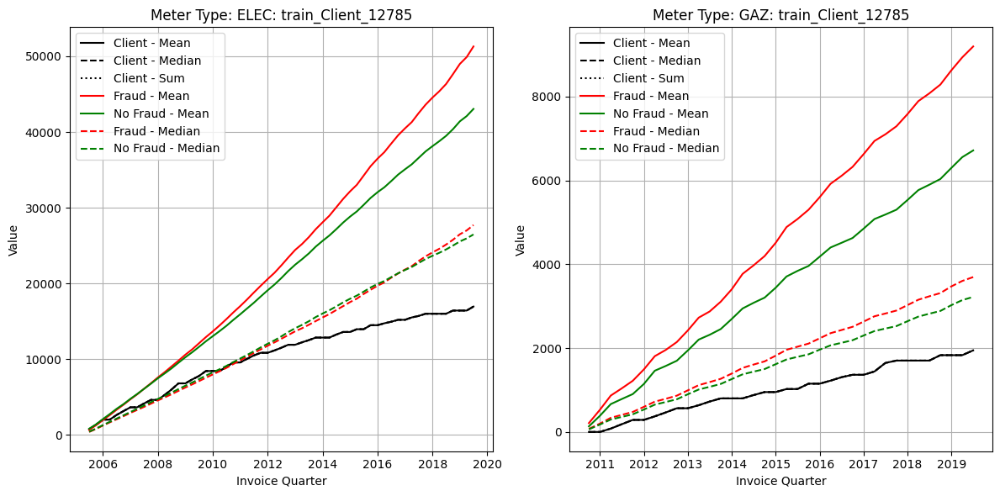

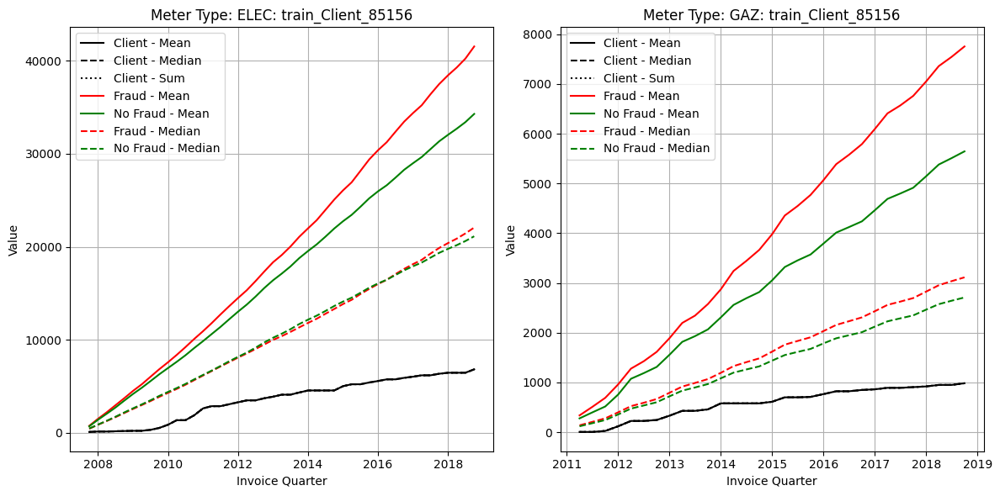

In [95]:
for client_ex in df_train.query('(fraud == False)').sample(n=5)['client_id']: # 5 random non-fraud cases
    Plot_cumusageplot(Prep_Client(df_train, df_agg, client_ex), client_ex, False, False) 

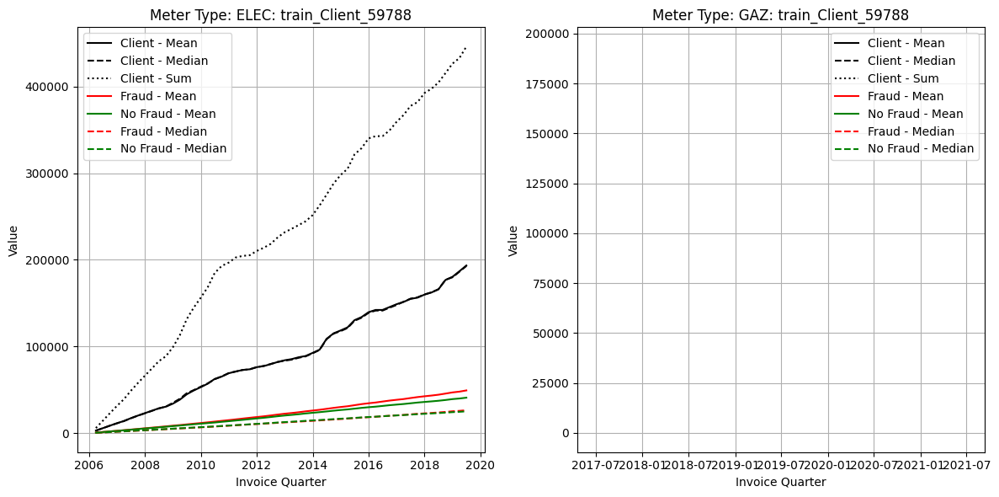

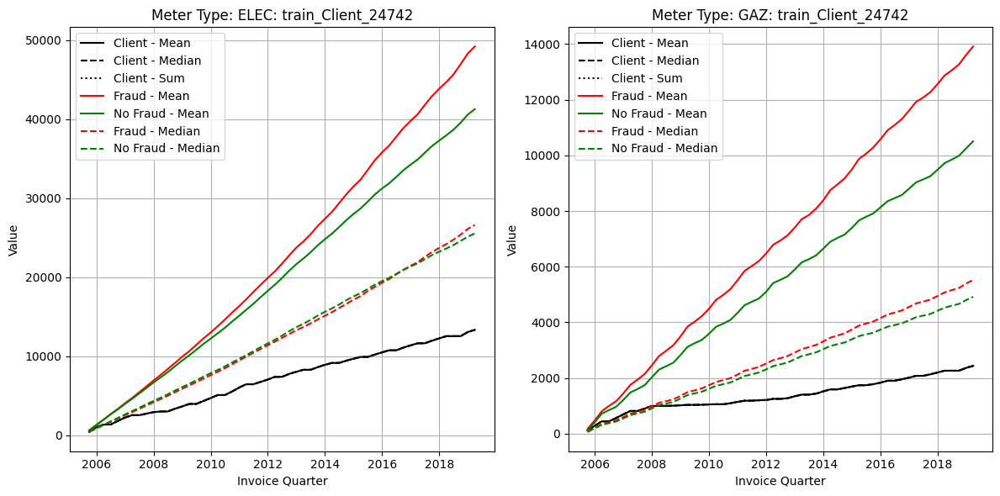

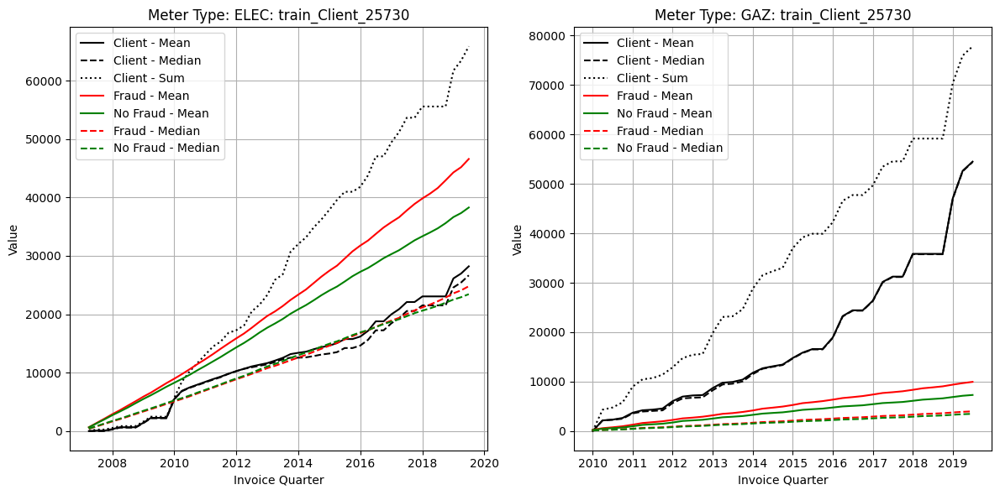

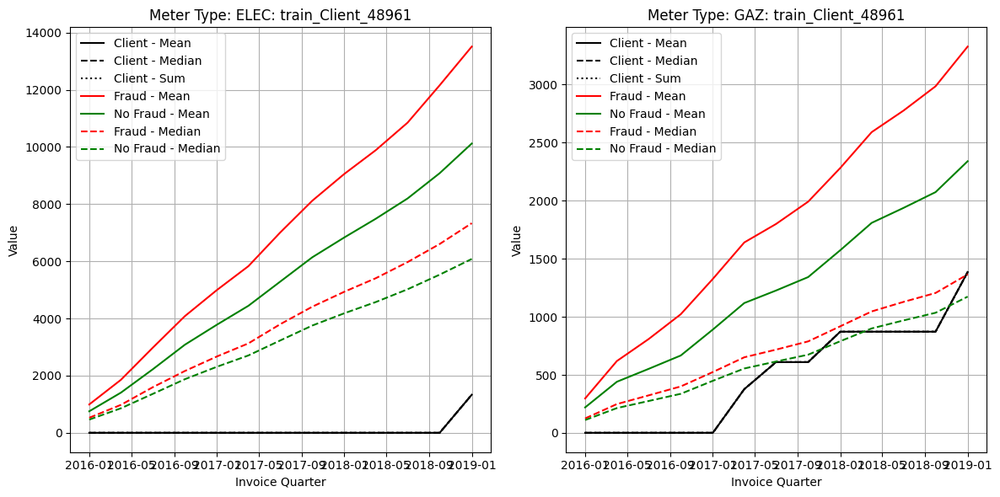

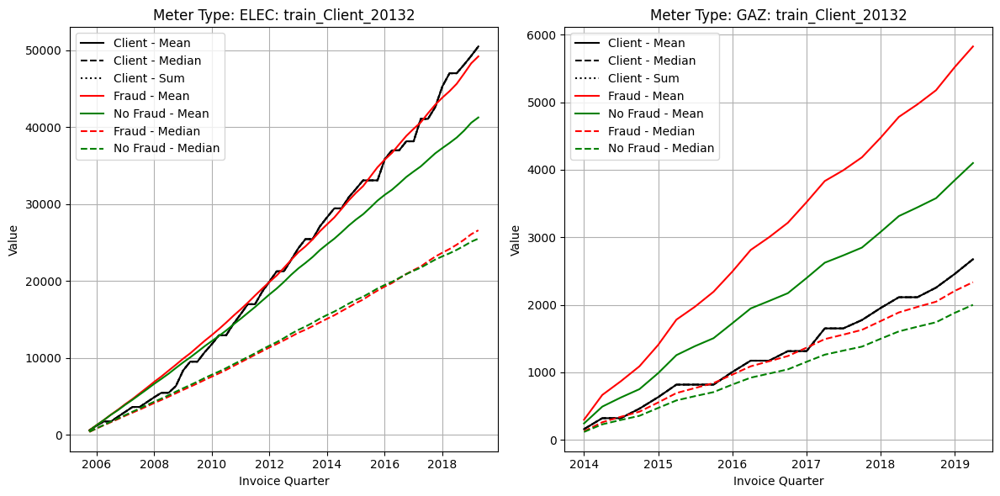

In [96]:
for client_ex in df_train.query('(fraud == True)').sample(n=5)['client_id']: # 5 random fraud cases
    Plot_cumusageplot(Prep_Client(df_train, df_agg, client_ex), client_ex, False, False)

Doesn't seem to have very clear signs between fraud and non-fraud. Additionally, this has a variable window which is not ideal for making tabular set for ML. There is also an issue as to how to account for those with multiple meters. Often, one might be running at 0, this would heavily affect the average for that client. Perhaps, sum is the way to go (the dotted line).

If we go with theory that these are labelled based on more recent data, those further back are less important. In this case, we may want to sum in reverse, starting from most recent date.

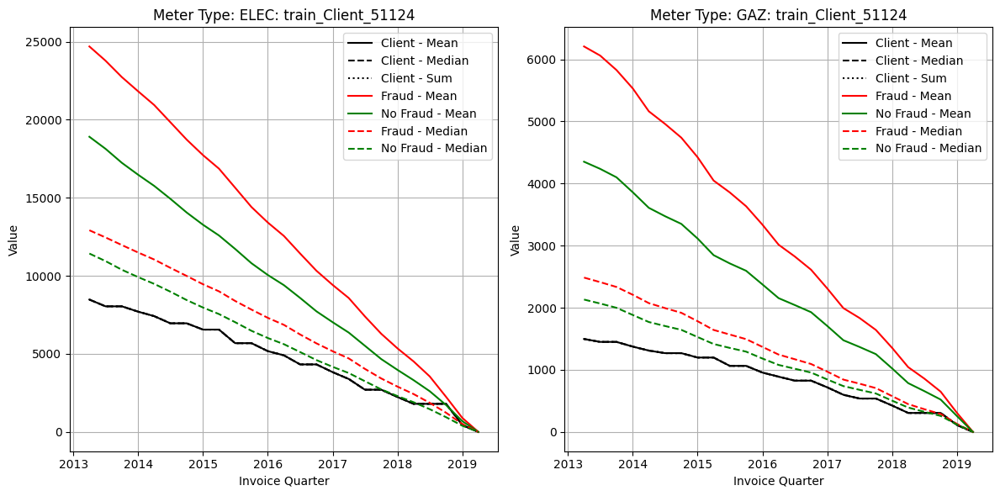

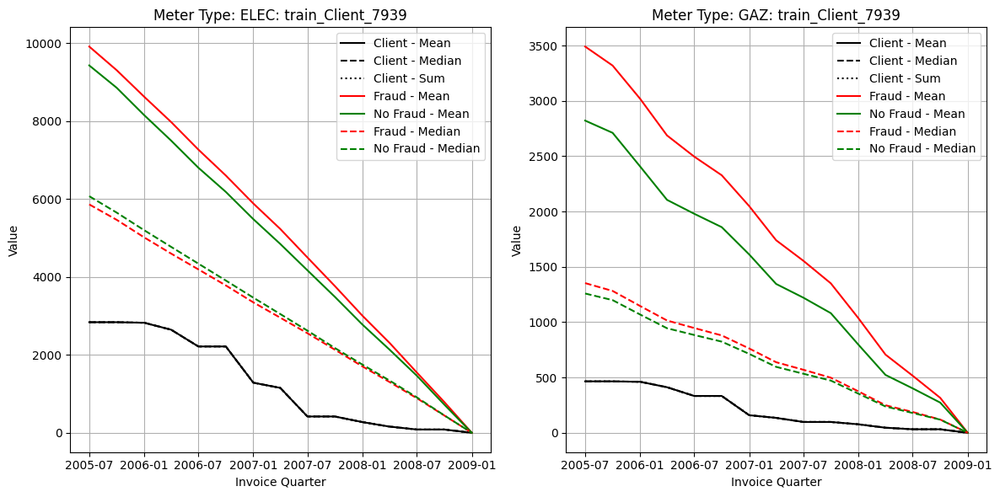

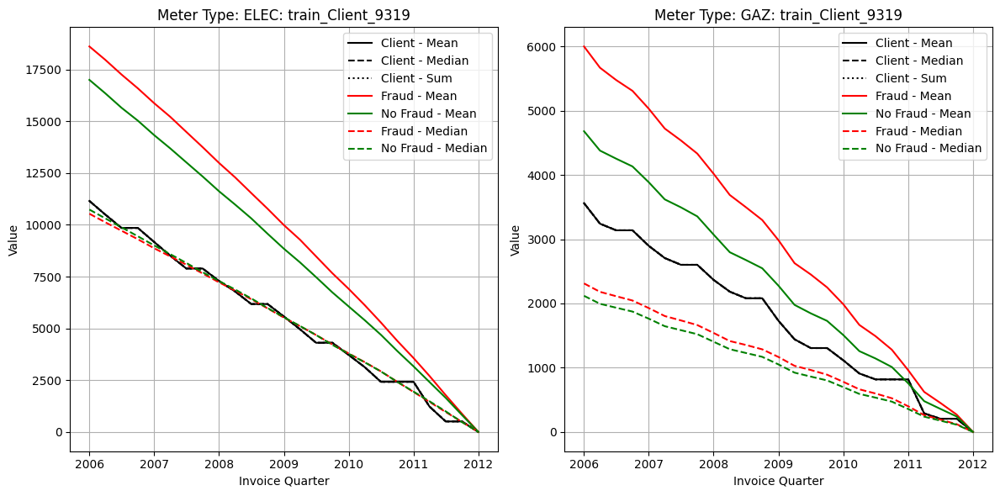

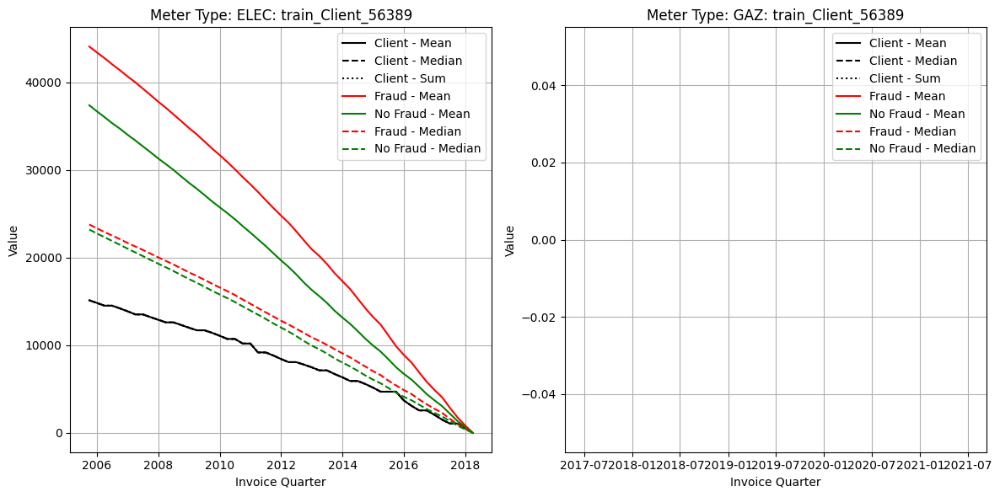

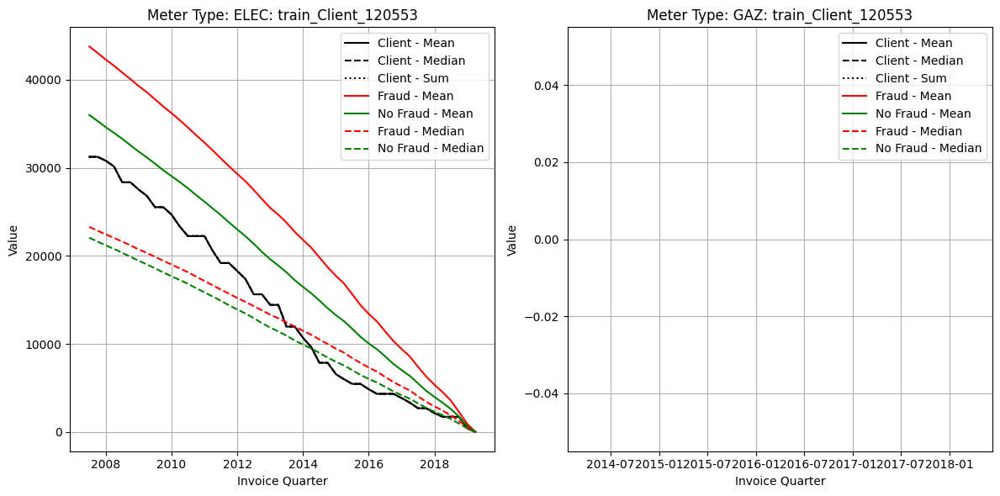

In [97]:
for client_ex in df_train.query('(fraud == False)').sample(n=5)['client_id']: # 5 random non-fraud cases
    Plot_cumusageplot(Prep_Client(df_train, df_agg, client_ex), client_ex, True, False) 

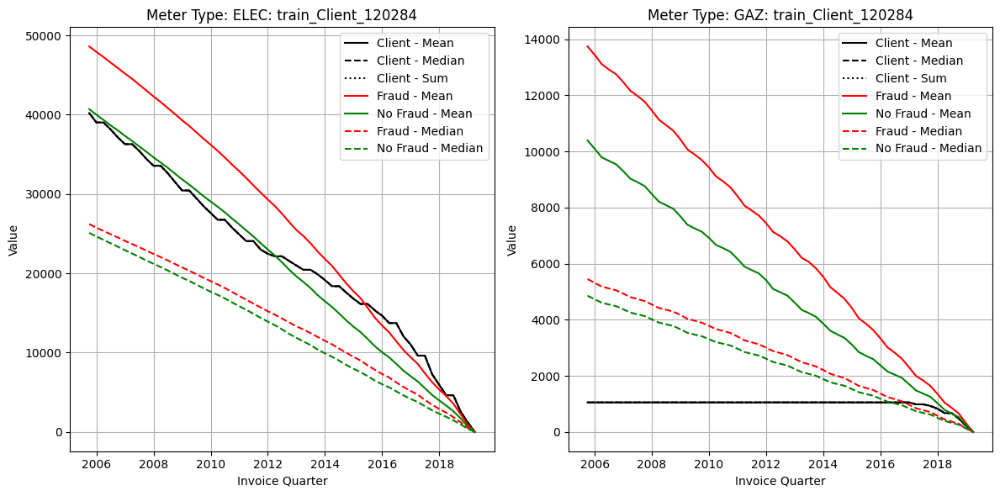

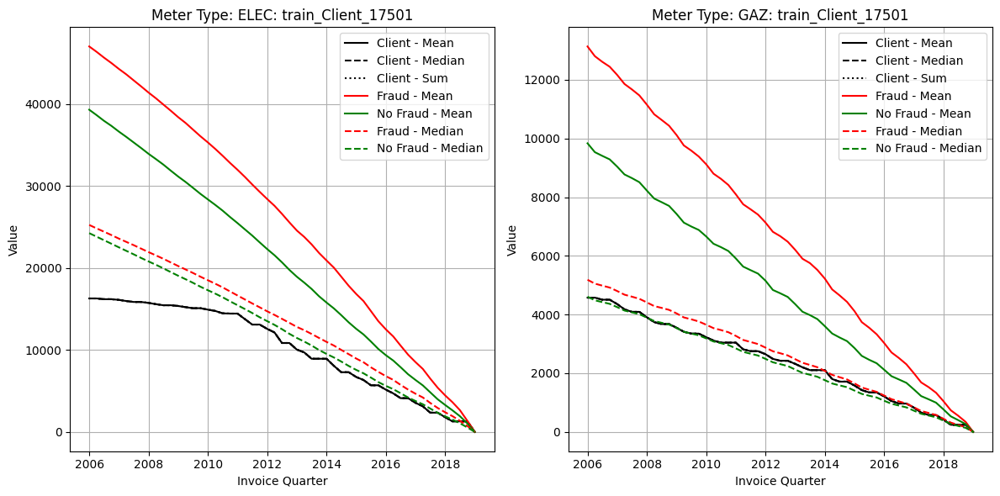

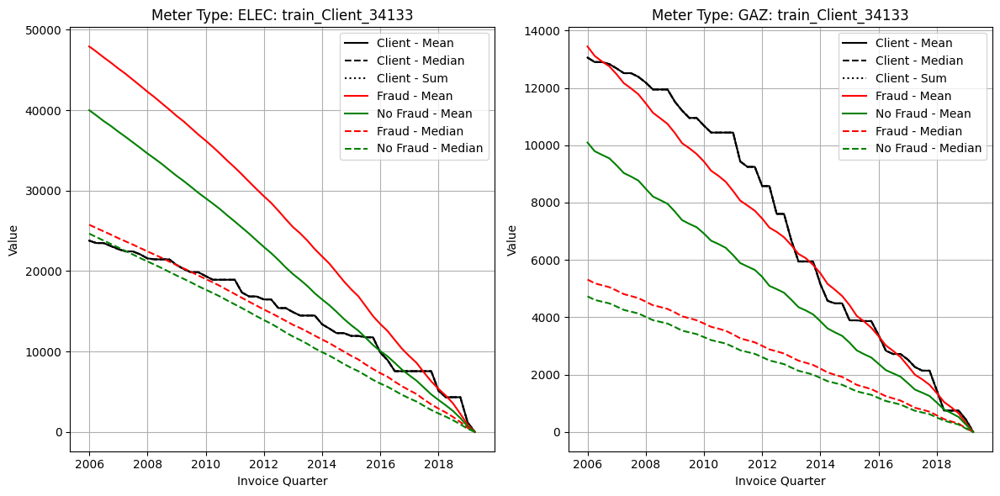

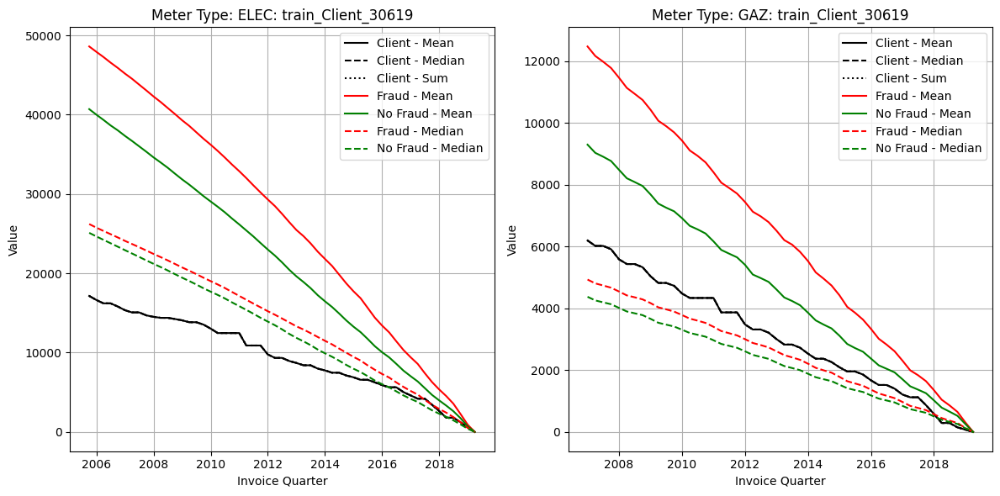

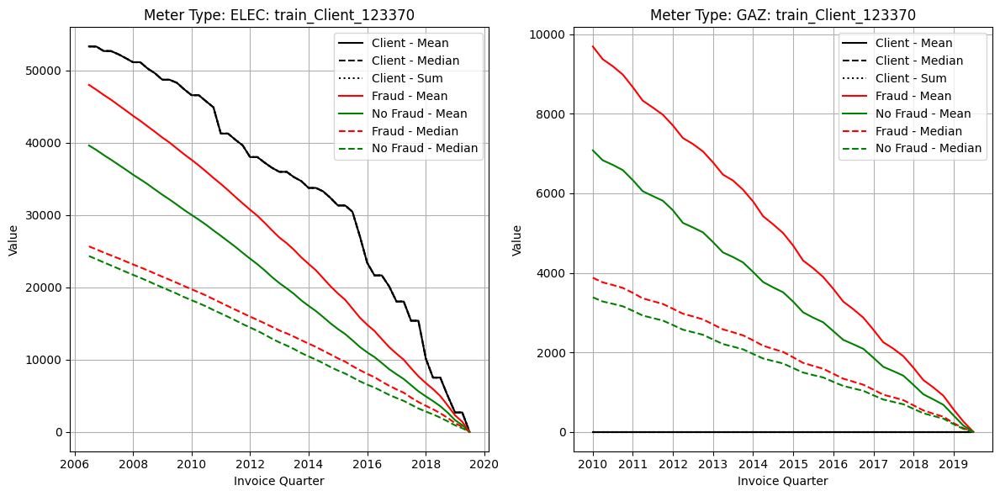

In [98]:
for client_ex in df_train.query('(fraud == True)').sample(n=5)['client_id']: # 5 random fraud cases
    Plot_cumusageplot(Prep_Client(df_train, df_agg, client_ex), client_ex, True, False) 

At this point, I feel very doubtful that there is sufficient information to successfully identify many of these cases. Will try to make four lines: the delta between the history vs the population (Fraud-Mean, Fraud-Median, No_Fraud-Mean, No_Fraud-Median).

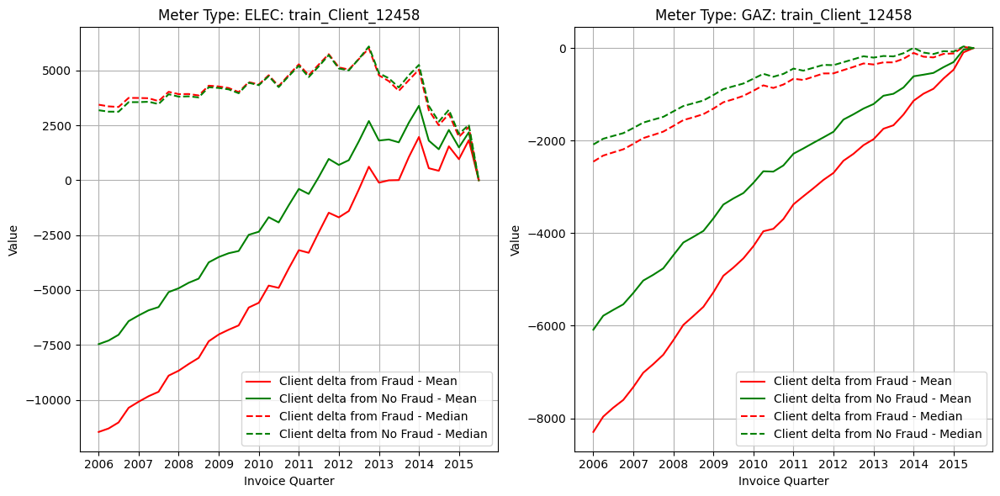

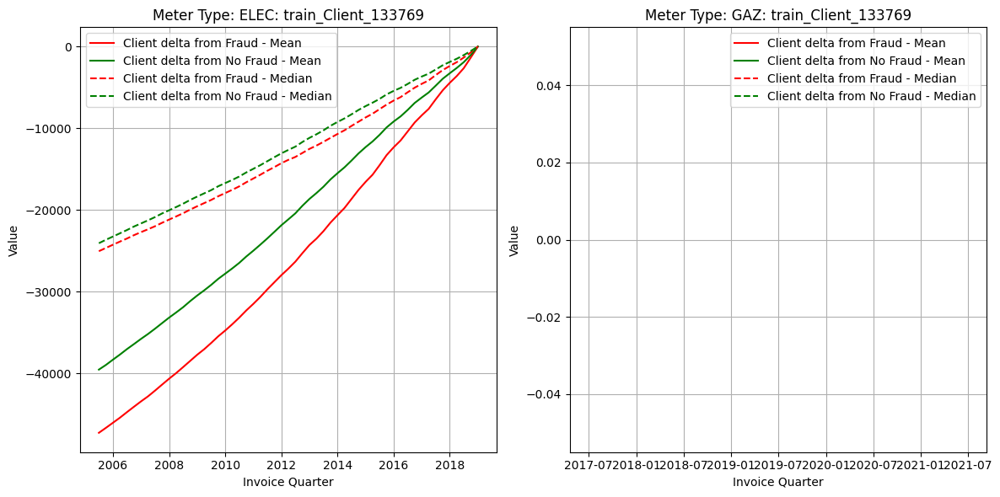

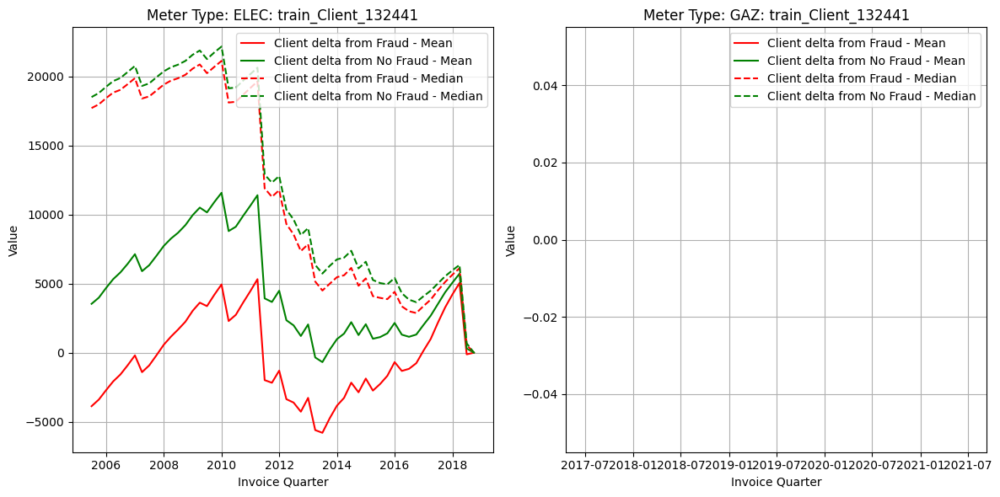

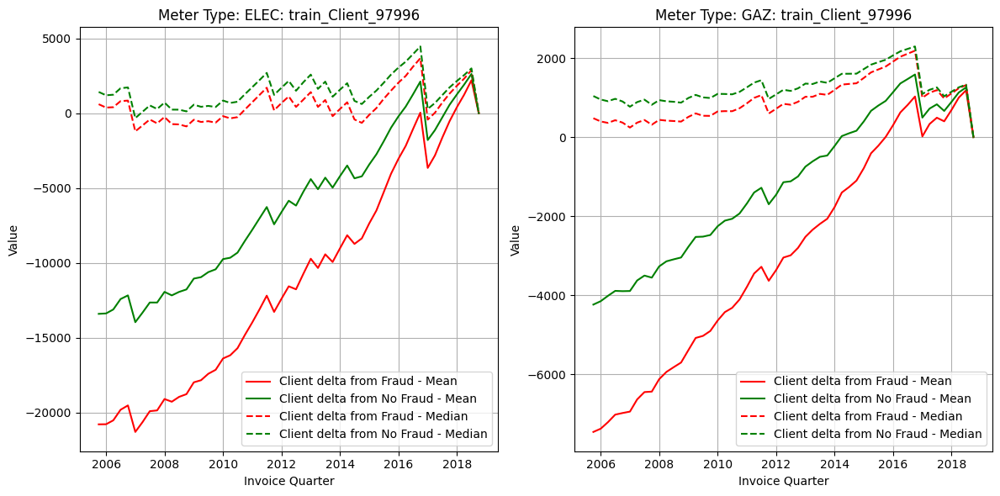

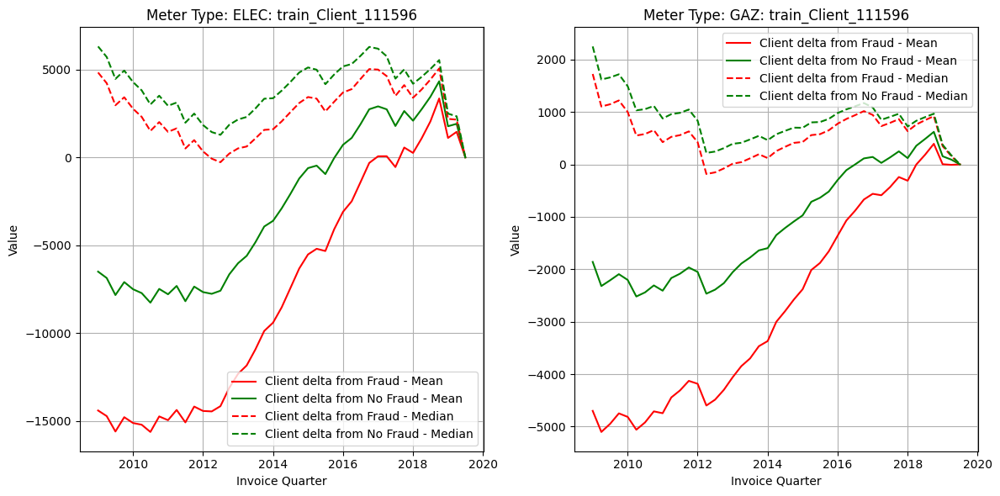

In [99]:
for client_ex in df_train.query('(fraud == False)').sample(n=5)['client_id']: # 5 random non-fraud cases
    Plot_cumusageplot(Prep_Client(df_train, df_agg, client_ex), client_ex, True, True) 

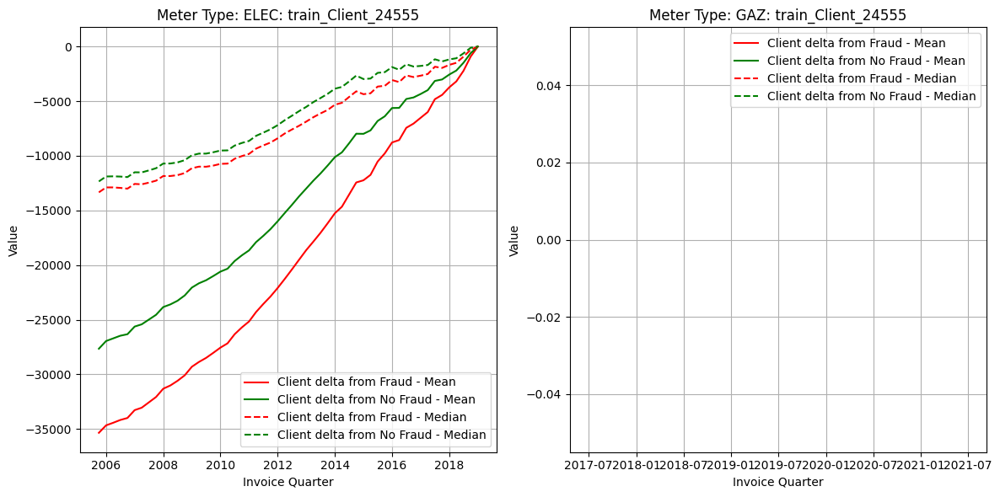

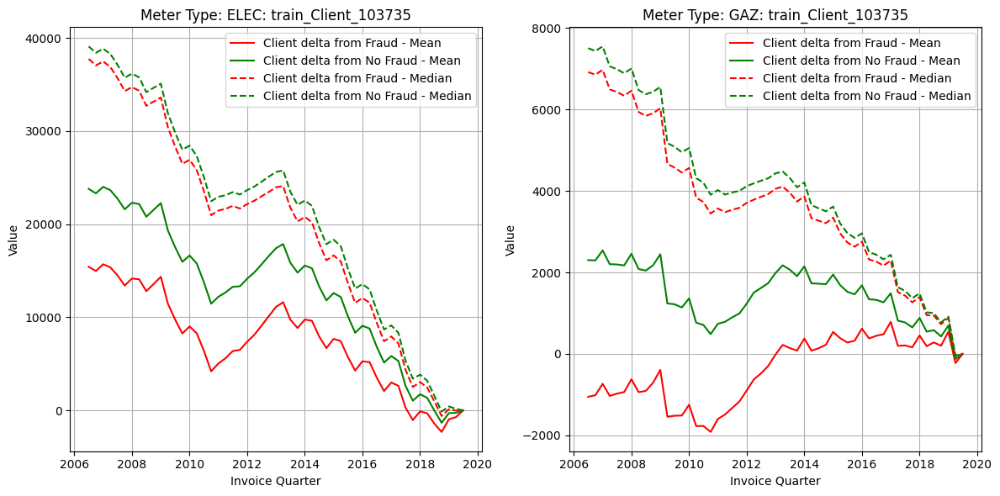

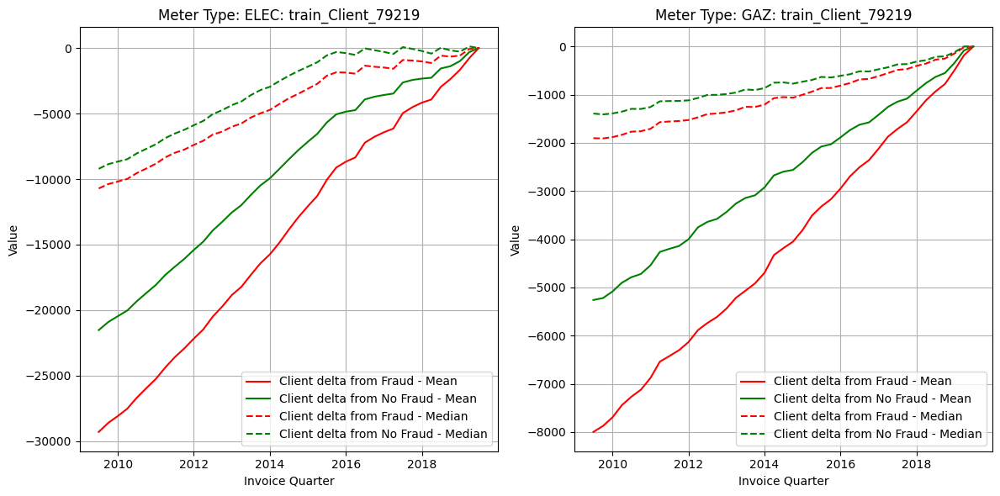

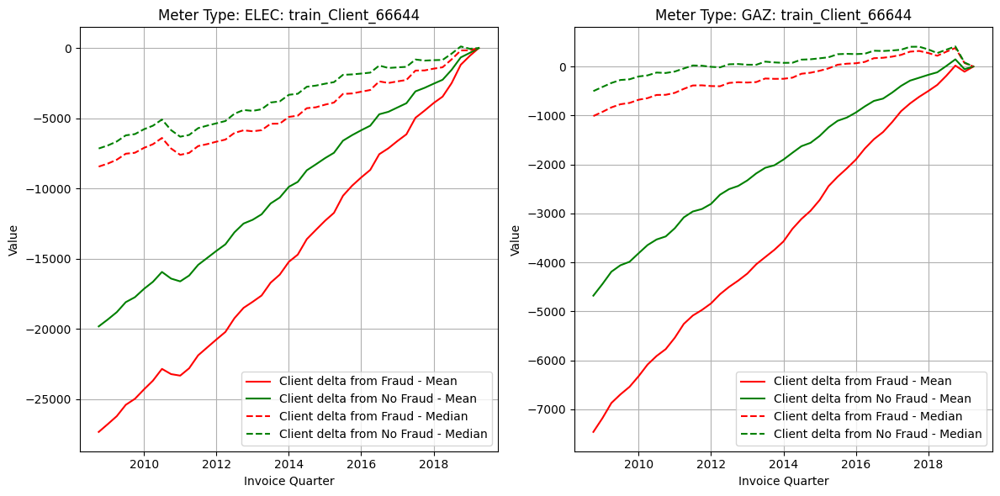

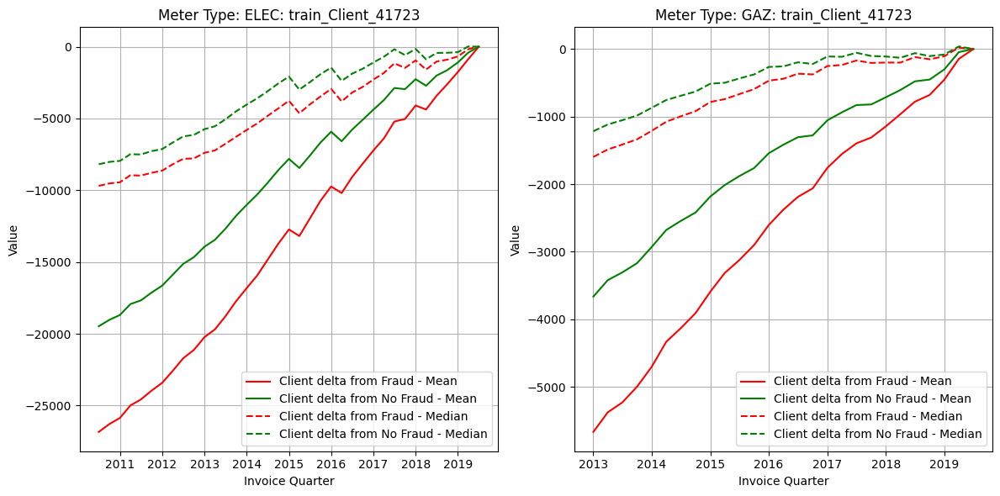

In [100]:
for client_ex in df_train.query('(fraud == True)').sample(n=5)['client_id']: # 5 random fraud cases
    Plot_cumusageplot(Prep_Client(df_train, df_agg, client_ex), client_ex, True, True) 

It seems like redundant information in Fraud and No Fraud, especially with the median values. However, let's keep it for now. Going to take the latest 5Y, and saving them as column of "age", such that the latest value will always be in the same column, regardless of the actual Y-Q it was in.

In [103]:
#df_safe = df_train.copy()

In [134]:
df_train = df_safe.copy()

In [135]:
df_usage = df_train.merge((df_train.groupby('client_id')['invoice_quarter'].max() - pd.DateOffset(years=5)).rename('five_year_cutoff'), on='client_id')
df_usage = df_usage[df_usage['invoice_quarter'] >= df_usage['five_year_cutoff']].drop(columns='five_year_cutoff')
df_usage = df_usage.groupby(['client_id', 'mtr_type', 'invoice_quarter'], observed = False).agg(usage_sum=('usage_n', 'sum')).reset_index()

Care, this cell can take a while to run (for me, ~2min). I should get better at coding this kind of stuff, there is probably more efficient way here...

In [106]:
# Step 1: Generate the full range of quarters for each client_id and mtr_type then combine
full_quarters = []
for client_id, group in df_usage.groupby('client_id'):
    quarters = pd.date_range(start=group['invoice_quarter'].min(), end=group['invoice_quarter'].max(), freq='QS')
    for mtr_type in group['mtr_type'].unique():
        full_quarters.append(pd.DataFrame({
            'client_id': client_id,
            'mtr_type': mtr_type,
            'invoice_quarter': quarters
        }))
full_quarters_df = pd.concat(full_quarters, ignore_index=True)

In [136]:
# Step 2: Merge with df_usage to include missing rows and sort
df_usage = full_quarters_df.merge(df_usage, on=['client_id', 'mtr_type', 'invoice_quarter'], how='left')
df_usage = df_usage.sort_values(by=['client_id', 'mtr_type', 'invoice_quarter']).reset_index(drop=True)

# Step 3: Merge with df_agg to have population statistics (this approach feels dumb, maybe there is a way to bring both 'fraud' at once) 
df_usage = df_usage.merge(
    df_agg.loc[df_agg['fraud'] == True, ['mtr_type', 'invoice_quarter', 'usage_mean', 'usage_median', 'usage_mean_sum', 'usage_median_sum']],
    on=['mtr_type', 'invoice_quarter'],
    how='left'
)
df_usage.rename(columns={'usage_mean':'fraud_usage_mean', 'usage_median':'fraud_usage_median', 
                         'usage_mean_sum':'fraud_usage_mean_sum', 'usage_median_sum':'fraud_usage_median_sum'}, inplace = True)
df_usage = df_usage.merge(
    df_agg.loc[df_agg['fraud'] == False, ['mtr_type', 'invoice_quarter', 'usage_mean', 'usage_median', 'usage_mean_sum', 'usage_median_sum']],
    on=['mtr_type', 'invoice_quarter'],
    how='left'
)
df_usage.rename(columns={'usage_mean':'nofrd_usage_mean', 'usage_median':'nofrd_usage_median', 
                         'usage_mean_sum':'nofrd_usage_mean_sum', 'usage_median_sum':'nofrd_usage_median_sum'}, inplace = True)

In [137]:
# Step 4a: Get cumulative values of clients' usage, and then reverse it
mask = df_usage.groupby(['client_id', 'mtr_type'])
df_usage['usage_sum_sum'] = mask.agg(usage_sum_sum=('usage_sum', 'cumsum')).interpolate(method='linear').fillna(0)
df_usage['usage_sum_sum'] = mask['usage_sum_sum'].transform('max') - df_usage['usage_sum_sum']

# Step 4b: Get cumulative values of population, reverse them, then calculate deltas: from fraud|nofrd mean|median.
# Note: since the cumulative data is from fixed starting point, it needs to be offset appropriately
# The difference between the first value and the first cumulative value is the amount all cumulative values have to be reduced
# Lastly, calculate the delta between population's cumulative usage and the client's
mask = df_usage.groupby(['client_id', 'mtr_type'])
col_names = ['fraud_usage_mean', 'fraud_usage_median', 'nofrd_usage_mean', 'nofrd_usage_median'] 
for col_name in col_names:
    df_usage[col_name] = mask[str(col_name)+'_sum'].transform('first') - mask[str(col_name)].transform('first')
    df_usage[str(col_name)+'_sum'] = df_usage[str(col_name)+'_sum'] - df_usage[col_name]
    df_usage[str(col_name)+'_sum'] = mask[str(col_name)+'_sum'].transform('max') - df_usage[str(col_name)+'_sum']
    df_usage[str(col_name)+'_sum'] = df_usage[str(col_name)+'_sum'] - df_usage['usage_sum_sum']
df_usage.drop(columns=col_names+['usage_sum', 'usage_sum_sum'], inplace=True)

Looking to plot this

In [109]:
def Plot_usagemetric(df_client):
    col_names = ['mtr_type', 'invoice_quarter']

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # This will look at cumulative deltas between client's usage and population (reversed)
    styles = {
        ('Client delta from Fraud', 'fraud_usage_mean_sum', 'mean'): {'color': 'red', 'linestyle': '-'},
        ('Client delta from No Fraud', 'nofrd_usage_mean_sum', 'mean'): {'color': 'green', 'linestyle': '-'},
        ('Client delta from Fraud', 'fraud_usage_median_sum', 'median'): {'color': 'red', 'linestyle': '--'},
        ('Client delta from No Fraud', 'nofrd_usage_median_sum', 'median'): {'color': 'green', 'linestyle': '--'}
    }

    for ax, mtr_type in zip(axes, df_client['mtr_type'].unique()):
        # Filter data for each meter type
        data = df_client[df_client['mtr_type'] == mtr_type]
        
        # Plot each combination
        for (desc, metric, metric_name), style in styles.items():
            ax.plot(
                data['invoice_quarter'],
                data[metric],
                label=f"{desc} - {metric_name.capitalize()}",
                **style
        )
        
        # Formatting
        ax.set_title(f"Meter Type: {mtr_type}: {client_id}")
        ax.set_xlabel("Invoice Quarter")
        ax.set_ylabel("Value")
        ax.legend()
        ax.grid(True)

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

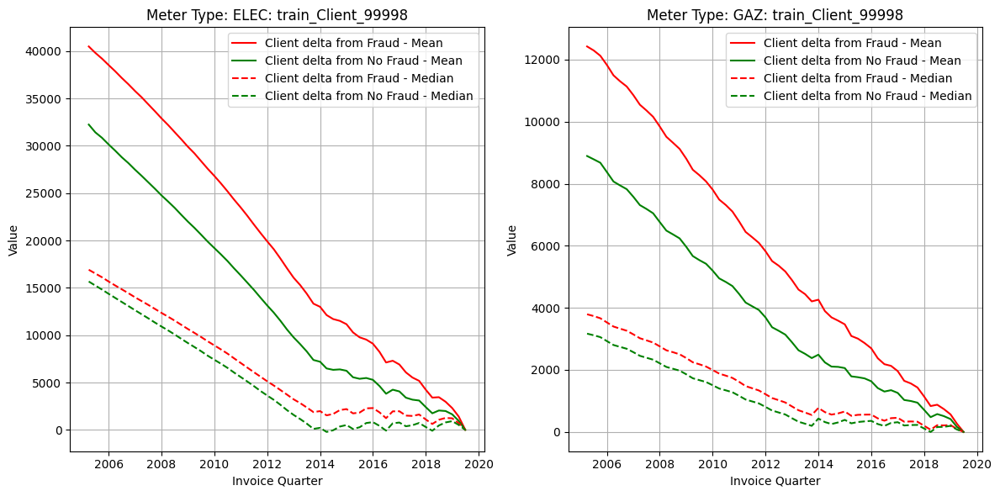

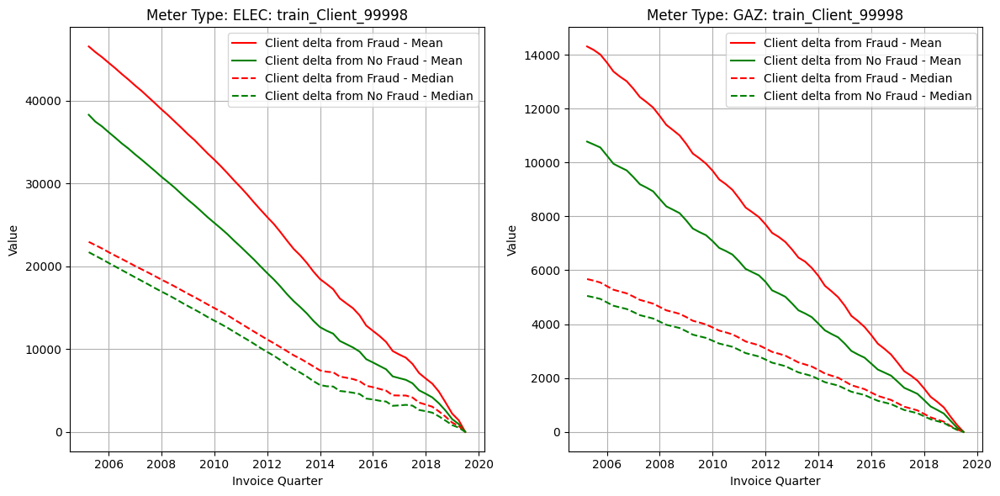

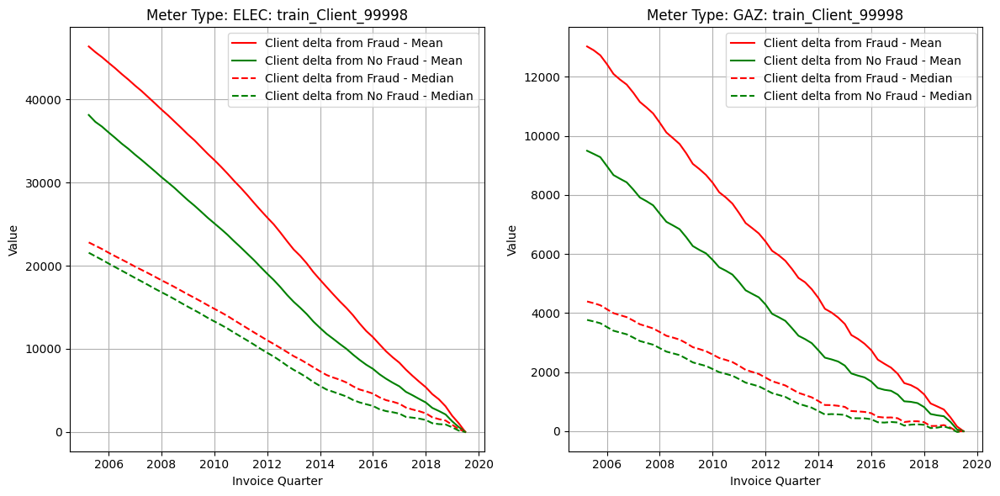

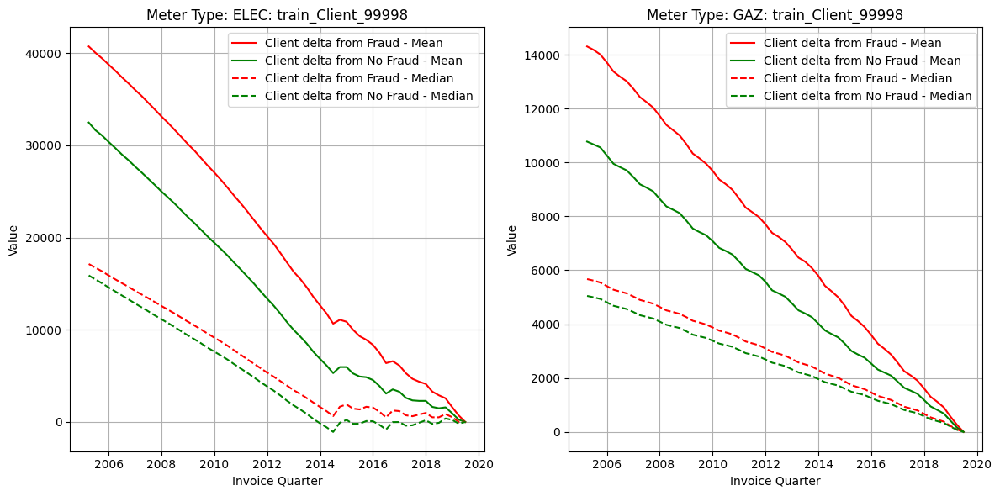

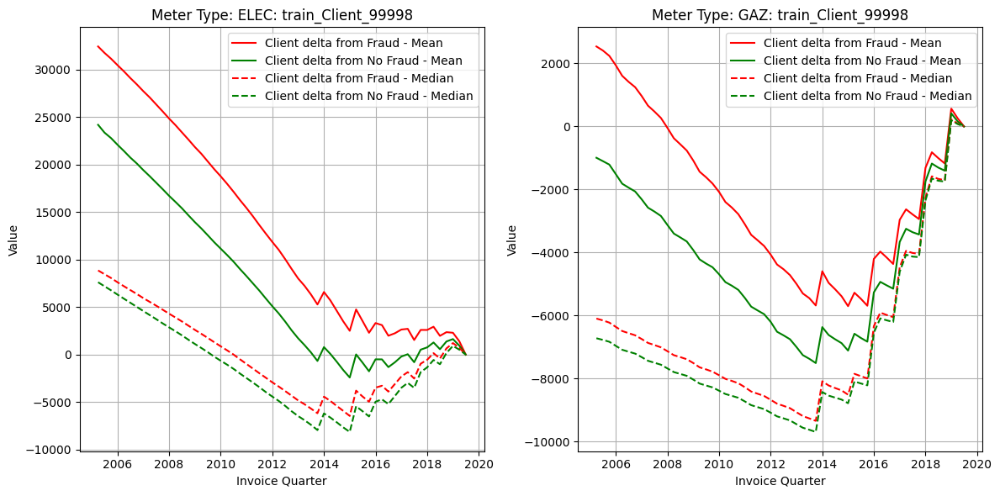

In [110]:
for client_ex in df_train.query('(fraud == False)').sample(n=5)['client_id']: # 5 random non-fraud cases
    Plot_usagemetric(df_usage[df_usage['client_id'] == client_ex])

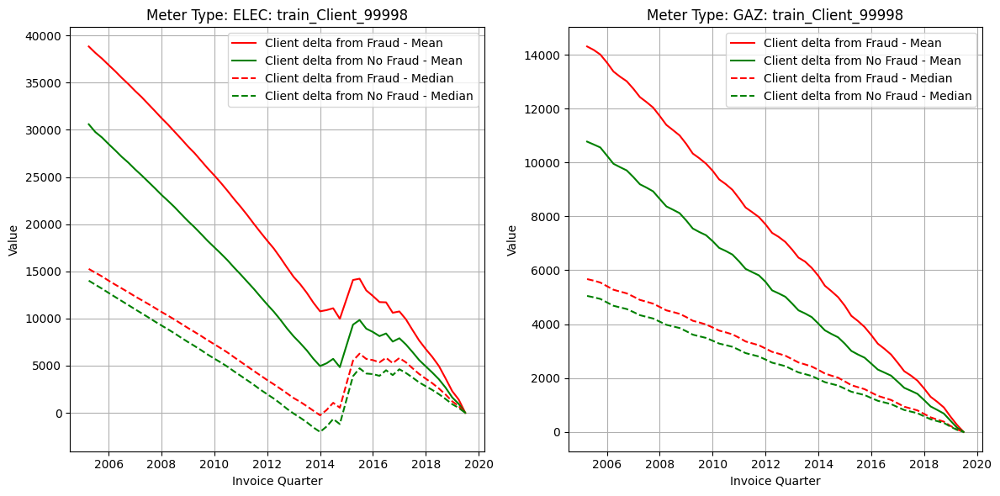

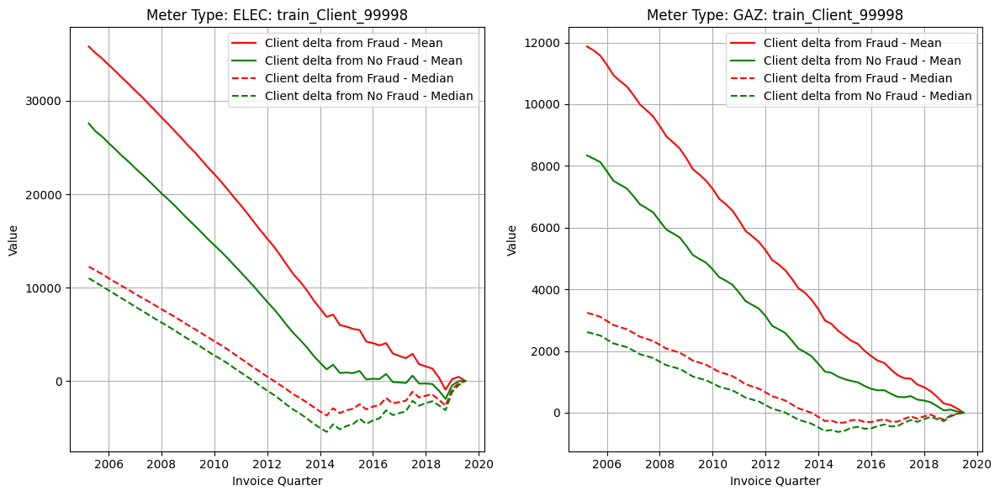

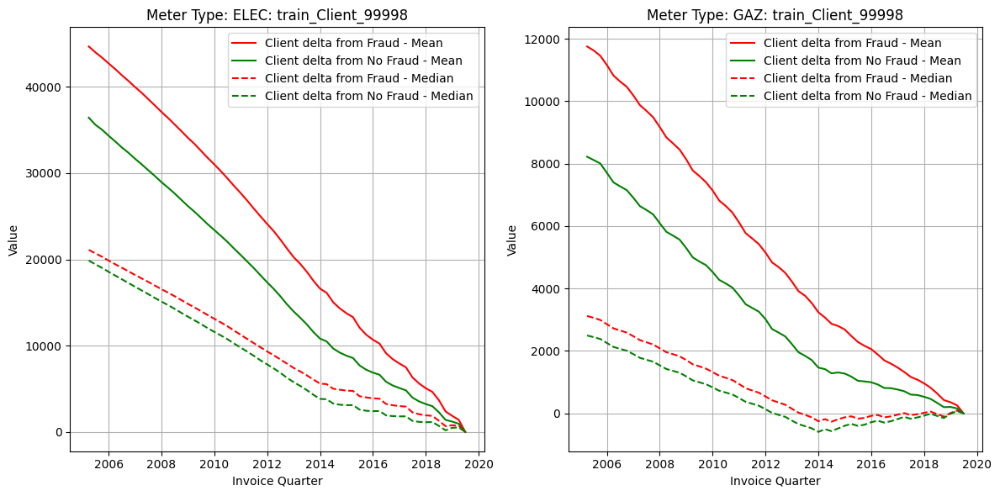

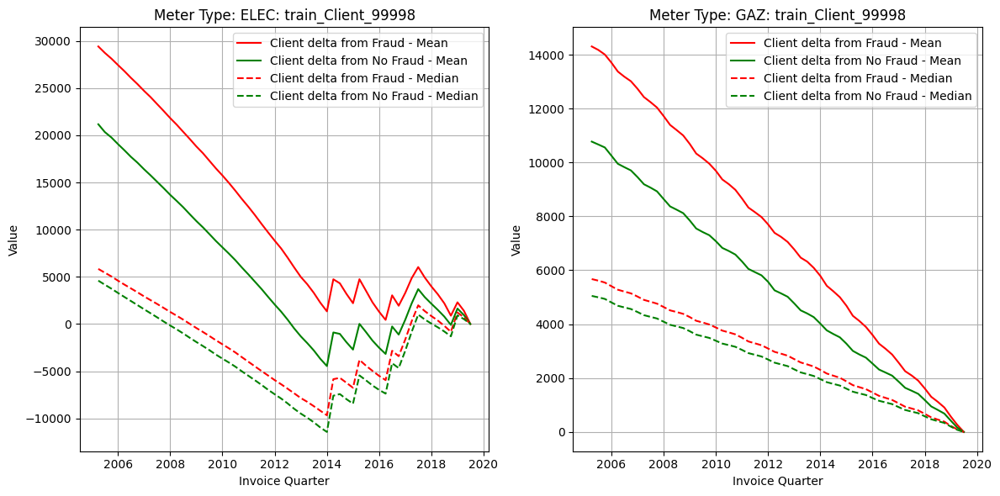

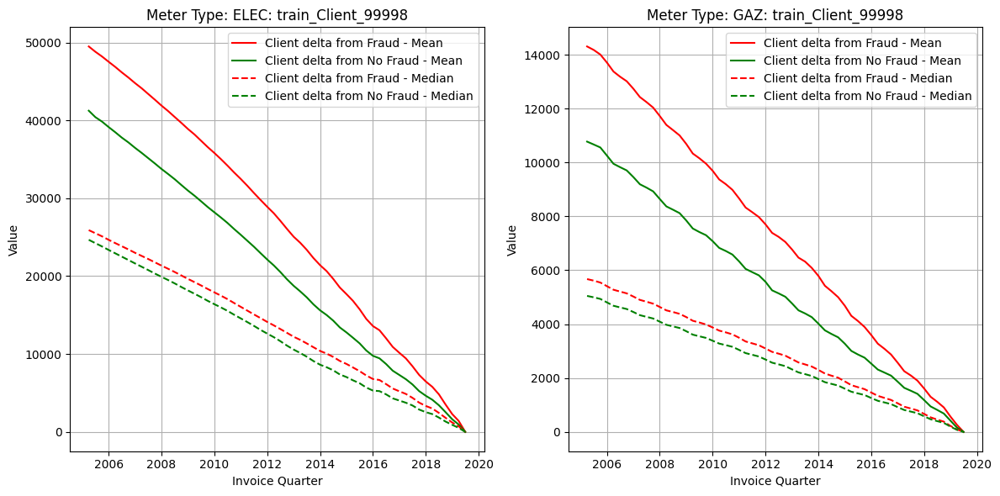

In [111]:
for client_ex in df_train.query('(fraud == True)').sample(n=5)['client_id']: # 5 random fraud cases
    Plot_usagemetric(df_usage[df_usage['client_id'] == client_ex])

Still cannot see a clear distinction, and it feels like there is a lot of redundancy in these four lines. But will proceed for now.

Looking to transform the data. Moving invoice_quarter to columns now that they're fixed length. There'll be two sets, one for each mtr_type. This will mean there will be only one row for a client_id.

In [138]:
df_usage

client_id mtr_type invoice_quarter  fraud_usage_mean_sum  \
0             train_Client_0     ELEC      2005-04-01          48522.305968   
1             train_Client_0     ELEC      2005-07-01          47843.281293   
2             train_Client_0     ELEC      2005-10-01          47234.862589   
3             train_Client_0     ELEC      2006-01-01          46553.616963   
4             train_Client_0     ELEC      2006-04-01          45905.259111   
...                      ...      ...             ...                   ...   
14868063  train_Client_99998      GAZ      2018-07-01           1119.010153   
14868064  train_Client_99998      GAZ      2018-10-01            909.046956   
14868065  train_Client_99998      GAZ      2019-01-01            566.819099   
14868066  train_Client_99998      GAZ      2019-04-01            260.343619   
14868067  train_Client_99998      GAZ      2019-07-01              0.000000   

          fraud_usage_median_sum  nofrd_usage_mean_sum  nofrd_usage_median_sum  
0                        24940.5          40274.031651                 23697.0  
1                        24543.5          39449.521972                 23270.0  
2                        24146.5          38874.882938                 22848.0  
3                        23695.5          38171.950363                 22396.0  
4                        23280.5          37519.077356                 21969.0  
...                          ...                   ...                     ...  
14868063                   459.0            817.850381                   401.0  
14868064                   382.0            681.615613                   335.0  
14868065                   222.0            415.387123                   196.0  
14868066                    93.0            160.410000                    77.0  
14868067                     0.0              0.000000                     0.0  

[14868068 rows x 7 columns]

In [139]:
df_temp = df_usage.copy()
df_temp['invoice_quarter'] = df_temp.groupby(['client_id', 'mtr_type'])['invoice_quarter'].transform('cumcount')

In [140]:
df_temp

client_id mtr_type  invoice_quarter  fraud_usage_mean_sum  \
0             train_Client_0     ELEC                0          48522.305968   
1             train_Client_0     ELEC                1          47843.281293   
2             train_Client_0     ELEC                2          47234.862589   
3             train_Client_0     ELEC                3          46553.616963   
4             train_Client_0     ELEC                4          45905.259111   
...                      ...      ...              ...                   ...   
14868063  train_Client_99998      GAZ               53           1119.010153   
14868064  train_Client_99998      GAZ               54            909.046956   
14868065  train_Client_99998      GAZ               55            566.819099   
14868066  train_Client_99998      GAZ               56            260.343619   
14868067  train_Client_99998      GAZ               57              0.000000   

          fraud_usage_median_sum  nofrd_usage_mean_sum  nofrd_usage_median_sum  
0                        24940.5          40274.031651                 23697.0  
1                        24543.5          39449.521972                 23270.0  
2                        24146.5          38874.882938                 22848.0  
3                        23695.5          38171.950363                 22396.0  
4                        23280.5          37519.077356                 21969.0  
...                          ...                   ...                     ...  
14868063                   459.0            817.850381                   401.0  
14868064                   382.0            681.615613                   335.0  
14868065                   222.0            415.387123                   196.0  
14868066                    93.0            160.410000                    77.0  
14868067                     0.0              0.000000                     0.0  

[14868068 rows x 7 columns]

In [141]:
df_temp = df_temp.pivot(
    index=['client_id'],  # Columns to keep as the index
    columns=['mtr_type', 'invoice_quarter'],       # Column to pivot
    values=['fraud_usage_mean_sum', 'fraud_usage_median_sum', 'nofrd_usage_mean_sum', 'nofrd_usage_median_sum']   # Values to spread across columns
)
df_temp

fraud_usage_mean_sum                              \
mtr_type                           ELEC                               
invoice_quarter                      0             1             2    
client_id                                                             
train_Client_0             48522.305968  47843.281293  47234.862589   
train_Client_1             43659.305968  42980.281293  42371.862589   
train_Client_10            44810.305968  44131.281293  43522.862589   
train_Client_100           51275.305968  50596.281293  49987.862589   
train_Client_1000          38381.305968  37702.281293  37093.862589   
...                                 ...           ...           ...   
train_Client_99994         51252.305968  50582.281293  49973.862589   
train_Client_99995         51298.305968  50619.281293  50010.862589   
train_Client_99996         45311.305968  44632.281293  44023.862589   
train_Client_99997         44777.305968  44098.281293  43489.862589   
train_Client_99998         50557.305968  50413.281293  50010.862589   

                                                                            \
mtr_type                                                                     
invoice_quarter               3             4             5             6    
client_id                                                                    
train_Client_0      46553.616963  45905.259111  45198.532067  44531.727785   
train_Client_1      41690.616963  41042.259111  40335.532067  39668.727785   
train_Client_10     42841.616963  42193.259111  41486.532067  40819.727785   
train_Client_100    49306.616963  48658.259111  47951.532067  47284.727785   
train_Client_1000   36412.616963  35764.259111  35057.532067  34390.727785   
...                          ...           ...           ...           ...   
train_Client_99994  49292.616963  48651.259111  47944.532067  47277.727785   
train_Client_99995  49329.616963  48681.259111  47974.532067  47307.727785   
train_Client_99996  43342.616963  42694.259111  41987.532067  41320.727785   
train_Client_99997  42808.616963  42160.259111  41453.532067  40786.727785   
train_Client_99998  49329.616963  48681.259111  47974.532067  47307.727785   

                                                             ...  \
mtr_type                                                     ...   
invoice_quarter               7             8            9   ...   
client_id                                                    ...   
train_Client_0      43813.674382  43160.639583  42427.62305  ...   
train_Client_1      38950.674382  38297.639583  37564.62305  ...   
train_Client_10     40101.674382  39448.639583  38715.62305  ...   
train_Client_100    46566.674382  45913.639583  45180.62305  ...   
train_Client_1000   33672.674382  33019.639583  32286.62305  ...   
...                          ...           ...          ...  ...   
train_Client_99994  46559.674382  45936.639583  45203.62305  ...   
train_Client_99995  46589.674382  45936.639583  45203.62305  ...   
train_Client_99996  40602.674382  39949.639583  39216.62305  ...   
train_Client_99997  40068.674382  39415.639583  38682.62305  ...   
train_Client_99998  46589.674382  45936.639583  45203.62305  ...   

                   nofrd_usage_median_sum                                     \
mtr_type                              GAZ                                      
invoice_quarter                        48     49     50     51     52     53   
client_id                                                                      
train_Client_0                      815.0  755.0  696.0  580.0  470.0  401.0   
train_Client_1                      815.0  755.0  696.0  580.0  470.0  401.0   
train_Client_10                     815.0  755.0  696.0  580.0  470.0  401.0   
train_Client_100                    815.0  755.0  696.0  580.0  470.0  401.0   
train_Client_1000                   815.0  755.0  696.0  580.0  470.0  401.0   
...                                   ...

In [116]:
df_temp['fraud'] = df_train.groupby(['client_id'], observed=True)['fraud'].agg('first')
df_temp = df_temp.fillna(0)

Going to have a quick look at what a classifier thinks. Will use delta of mean | median vs agg_fraud and agg_not_fraud. Will leave empty quarters in this simple case, and use a model that can tolerate empty values. Will have a count of 'mtr_id', keep district, region, and client_type. There is of course a lot more to look at also.

In [264]:
temp.head()

,mtr_notes_8,mtr_notes_9,mtr_status_1,mtr_status_5,mtr_type_ELEC,mtr_type_GAZ,district_region_60101,district_region_60199,district_region_62301,district_region_62302,...,district_region_63399,district_region_69103,district_region_69104,district_region_69105,district_region_69106,district_region_69107,district_region_69206,client_type_12,client_type_51,fraud
client_id,,,,,,,,,,,,,,,,,,,,,
train_Client_0,0.500000,0.500000,0.0,0.0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,False
train_Client_1,0.153846,0.846154,0.0,0.0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,False
train_Client_10,0.500000,0.500000,0.0,0.0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,False
train_Client_100,0.000000,0.071429,0.0,0.0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,False
train_Client_1000,0.142857,0.857143,0.0,0.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,False


In [280]:
temp = temp[['mtr_notes_8', 'mtr_notes_9', 
             'mtr_status_1', 'mtr_status_5', 
             'mtr_type_ELEC', 'mtr_type_GAZ', 
             'district_region_60101', 'district_region_62301', 'district_region_62302', 
             'district_region_62303', 'district_region_62304', 'district_region_62305', 'district_region_62307',
             'district_region_62309', 'district_region_62310', 'district_region_62371', 'district_region_63101',  
             'district_region_63306', 'district_region_63308', 'district_region_63311', 'district_region_63312', 
             'district_region_63313', 'district_region_63372', 'district_region_63379', 'district_region_69103', 
             'district_region_69104', 'district_region_69105', 'district_region_69106', 'district_region_69107', 
             'client_type_12', 'client_type_51', 'fraud']]  
# 'district_region_60199' 'district_region_62308', 'district_region_62399', 'district_region_63305', 'district_region_63399', 'district_region_69206',  

In [284]:
from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(df_temp.iloc[:,0:126], df_temp['fraud'], test_size=0.20, random_state=42, stratify=df_temp['fraud']) # Skip start_date for now
#X_train, X_test, y_train, y_test = train_test_split(df_temp.iloc[:,84:126], df_temp['fraud'], test_size=0.20, random_state=42, stratify=df_temp['fraud']) # Skip start_date for now

X_train, X_test, y_train, y_test = train_test_split(temp.iloc[:,0:31], temp['fraud'], test_size=0.20, random_state=42, stratify=temp['fraud']) # Skip start_date for now

In [285]:
X_train.head()

,mtr_notes_8,mtr_notes_9,mtr_status_1,mtr_status_5,mtr_type_ELEC,mtr_type_GAZ,district_region_60101,district_region_62301,district_region_62302,district_region_62303,...,district_region_63313,district_region_63372,district_region_63379,district_region_69103,district_region_69104,district_region_69105,district_region_69106,district_region_69107,client_type_12,client_type_51
client_id,,,,,,,,,,,,,,,,,,,,,
train_Client_37910,0.083333,0.916667,0.0,0.0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
train_Client_6521,0.000000,1.000000,0.0,0.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train_Client_43836,0.400000,0.566667,0.0,0.0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train_Client_38373,0.083333,0.916667,0.0,0.0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train_Client_97457,0.400000,0.600000,0.0,0.0,1,1,0,0,0,2,...,0,0,0,0,0,0,0,0,0,0


In [186]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay

In [286]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_train, y_train)

In [287]:
from sklearn.ensemble import GradientBoostingClassifier

clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
    max_depth=1, random_state=0).fit(X_train_SMOTE, y_train_SMOTE)

In [288]:
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7790910864053052


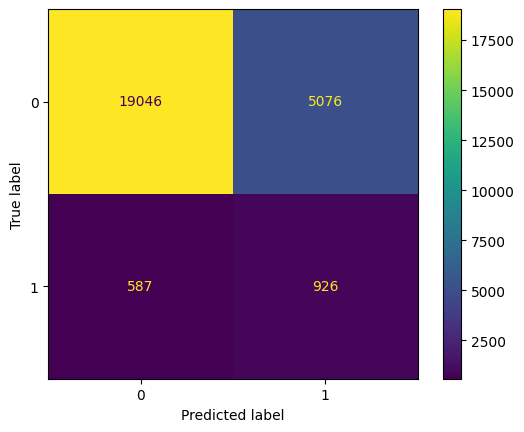

In [289]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay(confusion_matrix=cm).plot()

In [290]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train_SMOTE, y_train_SMOTE)

RandomForestClassifier()

In [291]:
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8740784084259801


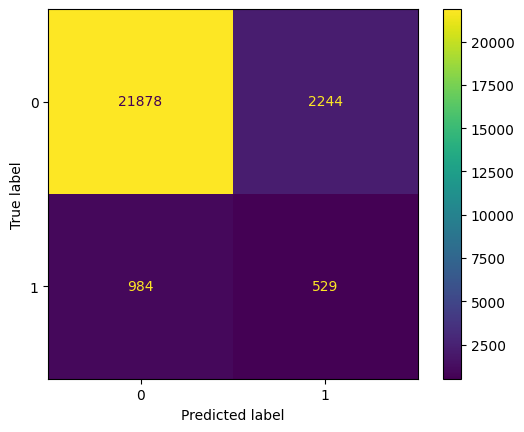

In [292]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay(confusion_matrix=cm).plot()

In [293]:
from sklearn.inspection import permutation_importance
feature_names = X_test.columns
result = permutation_importance(
    rf, X_train_SMOTE, y_train_SMOTE, n_repeats=5, random_state=42, n_jobs=2
)

forest_importances = pd.Series(result.importances_mean, index=feature_names)

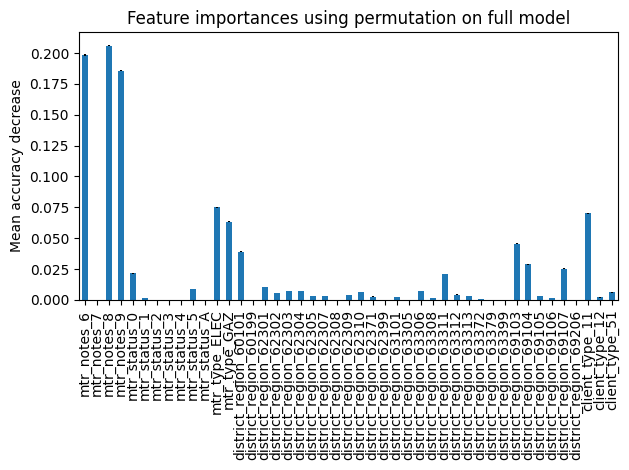

In [260]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

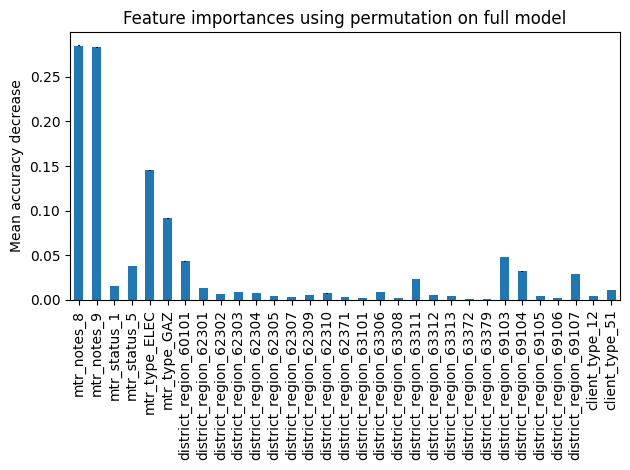

In [295]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [ ]:
region  district
101     60          982205
311     63          507803
104     69          398909
301     62          314274
107     69          302413
103     69          293651
303     62          196934
306     63          194274
310     62          164877
312     63          156171
304     62          145478
302     62          143111
309     62          128330
305     62           93659
307     62           85167
101     63           78917
313     63           76900
105     69           52828
371     62           52802
308     63           28416
106     69           24003
372     63           16950
379     63           13192
399     63            1457
206     69            1004
308     62             221
305     63              11
399     62               5
199     60               2
Name: count, dtype: int64

In [1]:
df_temp.head()

NameError: name 'df_temp' is not defined

In [ ]:
df_full['quantity_mean'] = df_full['quantity_mean'].interpolate(method='linear')
df_full['quantity_median'] = df_full['quantity_median'].interpolate(method='linear')

,mtr_type,fraud,invoice_quarter,mean,P05,Q1,median,Q3,P95,std
0,ELEC,False,2005-04-01,752.268437,0.0,27.25,301.0,643.00,3254.00,1807.132107
1,ELEC,False,2005-07-01,824.509679,0.0,189.00,427.0,750.00,2716.40,2134.898277
2,ELEC,False,2005-10-01,574.639034,0.0,214.00,422.0,666.00,1512.45,1001.286780
3,ELEC,False,2006-01-01,702.932575,0.0,213.00,452.0,768.00,1987.95,1439.583668
4,ELEC,False,2006-04-01,652.873007,0.0,214.00,427.0,711.00,1871.00,1306.652474
...,...,...,...,...,...,...,...,...,...,...
227,GAZ,True,2018-07-01,184.932931,0.0,26.00,82.0,144.00,786.30,435.205640
228,GAZ,True,2018-10-01,209.963197,0.0,24.00,77.0,137.50,693.00,704.397978
229,GAZ,True,2019-01-01,342.227857,0.0,61.75,160.0,339.00,1214.35,786.203848
230,GAZ,True,2019-04-01,306.475480,0.0,50.00,129.0,284.00,1294.60,594.506874


In [210]:
df_temp.columns = [f"{stat}_{mtr_type}_{quarter}" for stat, mtr_type, quarter in df_temp.columns]
df_temp = df_temp.reset_index()
df_temp = df_temp.merge(df_train.groupby(['client_id'], observed=False).agg({'district' : 'first', 'region' : 'first', 'client_type' : 'first', 'start_date' : 'first', 'mtr_type' : 'nunique', 'fraud' : 'first'}), on='client_id', how='left')


In [ ]:
fig, ax = plt.subplots()

mask = (temp['mtr_type'] == 'ELEC') & (temp['fraud'] == True)
stats = [
    dict(med=temp[mask]['median'].iloc[0], q1=temp[mask]['Q1'].iloc[0], q3=temp[mask]['Q3'].iloc[0], whislo=temp[mask]['P05'].iloc[0], whishi=temp['P95'].iloc[0], fliers=[], label='2005Q2'),
    dict(med=temp[mask]['median'].iloc[1], q1=temp[mask]['Q1'].iloc[1], q3=temp[mask]['Q3'].iloc[1], whislo=temp[mask]['P05'].iloc[1], whishi=temp['P95'].iloc[1], fliers=[], label='2005Q3'),
    dict(med=temp[mask]['median'].iloc[2], q1=temp[mask]['Q1'].iloc[2], q3=temp[mask]['Q3'].iloc[2], whislo=temp[mask]['P05'].iloc[2], whishi=temp['P95'].iloc[2], fliers=[], label='2005Q4'),
]

ax.bxp(stats, patch_artist=True, boxprops={'facecolor': 'bisque'})

plt.show()

In [ ]:
temp.boxplot(column='median', by='invoice_quarter', grid=False, showmeans=True)
#plt.xlim(0, 50000)

In [ ]:
plt.figure(figsize=(10, 6))

mask = (temp['mtr_type'] == 'ELEC') & (temp['fraud'] == False)
sns.lineplot(x=temp[mask]['invoice_quarter'].astype(str), y=temp[mask]['mean'])

mask = (temp['mtr_type'] == 'ELEC') & (temp['fraud'] == True)
sns.lineplot(x=temp[mask]['invoice_quarter'].astype(str), y=temp[mask]['mean'])

#
# Customize the plot
#plt.title("Usage over Time for Selected Groups Flagged Fraud")
#plt.xlabel("Invoice Quarter")
#plt.ylabel("Usage (usage_n)")
#plt.legend(title="Groups")
#plt.xticks(rotation=45)
#plt.tight_layout()

#plt.show()

In [ ]:
df_train['invoice_quarter'] = df_train['invoice_date'].dt.to_period('Q')

col_names = ['client_id', 'mtr_id', 'mtr_tariff']
df_train.groupby(col_names+['invoice_quarter'])['usage_n'].agg(['first', 'sum']).reset_index()
#summary_stats = df_train.groupby(['client_id', 'quarter'])['quantity'].agg(['mean', 'median']).reset_index()
#
# Optional: Rename the columns for clarity
#summary_stats.columns = ['client_id', 'quarter', 'quantity_mean', 'quantity_median']
#
# Display the result
#print(summary_stats)

In [ ]:
col_names = ['client_id', 'mtr_id', 'mtr_tariff']
mask = df_train[df_train['fraud'] == 1][col_names].value_counts().reset_index(name='group_size')
mask = mask.nlargest(10, 'group_size')
df_temp = df_train.merge(mask[col_names], on=col_names)

plt.figure(figsize=(10, 6))

# Iterate through each of the top groups
for _, group in mask.iterrows():
    grp_mask = (df_temp[col_names] == group[col_names].values).all(axis=1)
    grp_data = df_temp[grp_mask]
    # Plot the line for each group
    sns.lineplot(x='invoice_date', y='usage_n', data=grp_data, label=f"Group {group[col_names].values}")

# Customize the plot
plt.title("Usage over Time for Selected Groups Flagged Fraud")
plt.xlabel("Invoice Date")
plt.ylabel("Usage (usage_n)")
plt.legend(title="Groups")
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
col_names = ['client_id', 'mtr_id', 'mtr_tariff']
mask = df_train[df_train['fraud'] == 0][col_names].value_counts().reset_index(name='group_size')
mask = mask.nlargest(10, 'group_size')
df_temp = df_train.merge(mask[col_names], on=col_names)

plt.figure(figsize=(10, 6))

# Iterate through each of the top groups
for _, group in mask.iterrows():
    grp_mask = (df_temp[col_names] == group[col_names].values).all(axis=1)
    grp_data = df_temp[grp_mask]
    # Plot the line for each group
    sns.lineplot(x='invoice_date', y='usage_n', data=grp_data, label=f"Group {group[col_names].values}")

# Customize the plot
plt.title("Usage over Time for Selected Groups not Flagged Fraud")
plt.xlabel("Invoice Date")
plt.ylabel("Usage (usage_n)")
plt.legend(title="Groups")
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
df_temp = df_train[['mtr_tariff', 'mtr_code']].value_counts().reset_index()
df_temp = df_temp.pivot(index='mtr_tariff', columns='mtr_code', values='count').fillna(0)

plt.figure(figsize=(10, 8))
sns.heatmap(df_temp, cmap='viridis', annot=True, fmt='.0f')
plt.title("Heatmap of Counts by mtr_tariff and mtr_code")
plt.xlabel("mtr_code")
plt.ylabel("mtr_tariff")
plt.show()
#sns.scatterplot(y=df_train['mtr_code'], x=df_train['mtr_tariff'])

In [ ]:
#col_names = ['mtr_status', 'mtr_code', 'mtr_notes', 'mtr_coef']
contingency_table = pd.crosstab(df_train['mtr_code'], df_train['mtr_tariff'])

sns.heatmap(contingency_table, annot=True, fmt="d", cmap="Blues", cbar=True)
plt.title("Relationship Between mtr_code and mtr_tariff")
plt.xlabel("Category2")
plt.ylabel("Category1")
plt.show()

Remaining rows with issues:

In [ ]:
mask = df_train['mtr_val_new_calc'] != df_train['mtr_val_new']
df_temp = df_train[mask]
df_temp

In [ ]:
df_train['mtr_stuck_flag'] = (df_train['mtr_val_new_calc'] != df_train['mtr_val_new']) & (df_temp['mtr_val_old'] == df_temp['mtr_val_new'])
df_train['usage_stuck_flag'] = (df_train['mtr_val_new_calc'] != df_train['mtr_val_new']) & (df_temp['usage_n'] == 0)

About half have meter not updating:

In [ ]:
mask = df_temp['mtr_val_old'] != df_temp['mtr_val_new']
df_temp = df_temp[mask]
df_temp

In [ ]:
mask = df_temp['usage_n'] > 0
df_temp[mask]

Checking if these changes worked: ((Sum of usage) / mtr_coef) == diff(mtr_val_new, mtr_val_old)

In [ ]:
mask = (df_train['mtr_val_new'] - ((df_train[['usage_1', 'usage_2', 'usage_3', 'usage_4']].sum(axis=1) / df_train['mtr_coef']) + df_train['mtr_val_old'])) != 0
df_train[mask][col_names]

In [ ]:
df_temp = df_train[['start_date', 'invoice_date', 'mtr_tariff', 'mtr_id', 'mtr_code']].copy()
df_temp['id_len'] = df_temp['mtr_id'].astype(str).str.len()
df_temp['code_len'] = df_temp['mtr_code'].astype(str).str.len()
df_temp['sum'] = df_temp['mtr_id'] + df_temp['mtr_code']

In [ ]:
df_temp.iloc[:,3]

In [ ]:
df_train['mtr_code'].value_counts()

In [ ]:
df_train[mask][['mtr_coef', 'usage_1']].value_counts().sort_index()

For these, it seems as though 'mtr_coef' was accidently split due to decimal point.

In [ ]:
df_train[df_train['client_id'] == 'train_Client_53725']

rule 1: IF L4: L3 = L1 & L2 = L1/2

In [ ]:
mask_L4 = df_train['usage_4'] > 0
print((mask_L4.sum()))
mask_L4_L3 = df_train['usage_3'][mask_L4] != df_train['usage_1'][mask_L4]
df_train[['client_id', 'mtr_id', 'mtr_code', 'mtr_tariff', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'fraud']][mask_L4][mask_L4_L3]

For these, it seems as through 

In [ ]:
mask_L4_L2 = df_train['usage_2'][mask_L4] * 2 != df_train['usage_1'][mask_L4]
df_train[['client_id', 'mtr_id', 'mtr_code', 'mtr_tariff', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'fraud']][mask_L4][mask_L4_L2]

This rule is broken 102 / 92958 times.

rule 2: IF L3: L2 = L1/2

In [ ]:
mask_L3 = df_train['usage_3'] > 0
print((mask_L3.sum()))
mask_L3_L2 = df_train['usage_2'][mask_L3] * 2 != df_train['usage_1'][mask_L3]
df_train[['client_id', 'mtr_id', 'mtr_code', 'mtr_tariff', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'fraud']][mask_L3][mask_L3_L2]

In [ ]:
df_train['usage_1'][mask_L3][mask_L3_L2].unique()

This rule is broken 422 / 183358

rule 3: IF L2: L1 = L1_Max (% 50 == TRUE)

In [ ]:
mask_L2 = df_train['usage_2'] > 0
print((mask_L2.sum()))
mask_L2_L1 = df_train['usage_1'][mask_L2] % 50 != 0
df_train[['client_id', 'mtr_id', 'mtr_code', 'mtr_tariff', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'fraud']][mask_L2][mask_L2_L1]

In [ ]:
df_train['usage_1'][mask_L2][mask_L2_L1].unique()

This rule is broken 1305 / 660570

Rule 4: IF L2 & L1 < 10: Cannot rely on L1 relationships.

These rules can circumstantially tell us which Ln are being used, and if it is capped. If the expected cap is not yet exceeded, it would not know.
There is some further information based on the tariff_type.  

Rule 5: IF T_T == 10 | 11: L3 & L4 Possible
Rule 6: IF T_T == 10 | 11 | 40 | 45: L2 Possible
Else: Only L1 Possible

In [ ]:
print((mask_L2.sum()))
df_train[['client_id', 'mtr_id', 'mtr_code', 'mtr_tariff', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'fraud']][mask_L2 & ~(df_train['mtr_tariff'].isin([10, 11, 40, 45]))]

In [ ]:
print((mask_L3.sum()))
df_train[['client_id', 'mtr_id', 'mtr_code', 'mtr_tariff', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'fraud']][mask_L3 & ~(df_train['mtr_tariff'].isin([10, 11]))]

In [ ]:
(df_train['usage_3'][mask_L4] < 100).sum()

There remains: "mtr_code", "mtr_status", "mtr_notes" and "mtr_coef" to understand.

mtr_code does not seem to give anything extra on this topic beyond tariff_type. 
mtr_coef is said to be added when standard consumption is exceeded, however, it is very very rarely used.
It is also difficult to determine the logic in its application.

In [ ]:
contingency_table = pd.crosstab(df_train['mtr_code'], df_train['mtr_tariff'])

sns.heatmap(contingency_table, annot=True, fmt="d", cmap="Blues", cbar=True)
plt.title("Relationship Between mtr_code and mtr_tariff")
plt.xlabel("Category2")
plt.ylabel("Category1")
plt.show()

In [ ]:
sns.scatterplot(x=df_train['mtr_code'], y=df_train['mtr_tariff'])

There is clearly a link between tariff_type and mtr_code. But I cannot understand it programmatically.

In [ ]:
df_train[df_train['mtr_tariff'] == 45].boxplot(column='usage_1', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.ylim(4, 9)
plt.xlim(0, 50000)

In [ ]:
df_train[df_train['mtr_tariff'] == 45].boxplot(column='usage_2', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.ylim(4, 9)

In [ ]:
contingency_table

In [ ]:
print(df_train['mtr_tariff'].nunique())
print(df_train['mtr_code'].nunique())

In [ ]:
df_train[['mtr_tariff', 'mtr_code']].value_counts()

In [ ]:
df_temp = df_train.groupby(['mtr_coef','fraud']).agg({'client_id': 'nunique'})

df_temp = df_temp.reset_index().pivot(index='mtr_coef', columns='fraud', values='client_id').fillna(0)

df_temp.index = df_temp.index.astype(str)

# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(df_temp.index, df_temp[1], label='Fraud = 1', color = "red")
plt.bar(df_temp.index, df_temp[0], bottom=df_temp[1], label='Fraud = 0', color = "lightgreen")
plt.legend()
plt.ylim(0, 25)

In [ ]:
df_temp = df_train.groupby(['mtr_coef','fraud']).agg({'client_id': 'nunique'})

df_temp = df_temp.reset_index().pivot(index='mtr_coef', columns='fraud', values='client_id').fillna(0)

df_temp.index = df_temp.index.astype(str)

# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(df_temp.index, 100*df_temp[1]/(df_temp[0] + df_temp[1]), label='Fraud = 1', color = "red")
plt.bar(df_temp.index, 100*df_temp[0]/(df_temp[0] + df_temp[1]), bottom=100*df_temp[1]/(df_temp[0] + df_temp[1]), label='Fraud = 0', color = "lightgreen")
plt.legend()
plt.ylim(0, 100)

In [ ]:
df_temp.sum()

Hard to know what to do with this. This will pretty much assume mtr_coef > 1 == No Fraud with only 2 / 1646 breaking this rule.
135,459 / 143,028 are mtr_coef = 1; there is not enough data on the others to know conclude anything, even if proportionally they seem significant.
(Going to condense to 0 | 1 | Other. Do this later.)

In [ ]:
df_temp = df_train.groupby(['mtr_notes','fraud']).agg({'client_id': 'nunique'})

df_temp = df_temp.reset_index().pivot(index='mtr_notes', columns='fraud', values='client_id').fillna(0)

df_temp.index = df_temp.index.astype(str)

# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(df_temp.index, df_temp[1], label='Fraud = 1', color = "red")
plt.bar(df_temp.index, df_temp[0], bottom=df_temp[1], label='Fraud = 0', color = "lightgreen")

plt.legend()
plt.ylim(0, 50)

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(df_temp.index, 100*df_temp[1]/(df_temp[0] + df_temp[1]), label='Fraud = 1', color = "red")
plt.bar(df_temp.index, 100*df_temp[0]/(df_temp[0] + df_temp[1]), bottom=100*df_temp[1]/(df_temp[0] + df_temp[1]), label='Fraud = 0', color = "lightgreen")

plt.legend()
plt.ylim(0, 100)

Looking at mtr_notes: there is not enough of 5 | 203 | 207 | 413 to conclude anything. However, 6 | 7 | 8 | 9 do seem relevant. From these, 7 seems quite different to the other three.
(Going to condense to 6 | 7 | 8 | 9 | Other. Do this later.)

In [ ]:
df_temp = df_train[df_train['mtr_notes'].isin([6, 7, 8, 9])]
df_temp = df_temp[df_temp['mtr_coef'].isin([0, 1, 5, 10])]
df_temp['mtr_notes'] = df_temp['mtr_notes'].astype(int)
df_temp['mtr_coef'] = df_temp['mtr_coef'].astype(int)

In [ ]:
df_temp.groupby(['mtr_coef', 'mtr_notes','fraud']).agg({'client_id': 'nunique'})

Quick check to see no interlink between coef and notes: does not seem to be.

In [ ]:
df_temp = df_train.groupby(['mtr_status','fraud']).agg({'client_id': 'nunique'})

df_temp = df_temp.reset_index().pivot(index='mtr_status', columns='fraud', values='client_id').fillna(0)

df_temp.index = df_temp.index.astype(str)

# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(df_temp.index, df_temp[1], label='Fraud = 1', color = "red")
plt.bar(df_temp.index, df_temp[0], bottom=df_temp[1], label='Fraud = 0', color = "lightgreen")

plt.legend()
plt.ylim(0, 5000)

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(df_temp.index, 100*df_temp[1]/(df_temp[0] + df_temp[1]), label='Fraud = 1', color = "red")
plt.bar(df_temp.index, 100*df_temp[0]/(df_temp[0] + df_temp[1]), bottom=100*df_temp[1]/(df_temp[0] + df_temp[1]), label='Fraud = 0', color = "lightgreen")

plt.legend()
plt.ylim(0, 100)

In [ ]:
df_temp = df_train[df_train['mtr_notes'].isin([6, 7, 8, 9])]
df_temp['mtr_status'] = df_temp['mtr_status'].astype(str)
df_temp = df_temp[df_temp['mtr_status'].isin(['0', '1', '2', '3', '4', '5'])]
df_temp['mtr_notes'] = df_temp['mtr_notes'].astype(int)

df_temp = df_temp[['client_id', 'mtr_id', 'fraud','mtr_notes', 'mtr_status']]

Getting summed energy usage per row shows quite clearly the intended interpretation of mtr_val_old and mtr_val_new. 

In [ ]:
df_train['usage_n'] = df_train[['usage_1', 'usage_2', 'usage_3', 'usage_4']].sum(axis=1) / df_train['mtr_coef'].astype(int)

In [ ]:
df_train[((df_train['mtr_val_new'] - df_train['mtr_val_old']) - df_train['usage_n']) != 0]

In the cases where it is not true, what do we see?

In [ ]:
df_temp = df_train[((df_train['mtr_val_new'] - df_train['mtr_val_old']) - df_train['usage_n']) != 0]
len(df_temp)

One edge case is max digit roll-over: 

In [ ]:
df_temp[(df_temp['mtr_val_old'] > 900000) & (df_temp['mtr_val_new'] < 50000)]

In [ ]:
mask = ((df_temp['mtr_val_old'] > 900000) & (df_temp['mtr_val_new'] < 50000))
((df_temp['mtr_val_old'][mask] + df_temp['usage_n'][mask]) - (df_temp['mtr_val_new'][mask] + 1000000))

Seems like there is data corruption here. I do not know for certain, but it seems like a data entry issue when mtr_coef had a decimal. For example: 1.3 became 1 and 3. With the 3 offsetting the rest of the data.

In [ ]:
col_names = ['mtr_coef', 'usage_1', 'usage_2', 'usage_3', 'usage_4', 'mtr_val_old', 'mtr_val_new', 'months_num', 'usage_n']
mask = (df_temp['usage_1'] < 10) & (df_temp['usage_2'] > 0) 
df_temp[col_names][mask]

In [ ]:
mask_2 = abs(df_temp['months_num'][mask] - (((df_temp[['usage_2', 'usage_3', 'usage_4', 'mtr_val_old']][mask].sum(axis=1)) / (df_temp['mtr_coef'][mask].astype(int) + (df_temp['usage_1'][mask] / 10))) + df_temp['mtr_val_new'][mask])) > 1

In [ ]:
df_temp[['mtr_tariff', 'mtr_id', 'mtr_status', 'mtr_code', 'mtr_notes']+col_names][mask][mask_2]

Look at the roll over again for this subset

In [ ]:
mask_3 = ((df_temp['mtr_val_new'][mask][mask_2] > 60000) & (df_temp['months_num'][mask][mask_2] < 50000))
#((df_temp['mtr_val_old'][mask] + df_temp['usage_n'][mask]) - (df_temp['mtr_val_new'][mask] + 1000000))
df_temp[['mtr_tariff', 'mtr_id', 'mtr_status', 'mtr_code', 'mtr_notes']+col_names][mask][mask_2][mask_3]

In [ ]:
df_train['mtr_coef'].value_counts()

In [ ]:
df_train['mtr_notes'].value_counts()

Going to assume 6-9 are intended to be here. The rest are perhaps from code which has many more 203, 413, 207, and 5. Code is 0 33 times, these values sum to 34.

In [ ]:
df_train['mtr_code'].value_counts()

In [ ]:
df_train[df_train['mtr_code'] == 0][['client_id', 'mtr_tariff', 'mtr_id', 'mtr_status', 'mtr_code', 'mtr_notes']+col_names]

In [ ]:
df_pivot = df_temp.groupby(['mtr_notes','mtr_status','fraud']).agg({'client_id': 'nunique'})

df_pivot = df_pivot.reset_index()
df_pivot = df_pivot.pivot(index=['mtr_notes', 'mtr_status'], columns='fraud', values='client_id').fillna(0)

df_pivot

# Rename columns for clarity (Fraud = 0 and Fraud = 1)
df_pivot.columns = ['Not_Fraud', 'Fraud']

# Calculate proportions
df_pivot['Fraud_Proportion'] = df_pivot['Fraud'] / (df_pivot['Fraud'] + df_pivot['Not_Fraud']) * 100
df_pivot['Not_Fraud_Proportion'] = df_pivot['Not_Fraud'] / (df_pivot['Fraud'] + df_pivot['Not_Fraud']) * 100

# Reset index to make it easier to read or plot
df_pivot.reset_index(inplace=True)

df_pivot


There are differences in the proportions when considering notes and status.

Looking at a client record set would look like

In [ ]:
df_temp = df_train[df_train['client_id'] == "train_Client_1"]
df_temp = df_temp.sort_values(by='invoice_date') 

In [ ]:
df_temp

Trying to understand months_num

In [ ]:
pd.concat([df_temp['invoice_date'].diff(), df_temp['months_num']*30, df_temp['invoice_date'].diff(periods=-1)], axis=1)

In [ ]:
df_train['months_num'].value_counts().head(60)

There is seemingly a link between old_idx | new_idx and in places months_num. Sometimes, like a linked list. Not sure what to do with these for now. Temporarily will ignore.
I am worried these are an unreliable features and artifacts of how the data was retrieved.

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train.boxplot(column='old_idx', by='fraud', grid=False, showmeans=True, vert = False)
plt.xlim(0, 100000)

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train.boxplot(column='new_idx', by='fraud', grid=False, showmeans=True, vert = False)
plt.xlim(0, 100000)

In [ ]:
df_temp = pd.concat([df_train['new_idx'] - df_train['old_idx'], df_train['fraud']], axis=1)

In [ ]:
df_temp

In [ ]:
df_temp.boxplot(by = 'fraud')

In [ ]:
print(df_train['client_id'].nunique())
print(df_train['invoice_date'].min())
print(df_train['invoice_date'].max())

135.5k Clients between 1977 - 2020.

Might be useful to have a measure of normalised usage

It seems as though the usage is more dependent on the months_num that the difference in invoice date. This is an issue because, months_num seems inconsistent

In [ ]:
#df_temp = df_train[(df_train['client_id'] == "train_Client_135089") & (df_train['mtr_id'] == 205552)] # train_Client_123007
df_temp = df_train[(df_train['client_id'] == "train_Client_130431") & (df_train['mtr_id'] == 521409)] 


df_temp = df_temp.sort_values(by='invoice_date')
len(df_temp)

In [ ]:
df_temp['usage_n'] = df_temp[['usage_1', 'usage_2', 'usage_3', 'usage_4']].sum(axis=1)
df_temp['usage_N'] = df_temp['usage_n'].cumsum()
df_temp['invoice_date_d'] = df_temp['invoice_date'].diff().fillna(pd.Timedelta(seconds=0))
df_temp['usage_n_daily'] = df_temp['usage_n'] / df_temp['invoice_date_d'].dt.days
df_temp['usage_n_mnum'] = df_temp['usage_n'] / (df_temp['months_num'] * 30)
df_temp['m_num'] = df_temp['months_num']

In [ ]:
col_names = ['invoice_date', 'mtr_id', 'mtr_code', 'mtr_tariff', 'old_idx', 'new_idx', 'months_num', 'usage_n', 'usage_N', 'invoice_date_d', 'usage_n_daily', 'usage_n_mnum', 'fraud']
df_temp[col_names]

In [ ]:
# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(df_temp[0], df_temp[1], label='Fraud = 1', color = "red")
#plt.bar(df_temp.index, df_temp[0], bottom=df_temp[1], label='Fraud = 0', color = "lightgreen")

plt.legend()
plt.ylim(0, 5000)

In [ ]:
#df_temp[['mtr_notes', 'mtr_status', 'fraud']].value_counts().sort_index()

(df_temp[df_temp['fraud'] == 0][['mtr_notes', 'mtr_status']].value_counts().sort_index() +
                                                                                           df_temp[df_temp['fraud'] == 1][['mtr_notes', 'mtr_status']].value_counts().sort_index())

In [ ]:
df_train[['fraud', 'mtr_notes']].value_counts()

In [ ]:
df_train.groupby(['client_id', 'mtr_id']).agg({'mtr_coef' : 'nunique', 'fraud' : 'nunique'}).value_counts()

In [ ]:
df_train[['client_id', 'mtr_id', 'mtr_coef']][df_train['mtr_coef'] != 1].value_counts().sort_index().head(60)

In [ ]:
df_train[['usage_1', 'usage_2', 'usage_3', 'usage_4']].describe()

In [ ]:
df_train['months_num']

In [ ]:
print(f"Months Number: Min: {df_train['months_num'].min()}, Max: {df_train['months_num'].max()}", end="")

In [ ]:
df_train['months_num'].value_counts()

In [ ]:
df_train['months_num'][df_train['months_num'] > 12].value_counts()

In [ ]:
plt.pyplot.hist(df_train['months_num'][(df_train['months_num'] > 12) & (df_train['months_num'] < 60)])

In [ ]:
# Testing to see if it is related to count of months they've been customer
((df_train['invoice_date'].dt.year - df_train['creation_date'].dt.year) * 12) + (df_train['invoice_date'].dt.month - df_train['creation_date'].dt.month)

In [ ]:
df_train['months_num']

It's is really unclear what months_num is meant to represent...

It is similarly unclear what "old_idx" and "new_idx" are meant to represent.

In [ ]:
df_train.head()

In [ ]:
col_names = ['mtr_coef', 'usage_lev_1', 'usage_lev_2', 'usage_lev_3', 'usage_lev_4', 'target', 'tariff_type', 'mtr_status']
df_train[col_names].head()

In [ ]:
plt.pyplot.hist(df_train[['usage_lev_1', 'usage_lev_2', 'usage_lev_3', 'usage_lev_4']])

In [ ]:
df_train['mtr_coef'][df_train['mtr_coef'] != 1]

In [ ]:
sum(df_train['usage_lev_4'][df_train['mtr_coef'] != 1])

In [ ]:
col_names = ['mtr_coef', 'usage_lev_1', 'usage_lev_2', 'usage_lev_3', 'usage_lev_4', 'target', 'tariff_type', 'mtr_status', 'mtr_code', 'counter_type']
df_temp = df_train[col_names]
df_temp[(df_temp['usage_lev_2'] > 0) | (df_temp['usage_lev_3'] > 0) | (df_temp['usage_lev_4'] > 0)]

Trying to get a better sense of what the usage levels mean

In [ ]:
df_temp = df_train[(df_train['usage_lev_1'] % 100 == 0)]

In [ ]:
temp = df_temp['usage_lev_1'].value_counts()

In [ ]:
temp[temp > 3]

In [ ]:
df_train['mtr_coef'].value_counts()

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train[df_train['usage_lev_4'] > 0].boxplot(column='usage_lev_4', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 100000)

In [ ]:
df_train[df_train['usage_lev_3'] > 0].boxplot(column='usage_lev_3', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 10000)

In [ ]:
df_train[df_train['usage_lev_2'] > 0].boxplot(column='usage_lev_2', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 50000)

In [ ]:
df_train[df_train['usage_lev_1'] > 0].boxplot(column='usage_lev_1', by='mtr_code', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 50000)

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train[df_train['usage_lev_4'] > 0].boxplot(column='usage_lev_4', by='tariff_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 10000)

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train[df_train['usage_lev_3'] > 0].boxplot(column='usage_lev_3', by='tariff_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 10000)

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train[df_train['usage_lev_2'] > 0].boxplot(column='usage_lev_2', by='tariff_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 10000)

In [ ]:
#plt.pyplot.boxplot(df_train['mtr_code'], df_train['usage_lev_4'])
df_train.boxplot(column='usage_lev_1', by='tariff_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 10000)

In [ ]:
df_train.boxplot(column='mtr_code', by='tariff_type', grid=False, showmeans=True, vert = False)

In [ ]:
df_train[df_train['usage_lev_4'] > 0].boxplot(column='usage_lev_4', by='client_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 100000)

In [ ]:
df_train[df_train['usage_lev_3'] > 0].boxplot(column='usage_lev_3', by='client_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 100000)

In [ ]:
#df_train.boxplot(column='invoice_date', by='target', grid=False, showmeans=True, vert = False)
#pd.to_timedelta(df_train['invoice_date']).dt.total_seconds()
df_temp = df_train[['invoice_date', 'target']]
df_temp['invoice_date'] = (df_temp['invoice_date'] - pd.to_datetime('1980', format='%Y')).dt.total_seconds()
df_temp.boxplot(column='invoice_date', by='target', grid=False, showmeans=True, vert = False)

In [ ]:
df_train[df_train['usage_lev_2'] > 0].boxplot(column='usage_lev_2', by='client_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 100000)

In [ ]:
df_train[['tariff_type', 'client_type']].value_counts()

In [ ]:
df_train[df_train['usage_lev_1'] > 0].boxplot(column='usage_lev_1', by='client_type', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 100000)

In [ ]:
df_train[df_train['tariff_type'] == 10][['tariff_type', 'mtr_code']].value_counts()

In [ ]:
df_train.groupby('target').agg({'invoice_date': ['min', 'max']})

In [ ]:
#df_train.groupby('target').agg({'client_id': ['nunique', 'count']})




pd.merge(df_train['client_id'][df_train['target'] == 1], df_train['client_id'][df_train['target'] == 0], how = 'inner')

In [ ]:
(df_train.groupby('client_id').agg({'target': ['nunique']}) > 1).sum()

In [ ]:
(df_train.groupby('client_id').agg({'creation_date': ['nunique']}) > 1).sum()

In [ ]:
(df_train.groupby('mtr_num').agg({'client_id': ['nunique']}) > 1).sum()

In [ ]:
(df_train.groupby('client_id').agg({'target': ['nunique']}) > 1).sum()

In [ ]:
df_train[['invoice_date', 'creation_date', 'mtr_num','usage_lev_1', 'usage_lev_2', 'usage_lev_3', 'usage_lev_4']][(df_train['client_id'] == 'train_Client_76644') & (df_train['counter_type'] == 'ELEC')].sort_values('invoice_date')

In [ ]:
df_train[['invoice_date', 'creation_date', 'mtr_num','usage_lev_1', 'usage_lev_2', 'usage_lev_3', 'usage_lev_4', 'tariff_type', 'mtr_coef', 'mtr_code', 'reading_remarks']][(df_train['client_id'] == 'train_Client_76644') & (df_train['counter_type'] == 'ELEC') & (df_train['mtr_num'] == 68778)].sort_values('invoice_date').tail(60)

In [ ]:
df_train[df_train['usage_lev_4'] > 0].groupby(['target']).agg({'usage_lev_4': ['count']})

In [ ]:
df_train[df_train['usage_lev_4'] == 0].groupby(['target']).agg({'usage_lev_4': ['count']})

In [ ]:
print(78519/4045118)
print(14439/338673)

In [ ]:
df_train[df_train['usage_lev_1'] > 0].groupby(['target']).agg({'usage_lev_1': ['count']})

In [ ]:
df_train[df_train['usage_lev_1'] == 0].groupby(['target']).agg({'usage_lev_1': ['count']})

In [ ]:
print(3693828/429809)
print(315368/37744)

In [ ]:
df_train[df_train['usage_lev_2'] > 0].groupby(['target']).agg({'usage_lev_2': ['count']})

In [ ]:
df_train[df_train['usage_lev_2'] == 0].groupby(['target']).agg({'usage_lev_2': ['count']})

In [ ]:
print(593658/3529979)
print(66912/286200)

In [ ]:
df_train[df_train['usage_lev_3'] > 0].groupby(['target']).agg({'usage_lev_3': ['count']})

In [ ]:
df_train[df_train['usage_lev_3'] == 0].groupby(['target']).agg({'usage_lev_3': ['count']})

In [ ]:
print(159820/3963817)
print(23538/329574)

In [ ]:
df_train[df_train['mtr_coef'] != 1].groupby(['target']).agg({'mtr_coef': lambda x: x.astype(int).median()})


In [ ]:
df_train.boxplot(column='mtr_coef', by='target', grid=False, showmeans=True, vert = False)
plt.pyplot.xlim(0, 20)

In [ ]:
df_train.groupby('target').agg({'mtr_coef' : 'value_counts'})

In [ ]:
# Group by client_id and aggregate unique mtr_coef values
unique_mtr_by_client = df_train.groupby('client_id')['mtr_code'].unique()

# Convert to a flat structure with client_id and unique mtr_coef values
client_mtr_flat = unique_mtr_by_client.explode().reset_index()

# Add target information back to the flattened data
client_mtr_flat = client_mtr_flat.merge(df_train[['client_id', 'target']].drop_duplicates(), on='client_id')

# Group by target and count unique mtr_coef occurrences
result = client_mtr_flat.groupby('target')['mtr_code'].value_counts().reset_index(name='count')

In [ ]:
print(result.sort_values(['target', 'mtr_code']))

In [ ]:
temp = result.sort_values(['target', 'mtr_code'])
temp = temp.pivot(index='mtr_code', columns='target', values='count').reset_index()
# Rename columns for clarity
temp.columns = ['mtr_code', 'target_0', 'target_1']

# Fill missing values with 0 (in case some mtr_codes do not have counts for one of the targets)
temp = temp.fillna(0)
temp

In [ ]:
df_train['region'].unique()

In [ ]:
df_train.boxplot(column='target', by='region', grid=False, showmeans=True, vert = False)
#plt.pyplot.xlim(0, 20)

In [ ]:
df_train[['district', 'region']].value_counts().sort_index()

In [ ]:
(df_train.groupby('client_id').agg({'                                                                                                                                                                                                                                                                                                                                      ': 'nunique'}) >1).sum()

In [ ]:
# Example data
temp = {
    'mtr_code':       temp['mtr_code'],
    'target_0_count': temp['target_0'],
    'target_1_count': temp['target_1']
}

df_temp = pd.DataFrame(temp)
df_temp['target_0_count'] = df_temp['target_0_count'].astype('int')
df_temp['target_1_count'] = df_temp['target_1_count'].astype('int')

# Calculate total population
df_temp['obs_y'] = df_temp['target_0_count'] + df_temp['target_1_count']

# Total number of fraud cases
temp = df_temp['target_1_count'].sum()

# Observed fraud distribution
df_temp['obs_y_p'] = df_temp['target_1_count'] / temp
df_temp['obs_y_n'] = df_temp['target_1_count']

# Simulate random subsets from total population
n_bootstraps = 1000
random_proportions = []
random_counts = []
for _ in range(n_bootstraps):
    # Randomly sample indices proportional to the population
    sampled = np.random.choice(df_temp['mtr_code'], size=temp, p=df_temp['obs_y'] / df_temp['obs_y'].sum())
    # Calculate proportions for each mtr_coef in the sample
    proportions = [np.sum(sampled == coef) / temp for coef in df_temp['mtr_code']]
    random_proportions.append(proportions)
    counts = [np.sum(sampled == coef) for coef in df_temp['mtr_code']]
    random_counts.append(counts)

# Convert to DataFrame for analysis
random_proportions_df = pd.DataFrame(random_proportions, columns=df_temp['mtr_code'])
random_counts_df = pd.DataFrame(random_counts, columns=df_temp['mtr_code'])

# Calculate confidence intervals for random proportions
ci_lower_proportions = random_proportions_df.quantile(0.025)
ci_upper_proportions = random_proportions_df.quantile(0.975)
ci_lower_counts = random_counts_df.quantile(0.025)
ci_upper_counts = random_counts_df.quantile(0.975)

# Add results to the original DataFrame
df_temp['ci_lo_p'] = ci_lower_proportions.values
df_temp['ci_up_p'] = ci_upper_proportions.values
df_temp['ci_lo_n'] = ci_lower_counts.values
df_temp['ci_up_n'] = ci_upper_counts.values

# Compare observed proportions to confidence intervals
df_temp['sig_p'] = (df_temp['obs_y_p'] < df_temp['ci_lo_p']) | (df_temp['obs_y_p'] > df_temp['ci_up_p'])
df_temp['sig_n'] = (df_temp['target_1_count'] < df_temp['ci_lo_n']) | (df_temp['target_1_count'] > df_temp['ci_up_n'])

# Display results
print(df_temp[['mtr_code', 'obs_y_n', 'obs_y_p', 'ci_lo_p', 'ci_up_p', 'sig_p', 'ci_lo_n', 'ci_up_n', 'sig_n']])


In [ ]:
print((df_train['mtr_num'] < 20000000000000).sum())
print((df_train['mtr_num'] >  5000000000000).sum())
print((df_train['mtr_num'] > 10000000000000).sum())
print((df_train['mtr_num'] > 20000000000000).sum())
print((df_train['mtr_num'] > 25000000000000).sum())

In [ ]:
df_train['mtr_num'][df_train['target'] == 1].describe()

In [ ]:
df_train['mtr_num'][df_train['target'] == 0].describe()

In [ ]:
print(df_temp[['mtr_code', 'obs_y_n', 'ci_lo_n', 'ci_up_n', 'sig_n']])

In [ ]:
df_train['mtr_num'].nunique()

In [ ]:
# Group by client_id and aggregate unique mtr_coef values
unique_mtr_by_client = df_train.groupby('client_id')['mtr_coef'].unique()

# Convert to a flat structure with client_id and unique mtr_coef values
client_mtr_flat = unique_mtr_by_client.explode().reset_index()

# Add target information back to the flattened data
client_mtr_flat = client_mtr_flat.merge(df_train[['client_id', 'target']].drop_duplicates(), on='client_id')

# Group by target and count unique mtr_coef occurrences
result = client_mtr_flat.groupby('target')['mtr_coef'].value_counts().reset_index(name='count')

In [ ]:
print(result.sort_values(['target', 'mtr_coef']))

In [ ]:
result.groupby('target').agg({'count' : 'sum'})

In [ ]:
# Example data
temp = {
    'mtr_coef':       [  0,      1,  2,  3, 4, 5, 6, 8, 9, 10, 11, 20, 30, 33, 40, 50],
    'target_0_count': [ 24, 127893, 21, 10, 3, 0, 5, 1, 2,  4,  1,  1,  1,  1,  2,  1],
    'target_1_count': [  1,   7566,  0,  0, 0, 1, 0, 0, 0,  1,  0,  0,  0,  0,  0,  0]
}

df_temp = pd.DataFrame(temp)

# Calculate total population
df_temp['obs_y'] = df_temp['target_0_count'] + df_temp['target_1_count']

# Total number of fraud cases
temp = df_temp['target_1_count'].sum()

# Observed fraud distribution
df_temp['obs_y_p'] = df_temp['target_1_count'] / temp
df_temp['obs_y_n'] = df_temp['target_1_count']

# Simulate random subsets from total population
n_bootstraps = 10000
random_proportions = []
random_counts = []
for _ in range(n_bootstraps):
    # Randomly sample indices proportional to the population
    sampled = np.random.choice(df_temp['mtr_coef'], size=temp, p=df_temp['obs_y'] / df_temp['obs_y'].sum())
    # Calculate proportions for each mtr_coef in the sample
    proportions = [np.sum(sampled == coef) / temp for coef in df_temp['mtr_coef']]
    random_proportions.append(proportions)
    counts = [np.sum(sampled == coef) for coef in df_temp['mtr_coef']]
    random_counts.append(counts)

# Convert to DataFrame for analysis
random_proportions_df = pd.DataFrame(random_proportions, columns=df_temp['mtr_coef'])
random_counts_df = pd.DataFrame(random_counts, columns=df_temp['mtr_coef'])

# Calculate confidence intervals for random proportions
ci_lower_proportions = random_proportions_df.quantile(0.025)
ci_upper_proportions = random_proportions_df.quantile(0.975)
ci_lower_counts = random_counts_df.quantile(0.025)
ci_upper_counts = random_counts_df.quantile(0.975)

# Add results to the original DataFrame
df_temp['ci_lo_p'] = ci_lower_proportions.values
df_temp['ci_up_p'] = ci_upper_proportions.values
df_temp['ci_lo_n'] = ci_lower_counts.values
df_temp['ci_up_n'] = ci_upper_counts.values

# Compare observed proportions to confidence intervals
df_temp['sig_p'] = (df_temp['obs_y_p'] < df_temp['ci_lo_p']) | (df_temp['obs_y_p'] > df_temp['ci_up_p'])
df_temp['sig_n'] = (df_temp['target_1_count'] < df_temp['ci_lo_n']) | (df_temp['target_1_count'] > df_temp['ci_up_n'])

# Display results
print(df_temp[['mtr_coef', 'obs_y_n', 'obs_y_p', 'ci_lo_p', 'ci_up_p', 'sig_p', 'ci_lo_n', 'ci_up_n', 'sig_n']])


In [ ]:
pd.set_option('display.float_format', '{:.6f}'.format)
#pd.reset_option('display.float_format')

In [ ]:
(df_train[df_train['target'] == 0]['new_idx'] - df_train[df_train['target'] == 0]['old_idx']).describe()

In [ ]:
(df_train[df_train['target'] == 1]['new_idx'] - df_train[df_train['target'] == 1]['old_idx']).describe()

In [ ]:
print(df_temp[['mtr_coef', 'obs_y_n', 'ci_lo_n', 'ci_up_n', 'sig_n']])

In [ ]:
(df_train['target'] == 1).sum() / len(df_train)

In [ ]:
(df_train['mtr_coef'] == 10).sum()

In [ ]:
df_train['mtr_num'].nunique()

In [ ]:
df_train['client_id'].nunique()

There is no clear link between meter coefficient and usage level.

In [ ]:
df_temp[(df_temp['usage_lev_3'] > 0) | (df_temp['usage_lev_4'] > 0)].head(60)

When L3 and L4 present, L2 seems to be (L1 / 2).

In [ ]:
mask = (df_temp['usage_lev_3'] > 0)
df_temp['usage_lev_1'][mask][(df_temp['usage_lev_1'][mask] - (df_temp['usage_lev_2'][mask] * 2)) != 0].unique()

Looking at L3, that rule is only broken when L1 is 5 or 1. 

In [ ]:
mask = (df_temp['usage_lev_4'] > 0)
df_temp[mask].head(60)

seems incremental. I was thinking it could have been paired (for gas an electricity etc). Seems like L3 is twice L2 and same as L1.

Looks like the usage_levels spill over. L2 being half L1. L3 being equal to L1. L4 then being uncapped. Although this is broadly true, There are some unexpected L1 values where this is broken (L1 == 5 ! L1 == 1)

In [ ]:
# Ignore temporarily usage_lev_1 == 1 or 5 since they seem weird
mask = (df_temp['usage_lev_1'] != 1) & (df_temp['usage_lev_1'] != 5)
df_temp[mask][(df_temp['usage_lev_1'][mask] < df_temp['usage_lev_3'][mask])]

In [ ]:
# Ignore temporarily usage_lev_1 == 1 or 5 since they seem weird
mask = (df_temp['usage_lev_1'] != 1) & (df_temp['usage_lev_1'] != 5)
df_temp[mask][(df_temp['usage_lev_1'][mask] < (df_temp['usage_lev_2'][mask] * 2))]

In [ ]:
print(df_temp['usage_lev_3'][mask][(df_temp['usage_lev_1'][mask] < (df_temp['usage_lev_2'][mask] * 2))].unique())
print(df_temp['usage_lev_4'][mask][(df_temp['usage_lev_1'][mask] < (df_temp['usage_lev_2'][mask] * 2))].unique())

L1 and L3 capping at same value seems very rarely broken, and does not seem associated with being fraud.

L2 cap exceeding 2 * L1 seems to happen too frequently to consider ignoring. But it only happens when not "spilling" into L3 and L4.

In [ ]:
test = df_train['tarif_type'].astype("category")
#test.cat.categories
#pd.Categorical.from_codes(splitter, categories=tariff_codes)

Potentially, there is a meaninful scale here between 0 - 5, but it would be hard to know. Going to treat as categorical.

In [ ]:
print(df_train['counter_number'].unique())

In [ ]:
# client_id: object -> factor
# counter_statue: why is that not an int64?
# counter_type: why is that not an int64?
# target: object -> factor


In [ ]:
df_train['counter_statue'].unique()

In [ ]:
df_train['counter_type'].unique()

In [ ]:
(df_train.groupby(['client_id', 'mtr_code']).agg({'reading_remarks' : 'nunique'}) > 1).sum()

In [ ]:
col_names = ['mtr_type', 'fraud', 'invoice_quarter']
temp = (df_temp.groupby(col_names)['usage_n']
        .agg(['mean', lambda x: x.quantile(0.05), lambda x: x.quantile(0.25), 'median', lambda x: x.quantile(0.75), lambda x: x.quantile(0.95), 'std'])
        .rename(columns={'<lambda_0>': 'P05', '<lambda_1>': 'Q1', '<lambda_2>': 'Q3', '<lambda_3>': 'P95'}).reset_index())

fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

styles = {
    (True, 'mean'): {'color': 'red', 'linestyle': '-'},
    #(True, 'P05'): {'color': 'red', 'linestyle': ':'},
    (True, 'Q1'): {'color': 'red', 'linestyle': ':'},
    (True, 'median'): {'color': 'red', 'linestyle': '--'},
    (True, 'Q3'): {'color': 'red', 'linestyle': ':'},
    #(True, 'P95'): {'color': 'red', 'linestyle': ':'},
    (False, 'mean'): {'color': 'green', 'linestyle': '-'},
    #(False, 'P05'): {'color': 'green', 'linestyle': ':'},
    (False, 'Q1'): {'color': 'green', 'linestyle': ':'},
    (False, 'median'): {'color': 'green', 'linestyle': '--'},
    (False, 'Q3'): {'color': 'green', 'linestyle': ':'}#,
    #(False, 'P95'): {'color': 'green', 'linestyle': ':'}
}

for ax, mtr_type in zip(axes, ['ELEC', 'GAZ']):
    # Filter data for each meter type
    data = temp[temp['mtr_type'] == mtr_type]
    
    # Plot each combination
    for (fraud, metric), style in styles.items():
        subset = data[data['fraud'] == fraud]
        ax.plot(
            pd.PeriodIndex(subset['invoice_quarter'], freq='Q').to_timestamp(),
            subset[metric],
            label=f"{'Fraud' if fraud else 'No Fraud'} - {metric.capitalize()}",
            **style
        )
    
    # Formatting
    ax.set_title(f"Meter Type: {mtr_type}")
    ax.set_xlabel("Invoice Quarter")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

## Importing Dataset (Optional)

This is only for downloading the data from kaggle. You can obtain it however you wish, just have it as .csv files with their original names, all placed in the root folder of the repository. For the method below, you need an API key saved (in Windows: C:\Users\<Windows-username>\.kaggle\kaggle.json): please refer to [relevant Kaggle link](https://www.kaggle.com/docs/api#interacting-with-datasets) for more info.

In [ ]:
import kaggle, zipfile
!kaggle datasets download mrmorj/fraud-detection-in-electricity-and-gas-consumption

In [ ]:
# Unzip the data files (~480MB total).
f_path = './fraud-detection-in-electricity-and-gas-consumption.zip'

with zipfile.ZipFile(f_path, 'r') as zip_file:
    zip_file.extractall('./')